# Homework 3: Improving the Pipeline
- Using outcomes and projects data from the donors choose database from 2011-2013
- The goal is to predict, at posting time of a project, if a project will not get fully funded so we can intervene and help them improve the project listing. 

In [8]:
import pandas as pd
from datetime import datetime, timedelta
import warnings
warnings.filterwarnings("ignore")

In [9]:
%run preprocess.py
%run models.py
%run explore.py
%run features.py

In [3]:
#outcomes = read_file('data/outcomes.csv', index='projectid')
#projects = read_file('data/projects.csv', index='projectid')
#outcomes = outcomes.fully_funded.to_frame()
#joined = join_df(outcomes, projects)
#joined.date_posted = pd.to_datetime(joined.date_posted)
#df = joined[(joined.date_posted <= datetime(2013, 12, 31)) & (joined.date_posted >= datetime(2011, 1, 1))]
#df.to_pickle('data/joined2011_2013.pkl')

## Load Data

In [10]:
df = read_file('data/joined2011_2013.pkl')

In [7]:
copy = df.copy()

## Exploring the Data

### Check Data Types & Missing Values

In [6]:
df.dtypes

fully_funded                                      object
teacher_acctid                                    object
schoolid                                          object
school_ncesid                                    float64
school_latitude                                  float64
school_longitude                                 float64
school_city                                       object
school_state                                      object
school_zip                                       float64
school_metro                                      object
school_district                                   object
school_county                                     object
school_charter                                    object
school_magnet                                     object
school_year_round                                 object
school_nlns                                       object
school_kipp                                       object
school_charter_ready_promise   

In [7]:
missing = check_missing(df)

Missing Values:
school_ncesid 24858 float64
school_metro 43021 object
school_district 429 object
primary_focus_subject 35 object
primary_focus_area 35 object
secondary_focus_subject 116086 object
secondary_focus_area 116086 object
resource_type 42 object
grade_level 6 object
students_reached 101 float64


### Check Distribution of Label

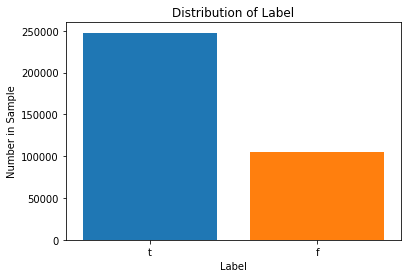

In [8]:
for col in PREDICTED:
    plot_hist(df, col, 'Label', top_k=None, sort=True)

### Explore Temporal Element of Data

In [9]:
disaggregate_thyme(df, 'date_posted', 'year')

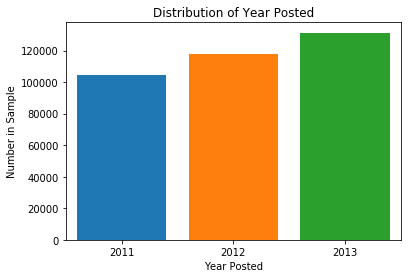

In [10]:
plot_hist(df, 'date_posted_year', 'Year Posted', top_k=None, sort=False)

In [11]:
disaggregate_thyme(df, 'date_posted', 'month')

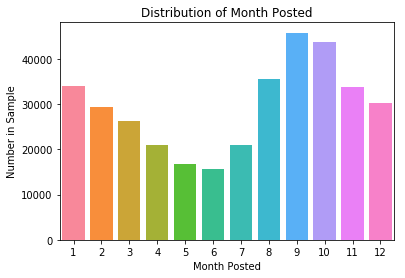

In [12]:
plot_hist(df, 'date_posted_month', 'Month Posted', top_k=None, sort=False)

### Histograms for Categorical Variables

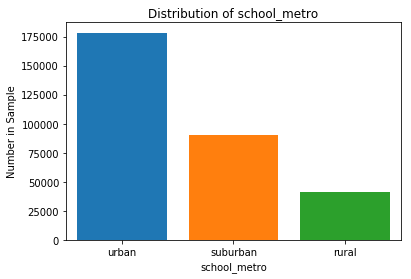

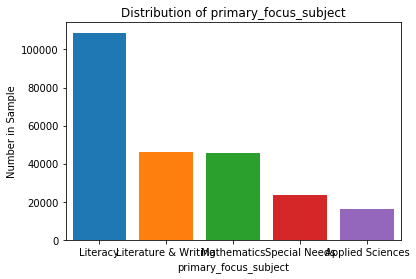

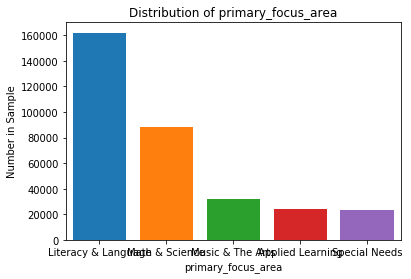

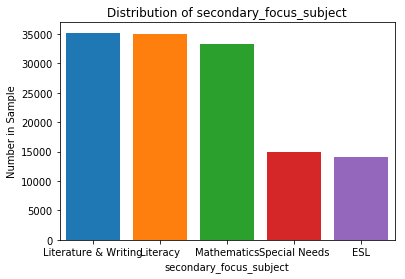

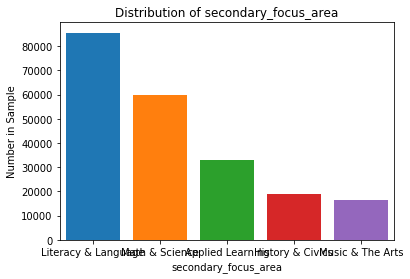

...

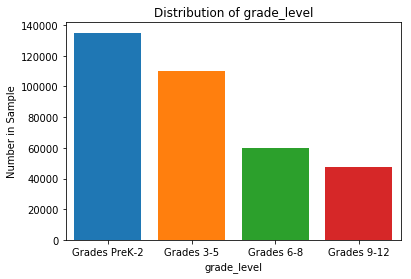

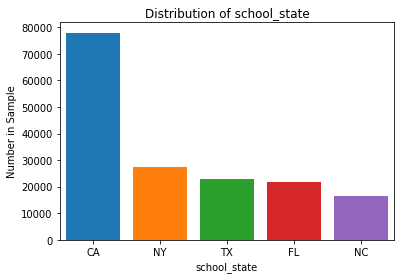

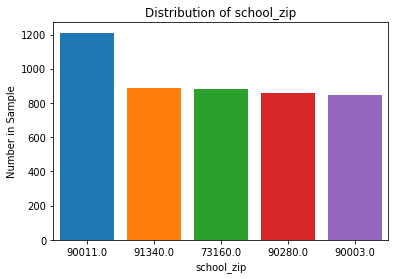

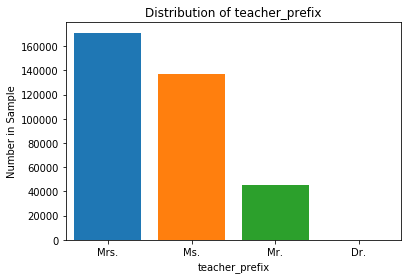

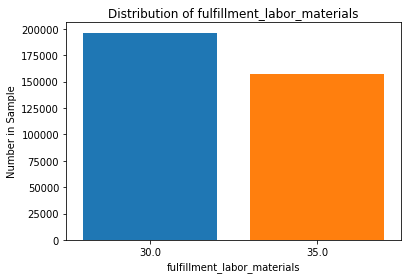

In [13]:
for col in CATEGORICAL:
    plot_hist(df, col, col, 5)

### Plot Binary

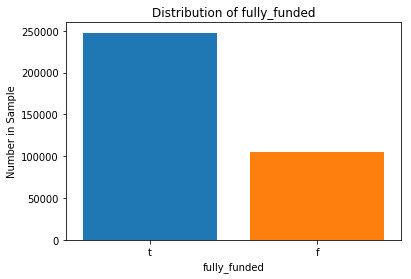

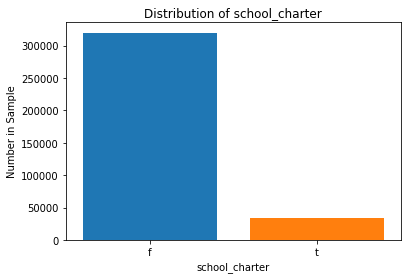

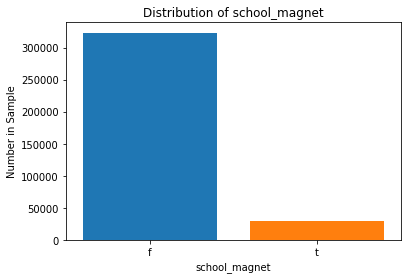

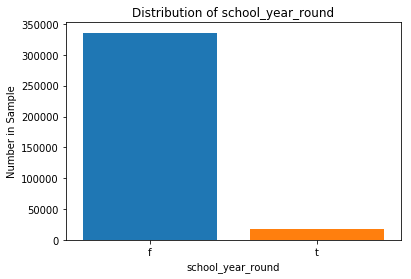

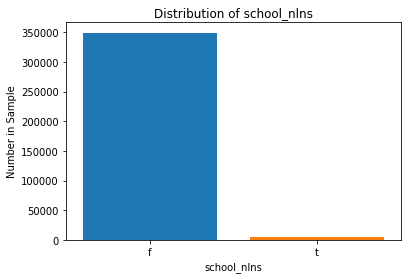

...

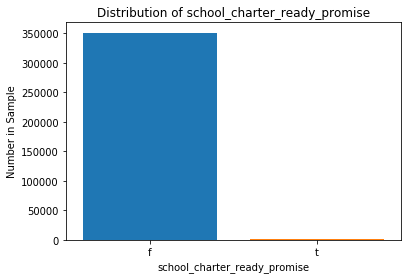

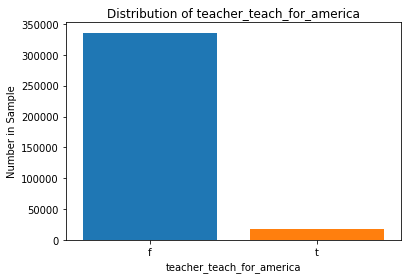

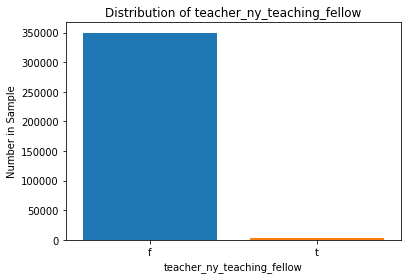

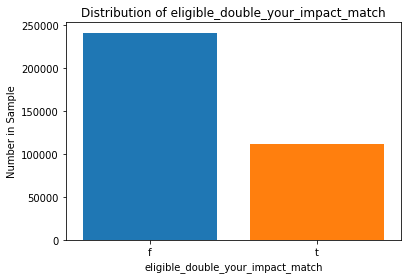

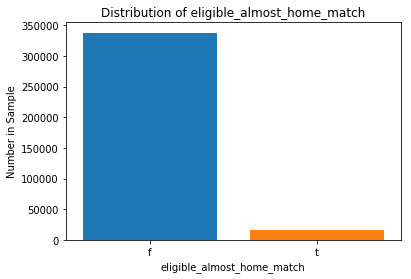

In [14]:
for col in BINARY:
    plot_hist(df, col, col, top_k=None)

### Plot Density of Continuous Variables

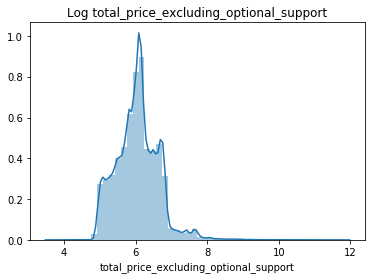

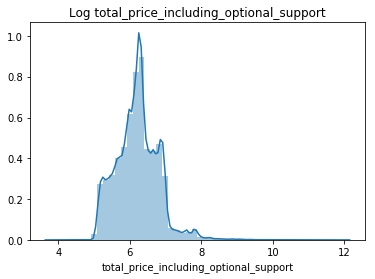

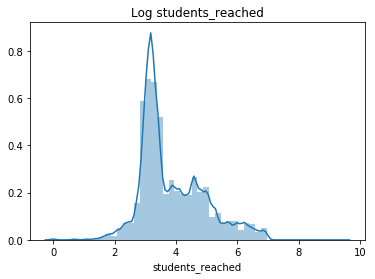

In [15]:
for col in OTHERS:
    if col not in ID:
        density_plot(df, col, log_=True)

## Run Preliminary Model and Validate Using Temporal Splits

### Data Pre-Processing Workflow will be implemented on training and test splits

In [21]:
c, v = CUTOFF_VAL_PAIRS[-1]
train, test = temporal_split(df, DATE_COL, c, v)
cl_train, cl_test, features = pre_process(train, test)

Booleans converted: fully_funded
Dummified: school_state
Dummified: school_zip
Dummified: school_metro
Booleans converted: school_charter
Booleans converted: school_magnet
Booleans converted: school_year_round
Booleans converted: school_nlns
Booleans converted: school_kipp
Booleans converted: school_charter_ready_promise
Dummified: teacher_prefix
Booleans converted: teacher_teach_for_america
Booleans converted: teacher_ny_teaching_fellow
Dummified: primary_focus_subject
Dummified: primary_focus_area
Dummified: secondary_focus_subject
Dummified: secondary_focus_area
Dummified: resource_type
Dummified: grade_level
Dummified: fulfillment_labor_materials
Normalizing: total_price_excluding_optional_support
Normalizing: total_price_including_optional_support
Missing values imputed: students_reached
Normalizing: students_reached
Booleans converted: eligible_double_your_impact_match
Booleans converted: eligible_almost_home_match
Getting month of date_posted


### Features

In [24]:
features

{'date_posted_month',
 'eligible_almost_home_match',
 'eligible_double_your_impact_match',
 'fulfillment_labor_materials_is_30.0',
 'fulfillment_labor_materials_is_35.0',
 'fulfillment_labor_materials_is_nan',
 'fulfillment_labor_materials_is_others',
 'grade_level_is_Grades 3-5',
 'grade_level_is_Grades 6-8',
 'grade_level_is_Grades 9-12',
 'grade_level_is_Grades PreK-2',
 'grade_level_is_nan',
 'grade_level_is_others',
 'primary_focus_area_is_Applied Learning',
 'primary_focus_area_is_Literacy & Language',
 'primary_focus_area_is_Math & Science',
 'primary_focus_area_is_Music & The Arts',
 'primary_focus_area_is_Special Needs',
 'primary_focus_area_is_nan',
 'primary_focus_area_is_others',
 'primary_focus_subject_is_Literacy',
 'primary_focus_subject_is_Literature & Writing',
 'primary_focus_subject_is_Mathematics',
 'primary_focus_subject_is_Special Needs',
 'primary_focus_subject_is_Visual Arts',
 'primary_focus_subject_is_nan',
 'primary_focus_subject_is_others',
 'resource_type_i

### Take a look a feature importance based on full training data from January 2011 to June 2013

In [11]:
TO_RUN = ['AB', 'RF', 'DT', 'LR', 'NB', 'KNN', 'BAG']

In [12]:
GRID = SMALL_GRID

### Full results are below

### Results Using Only the Last Time Period (Not Using Feature Importance)

CUTOFF: 2013-06-30 VALIDATION: 2013-12-31
Booleans converted: fully_funded
Dummified: school_state
Dummified: school_zip
Dummified: school_metro
Booleans converted: school_charter
Booleans converted: school_magnet
Booleans converted: school_year_round
Booleans converted: school_nlns
Booleans converted: school_kipp
Booleans converted: school_charter_ready_promise
Dummified: teacher_prefix
Booleans converted: teacher_teach_for_america
Booleans converted: teacher_ny_teaching_fellow
Dummified: primary_focus_subject
Dummified: primary_focus_area
Dummified: secondary_focus_subject
Dummified: secondary_focus_area
Dummified: resource_type
Dummified: grade_level
Dummified: fulfillment_labor_materials
Normalizing: total_price_excluding_optional_support
Normalizing: total_price_including_optional_support
Missing values imputed: students_reached
Normalizing: students_reached
Booleans converted: eligible_double_your_impact_match
Booleans converted: eligible_almost_home_match
Getting month of date_p

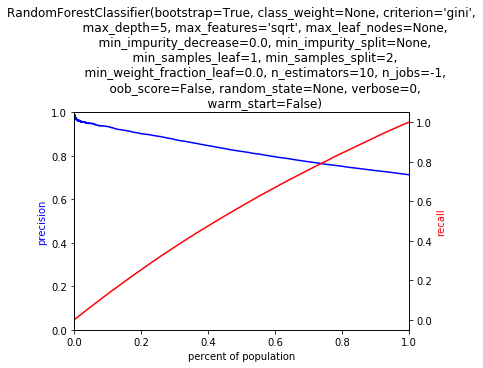

14.33182692527771


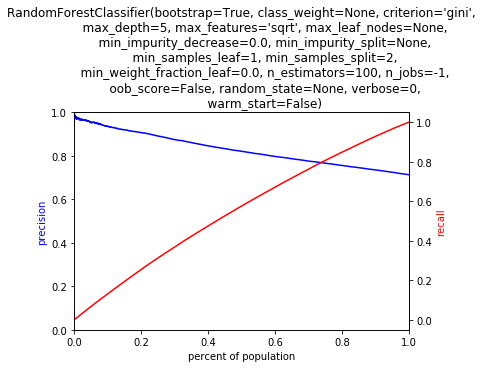

2.5107667446136475


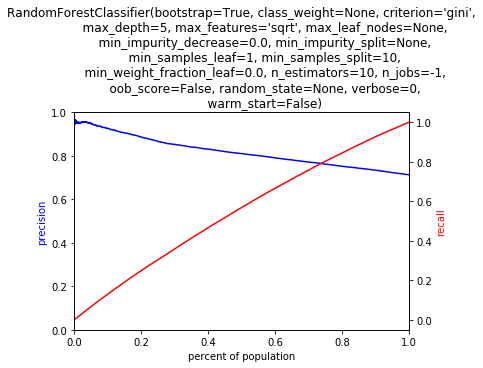

16.64533305168152


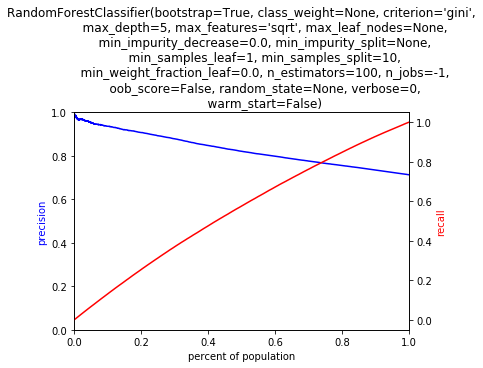

3.545130968093872


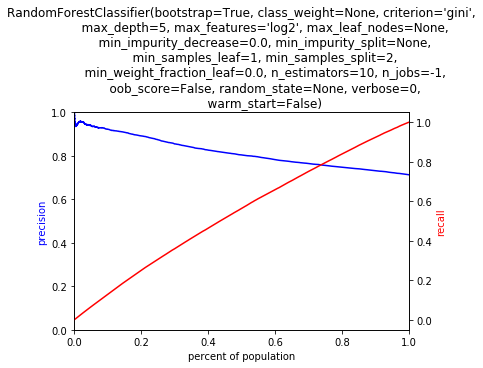

13.612735033035278


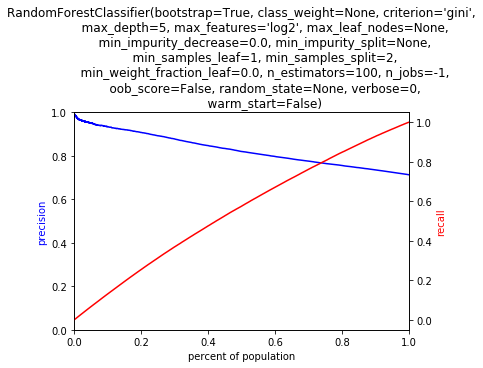

2.242553234100342


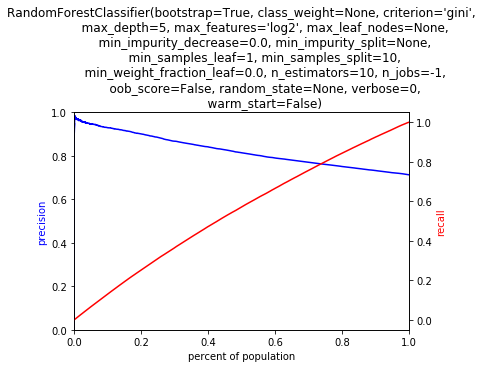

11.582365036010742


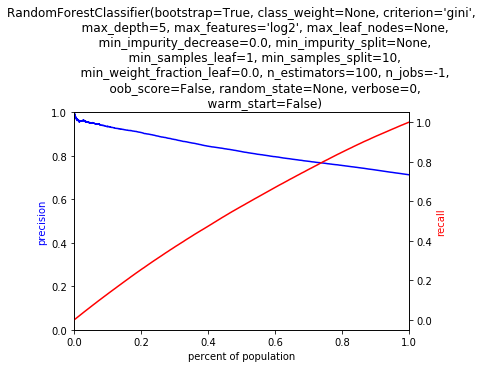

6.325985670089722


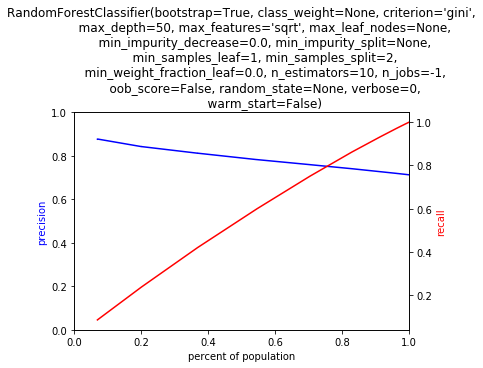

51.86922311782837


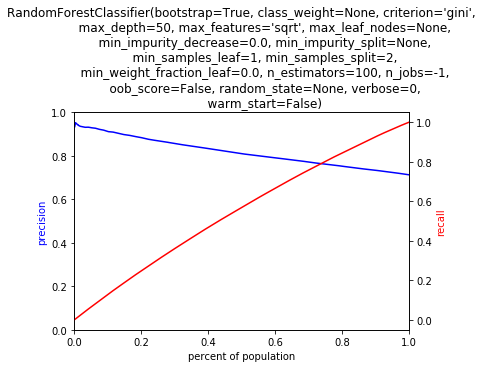

5.924946069717407


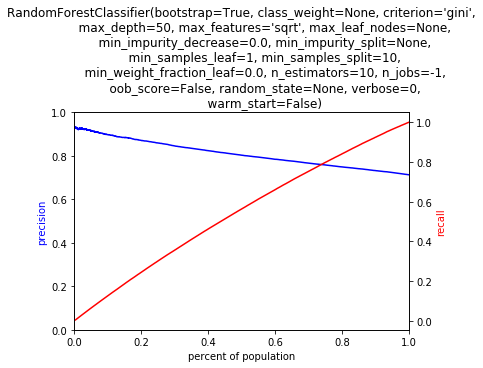

56.512791872024536


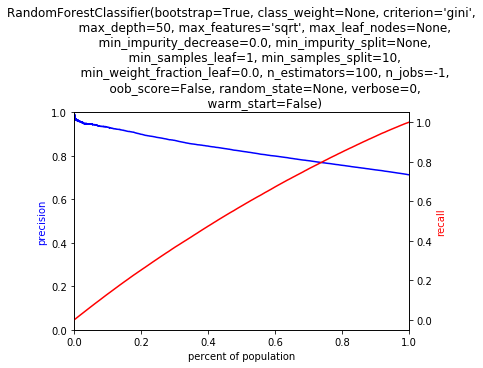

5.371253967285156


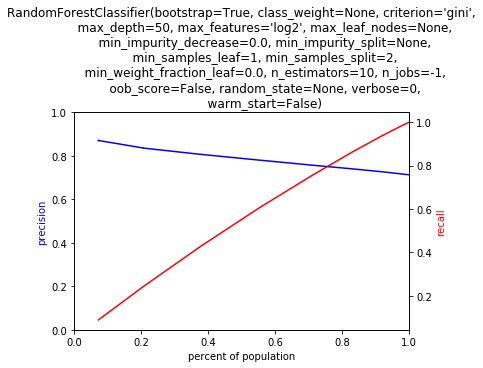

50.87186908721924


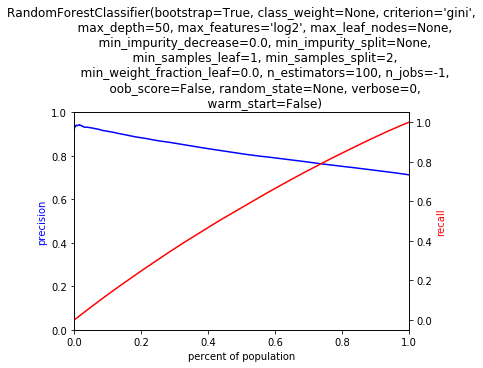

5.265699863433838


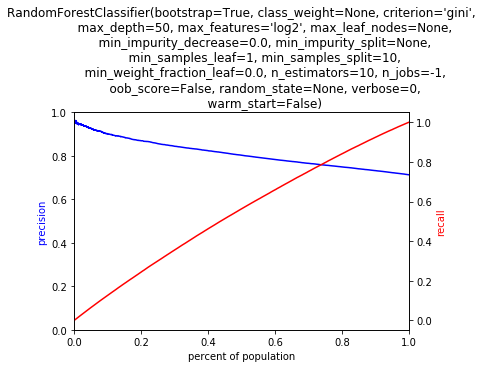

42.957815170288086


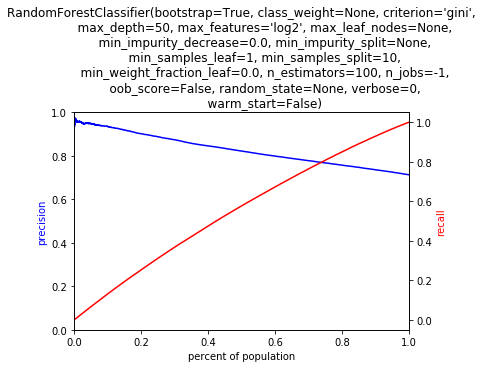

DT
{'criterion': ['gini', 'entropy'], 'max_depth': [10, 20, 50], 'max_features': ['sqrt', 'log2'], 'min_samples_split': [2, 5, 10]}
1.3931570053100586


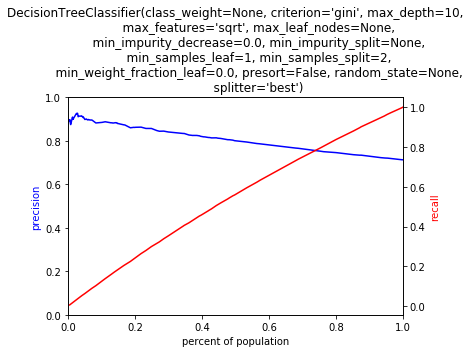

1.3731391429901123


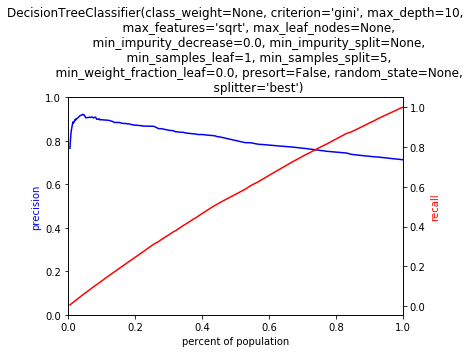

1.2570240497589111


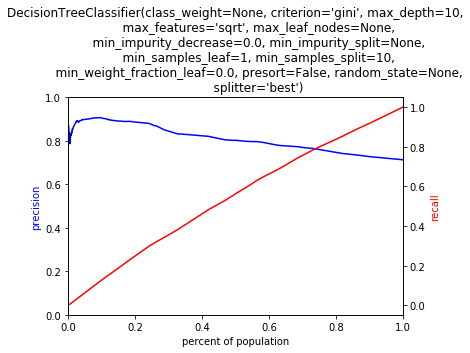

1.0295860767364502


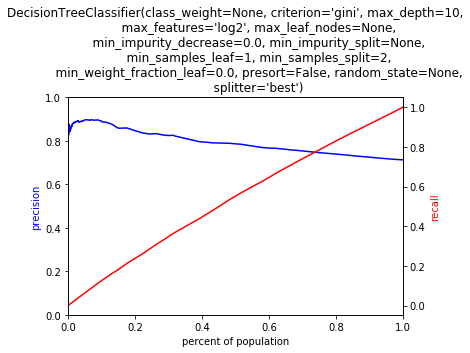

1.4046099185943604


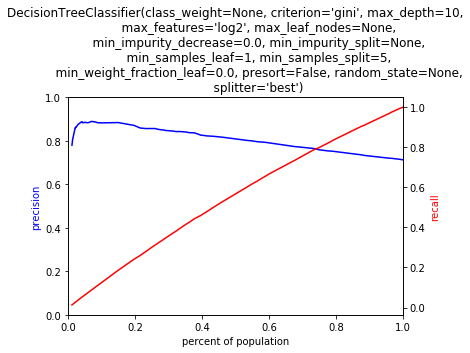

1.119736909866333


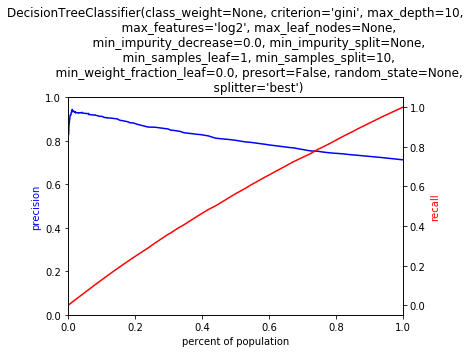

1.6474881172180176


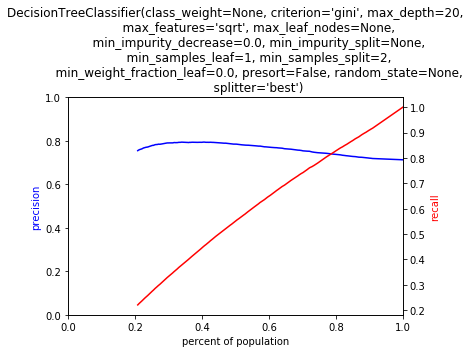

1.9573659896850586


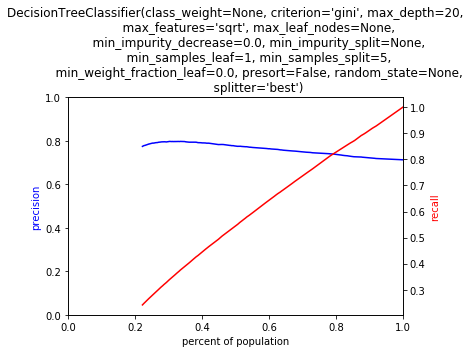

1.727863073348999


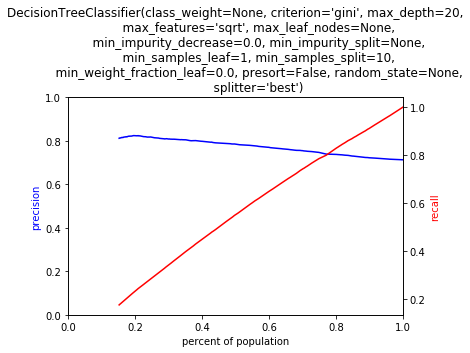

1.5167429447174072


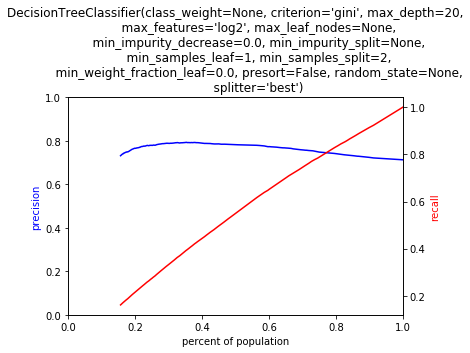

1.5143139362335205


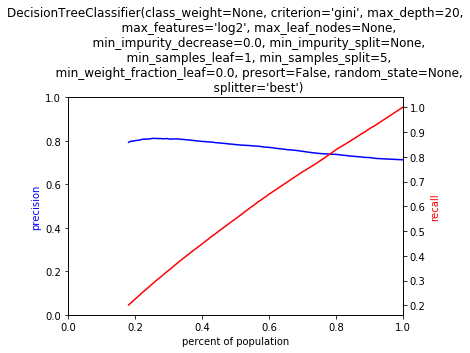

1.6039292812347412


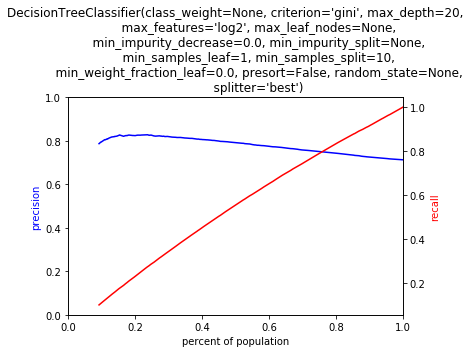

2.395104169845581


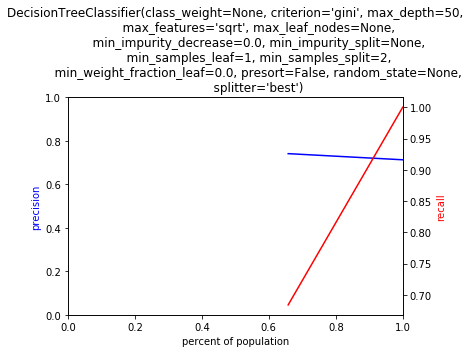

2.3326961994171143


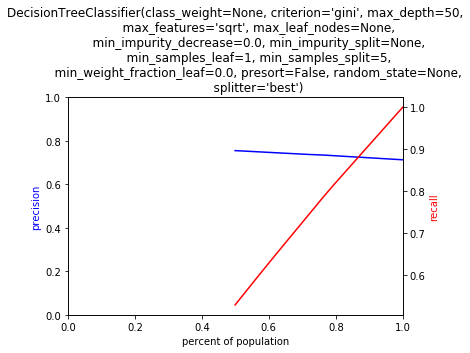

2.457058906555176


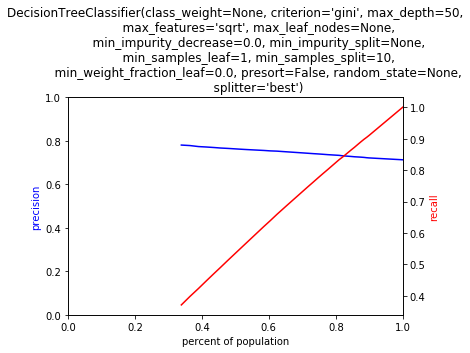

1.8861887454986572


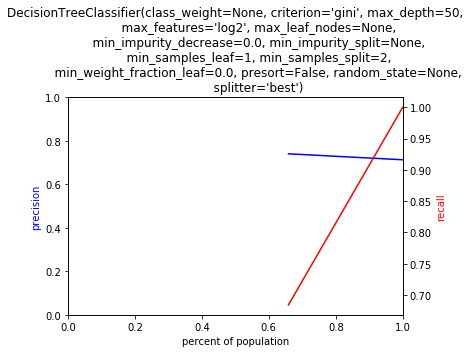

2.134458065032959


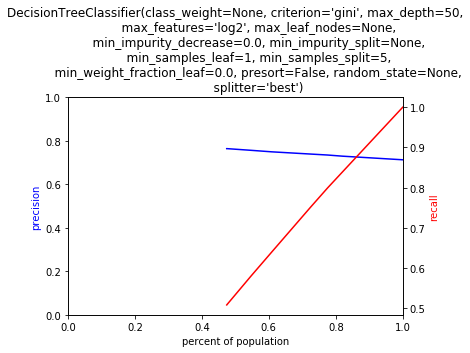

1.6198289394378662


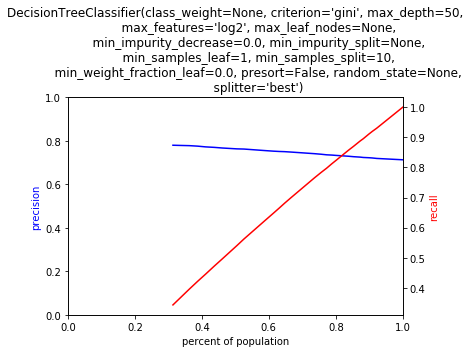

1.216831922531128


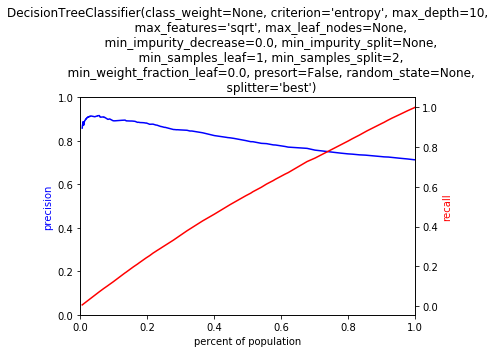

1.4166531562805176


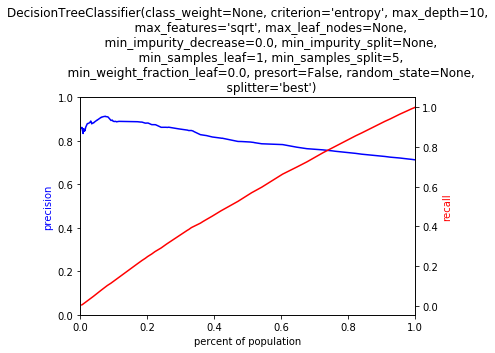

1.4132680892944336


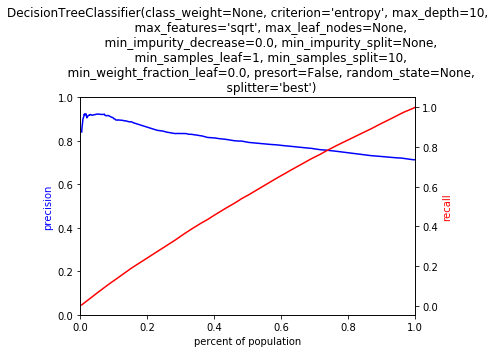

1.248666763305664


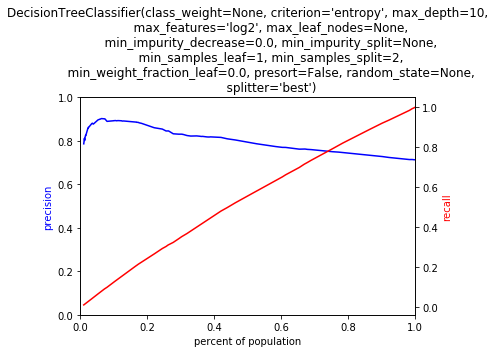

1.3629848957061768


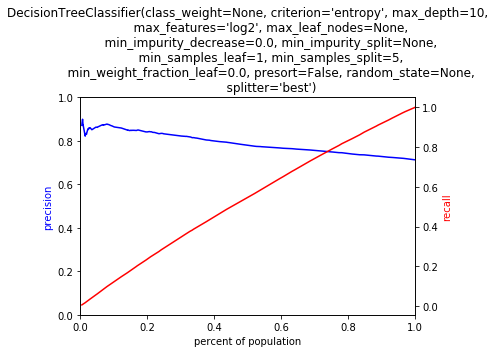

1.3649709224700928


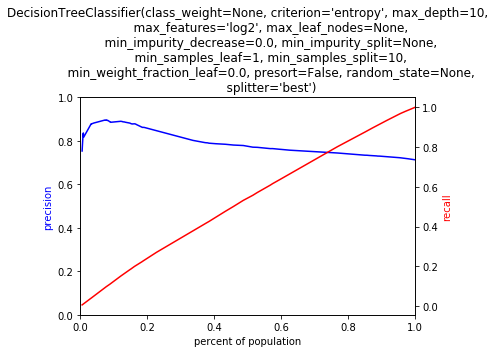

1.8920810222625732


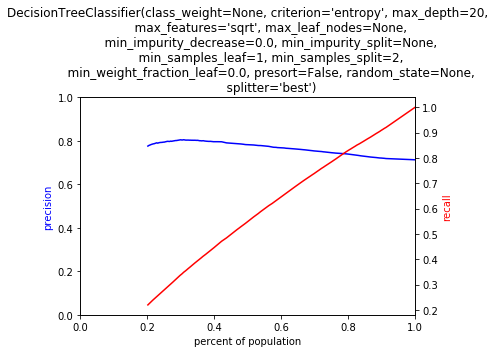

3.060025691986084


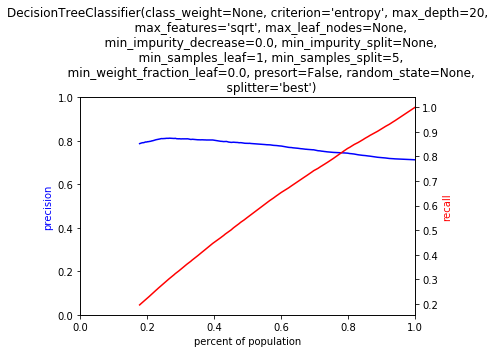

1.9529600143432617


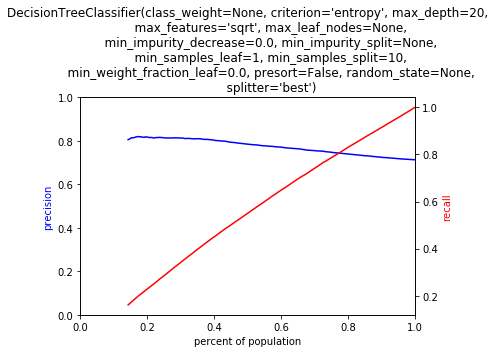

1.682586669921875


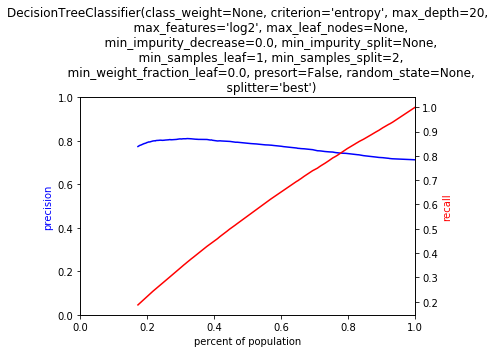

1.7021050453186035


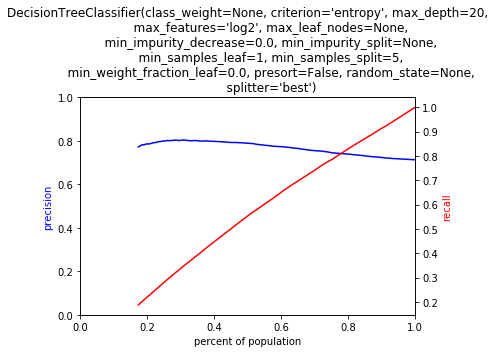

2.334662914276123


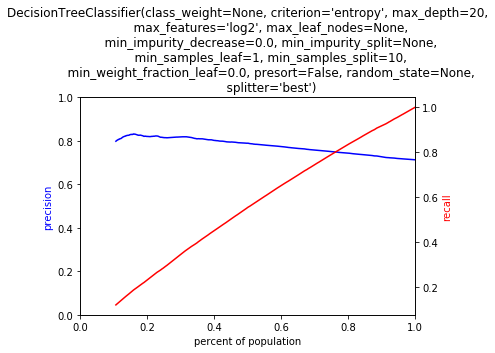

2.2867720127105713


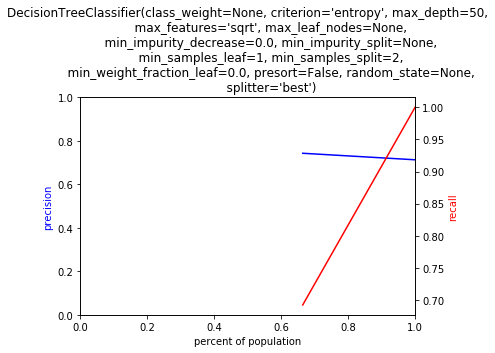

2.0706982612609863


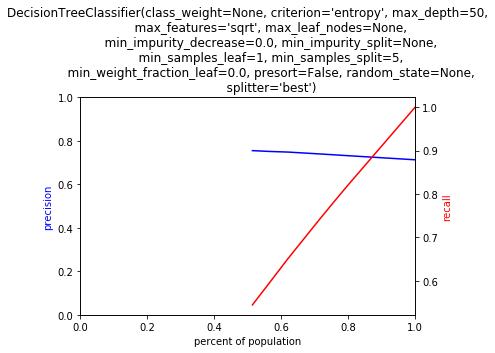

2.1412508487701416


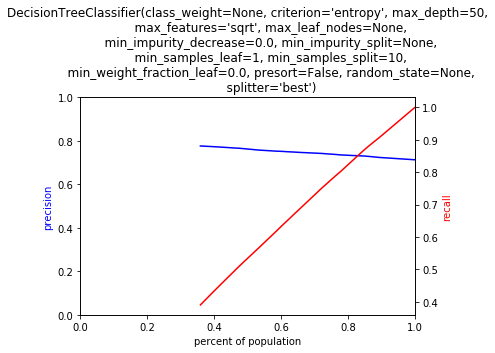

2.1001720428466797


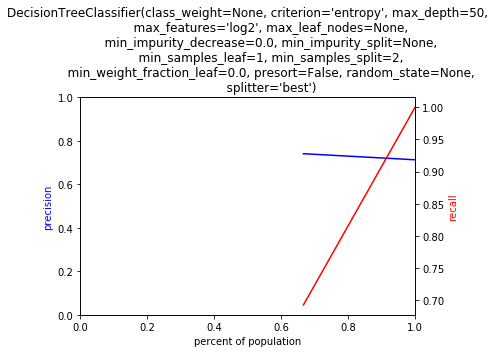

1.6447339057922363


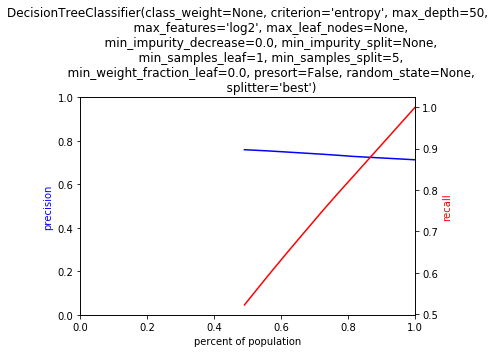

1.671116828918457


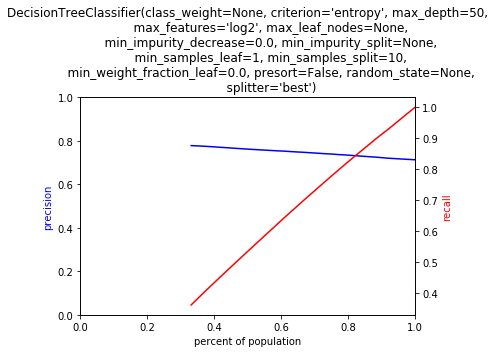

LR
{'penalty': ['l1', 'l2'], 'C': [0.001, 0.1, 1]}
2.393275737762451


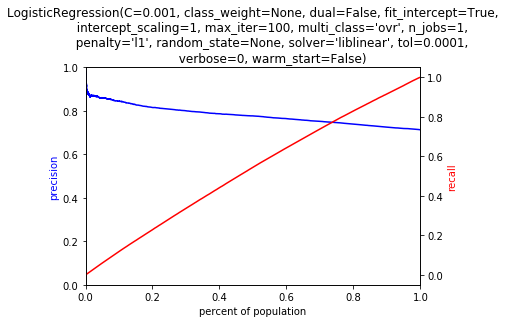

2.683943271636963


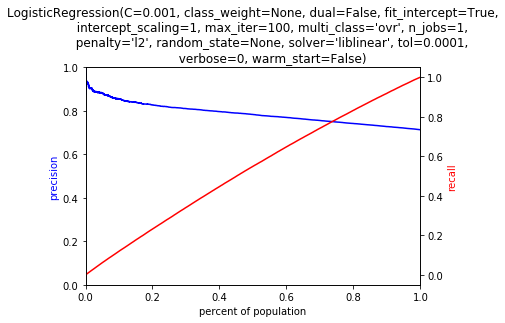

47.254833936691284


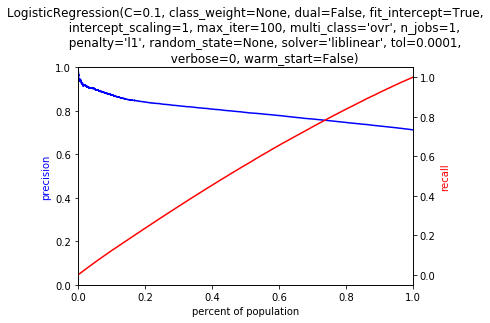

7.609849214553833


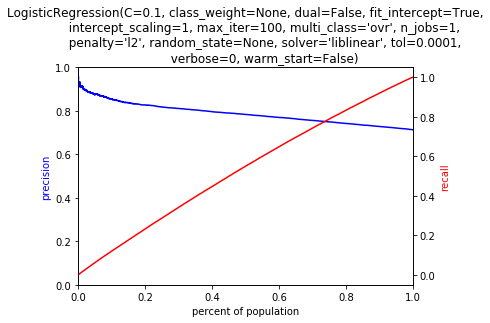

52.30192279815674


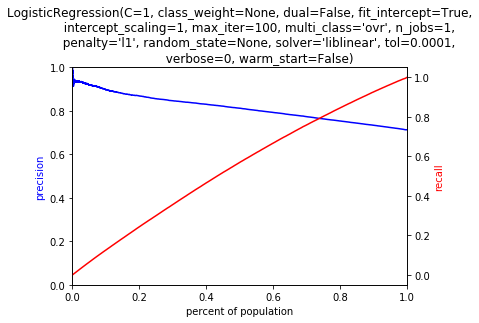

26.721357822418213


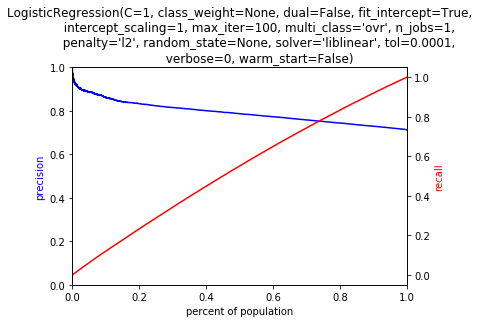

NB
{}
2.0721583366394043


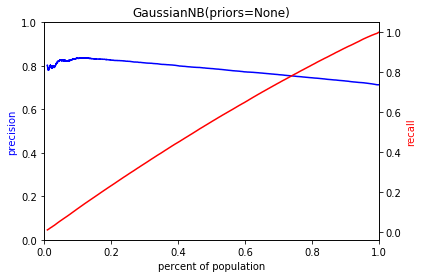

BAG
{'n_estimators': [10], 'max_samples': [5], 'max_features': [5, 10], 'bootstrap_features': [False, True]}
1.0785150527954102


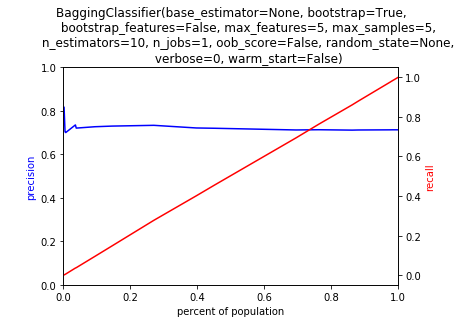

1.167151927947998


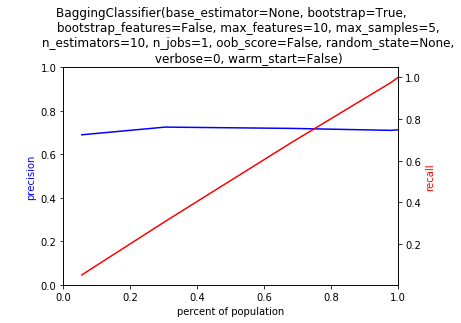

1.0560200214385986


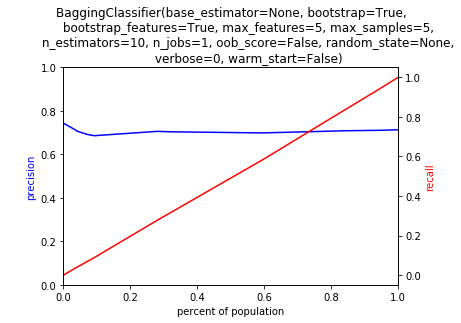

1.168379783630371


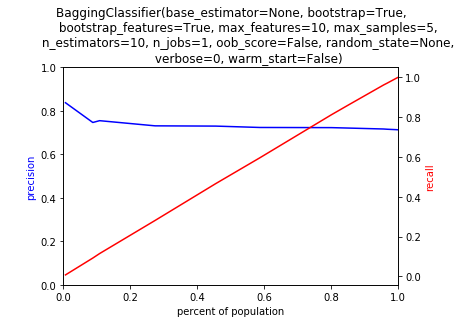

AB
{'algorithm': ['SAMME', 'SAMME.R'], 'n_estimators': [10, 100, 1000]}
6.797390937805176


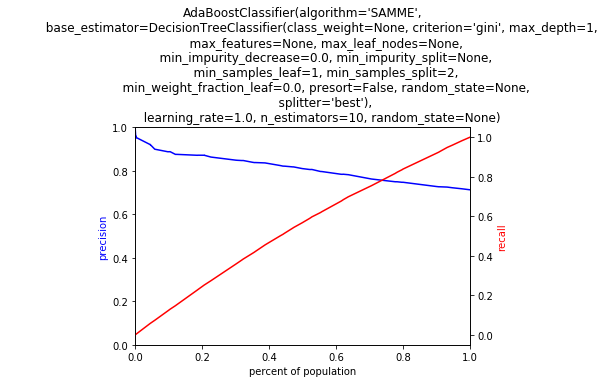

53.49348497390747


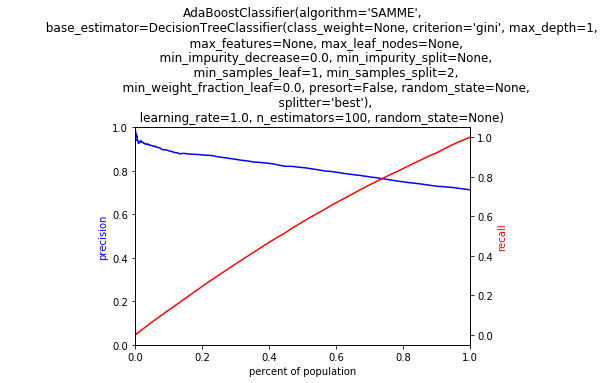

554.1180970668793


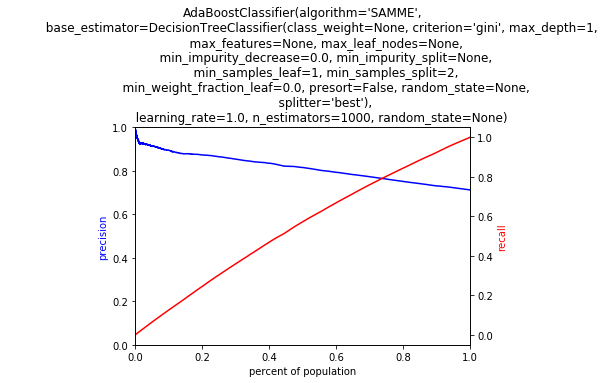

7.932096004486084


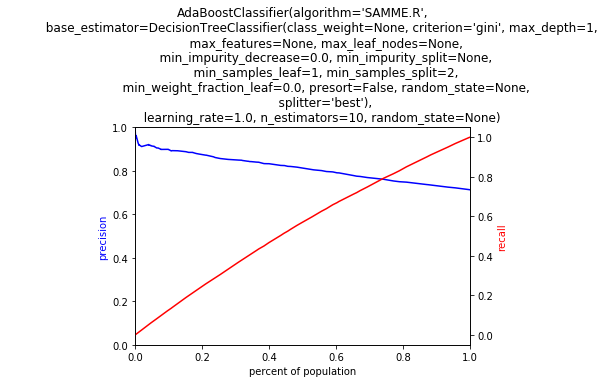

60.28333640098572


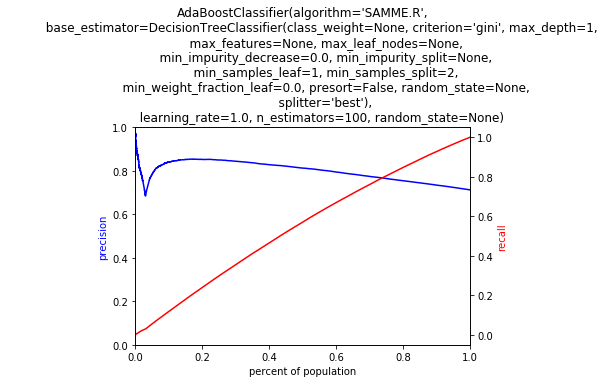

516.4725501537323


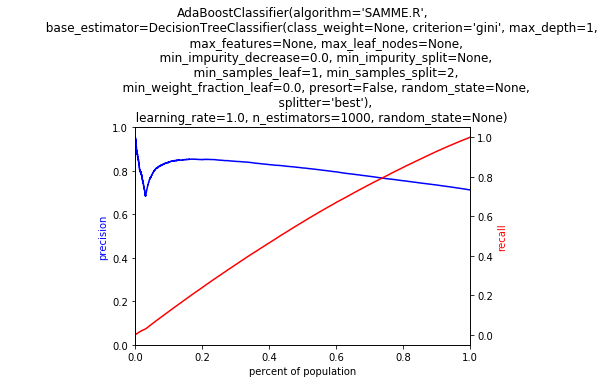

In [14]:
sg_final_test = tempura_validation_loop(df, CUTOFF_VAL_PAIRS[-1:], SMALL_GRID, 
                        ['RF', 'DT', 'LR', 'NB', 'BAG', 'AB'], 
                        'results/small_grid_final_test.pkl', use_importance=False)

In [15]:
sg_final_test

,model_type,clf,parameters,validation_date,train_set_size,validation_set_size,baseline,precision_at_5,precision_at_10,precision_at_20,precision_at_30,precision_at_50,recall_at_5,recall_at_10,recall_at_20,recall_at_30,recall_at_50,auc-roc,time_elapsed,features_used
0,RF,"(DecisionTreeClassifier(class_weight=None, cri...","{'max_depth': 5, 'max_features': 'sqrt', 'min_...",2013-12-31,265017,88134,0.712914,0.949160,0.934529,0.902020,0.875340,0.820478,0.066558,0.131080,0.253040,0.368347,0.575439,0.676407,2.546276,ALL
1,RF,"(DecisionTreeClassifier(class_weight=None, cri...","{'max_depth': 5, 'max_features': 'sqrt', 'min_...",2013-12-31,265017,88134,0.712914,0.953926,0.935663,0.906842,0.875000,0.820864,0.066893,0.131239,0.254393,0.368204,0.575710,0.681524,14.331827,ALL
2,RF,"(DecisionTreeClassifier(class_weight=None, cri...","{'max_depth': 5, 'max_features': 'sqrt', 'min_...",2013-12-31,265017,88134,0.712914,0.948479,0.926586,0.886304,0.852307,0.810992,0.066511,0.129966,0.248631,0.358655,0.568787,0.664217,2.510767,ALL
3,RF,"(DecisionTreeClassifier(class_weight=None, cri...","{'max_depth': 5, 'max_features': 'sqrt', 'min_...",2013-12-31,265017,88134,0.712914,0.953473,0.936117,0.907353,0.878480,0.820977,0.066861,0.131303,0.254536,0.369668,0.575789,0.681867,16.645333,ALL
4,RF,"(DecisionTreeClassifier(class_weight=None, cri...","{'max_depth': 5, 'max_features': 'log2', 'min_...",2013-12-31,265017,88134,0.712914,0.941897,0.922614,0.891921,0.856694,0.804366,0.066049,0.129409,0.250207,0.360501,0.564139,0.655641,3.545131,ALL
5,RF,"(DecisionTreeClassifier(class_weight=None, cri...","{'max_depth': 5, 'max_features': 'log2', 'min_...",2013-12-31,265017,88134,0.712914,0.951203,0.934188,0.907523,0.877874,0.820047,0.066702,0.131032,0.254584,0.369414,0.575137,0.681172,13.612735,ALL
6,RF,"(DecisionTreeClassifier(class_weight=None, cri...","{'max_depth': 5, 'max_features': 'log2', 'min_...",2013-12-31,265017,88134,0.712914,0.947118,0.929990,0.900772,0.867133,0.814396,0.066415,0.130443,0.252690,0.364894,0.571174,0.669294,2.242553,ALL
7,RF,"(DecisionTreeClassifier(class_weight=None, cri...","{'max_depth': 5, 'max_features': 'log2', 'min_...",2013-12-31,265017,88134,0.712914,0.950522,0.935096,0.907126,0.875303,0.819706,0.066654,0.131159,0.254472,0.368331,0.574898,0.679577,11.582365,ALL
8,RF,"(DecisionTreeClassifier(class_weight=None, cri...","{'max_depth': 50, 'max_features': 'sqrt', 'min...",2013-12-31,265017,88134,0.712914,1.000000,0.914445,0.844831,0.894516,0.853632,0.070124,0.128263,0.236997,0.376416,0.598692,0.626956,6.325986,ALL
9,RF,"(DecisionTreeClassifier(class_weight=None, cri...","{'max_depth': 50, 'max_features': 'sqrt', 'min...",2013-12-31,265017,88134,0.712914,0.941897,0.926926,0.892545,0.860514,0.818118,0.066049,0.130013,0.250382,0.362108,0.573784,0.664284,51.869223,ALL


In [17]:
sg_final_test[sg_final_test['auc-roc'] == sg_final_test['auc-roc'].max()]

,model_type,clf,parameters,validation_date,train_set_size,validation_set_size,baseline,precision_at_5,precision_at_10,precision_at_20,precision_at_30,precision_at_50,recall_at_5,recall_at_10,recall_at_20,recall_at_30,recall_at_50,auc-roc,time_elapsed,features_used
15,RF,"(DecisionTreeClassifier(class_weight=None, cri...","{'max_depth': 50, 'max_features': 'log2', 'min...",2013-12-31,265017,88134,0.712914,0.948706,0.935323,0.90185,0.874054,0.822021,0.066527,0.131191,0.252992,0.367806,0.576522,0.682583,42.957815,ALL


In [20]:
last_slice = sg_ft_imp_results[sg_ft_imp_results.validation_date == '2013-12-31']
last_slice[last_slice['auc-roc'] == last_slice['auc-roc'].max()]

,model_type,clf,parameters,validation_date,train_set_size,validation_set_size,baseline,precision_at_5,precision_at_10,precision_at_20,precision_at_30,precision_at_50,recall_at_5,recall_at_10,recall_at_20,recall_at_30,recall_at_50,auc-roc,time_elapsed,features_used
279,RF,"(DecisionTreeClassifier(class_weight=None, cri...","{'max_depth': 5, 'max_features': 'sqrt', 'min_...",2013-12-31,265017,88134,0.712914,0.951884,0.931238,0.900885,0.86441,0.810039,0.066749,0.130618,0.252722,0.363748,0.568118,0.665376,15.433048,"[total_price_including_optional_support, total..."


### Results Using Feature Importance for Each Time Period 
- (Does not include KNN due to obscene length of testing time)

CUTOFF: 2011-06-30 VALIDATION: 2011-12-31
Booleans converted: fully_funded
Dummified: school_state
Dummified: school_zip
Dummified: school_metro
Booleans converted: school_charter
Booleans converted: school_magnet
Booleans converted: school_year_round
Booleans converted: school_nlns
Booleans converted: school_kipp
Booleans converted: school_charter_ready_promise
Dummified: teacher_prefix
Booleans converted: teacher_teach_for_america
Booleans converted: teacher_ny_teaching_fellow
Dummified: primary_focus_subject
Dummified: primary_focus_area
Dummified: secondary_focus_subject
Dummified: secondary_focus_area
Dummified: resource_type
Dummified: grade_level
Dummified: fulfillment_labor_materials
Normalizing: total_price_excluding_optional_support
Normalizing: total_price_including_optional_support
Missing values imputed: students_reached
Normalizing: students_reached
Booleans converted: eligible_double_your_impact_match
Booleans converted: eligible_almost_home_match
Getting month of date_p

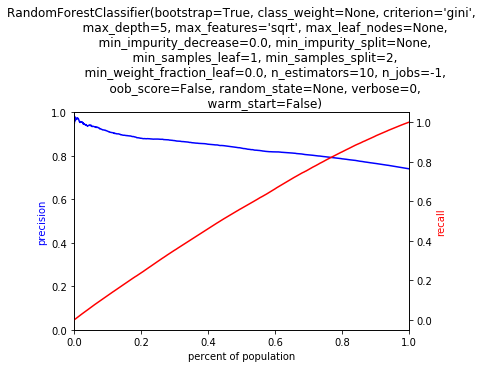

2.573004722595215


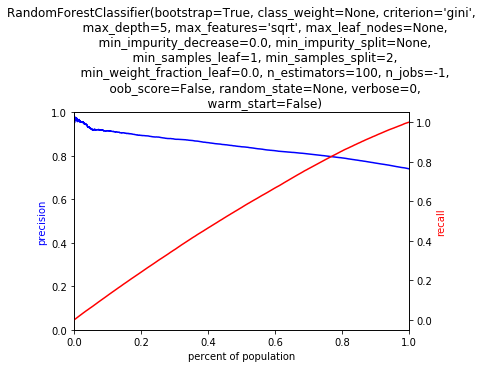

0.719080924987793


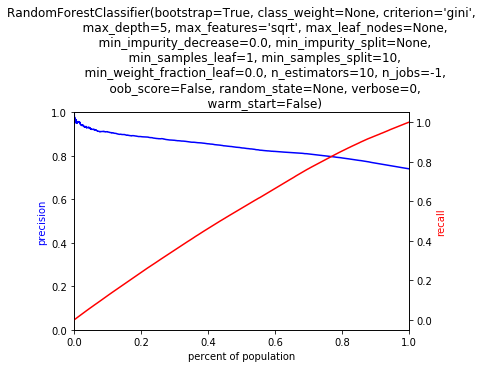

2.011051893234253


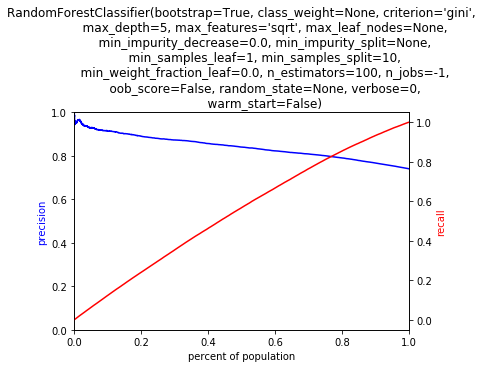

0.5843827724456787


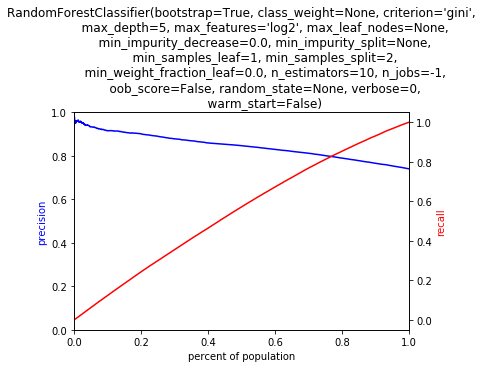

2.009852170944214


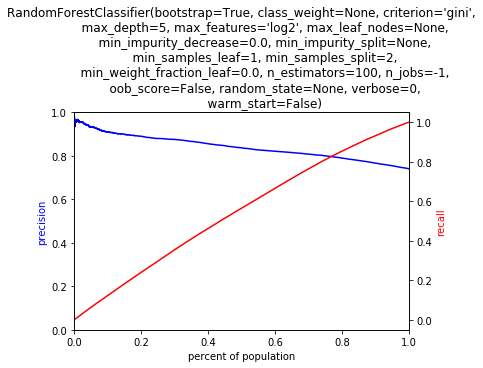

0.6776599884033203


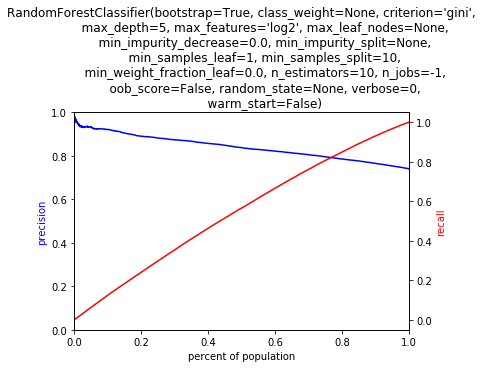

2.1586899757385254


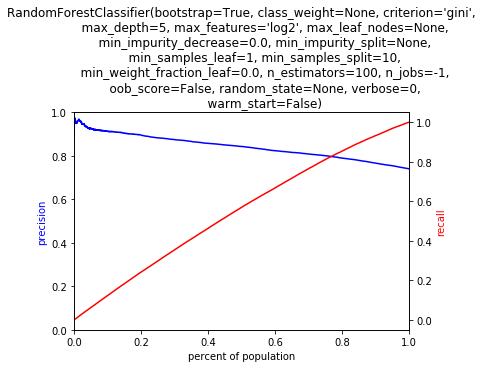

0.925225019454956


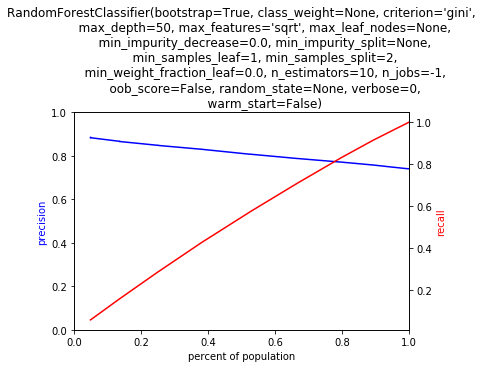

5.154412031173706


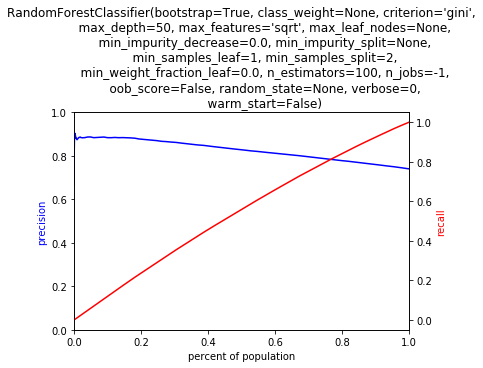

0.8517999649047852


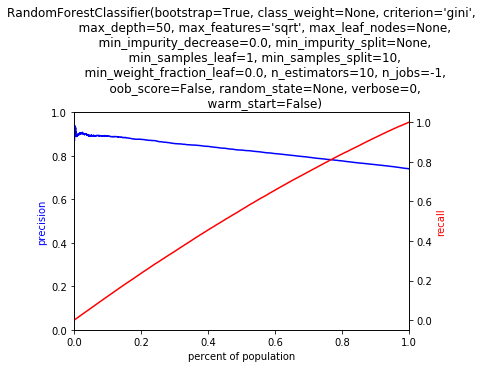

4.5857322216033936


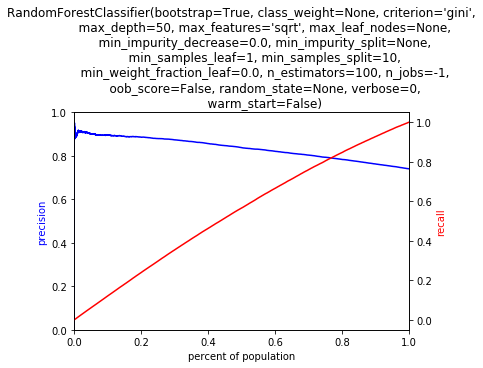

0.9435908794403076


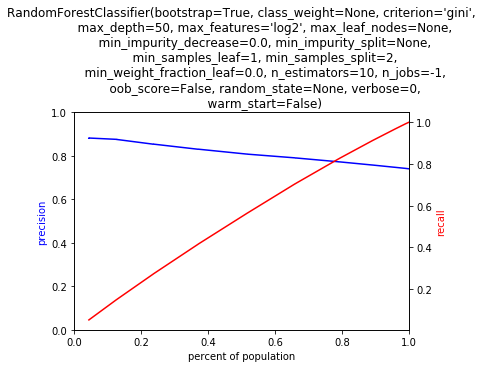

5.375761270523071


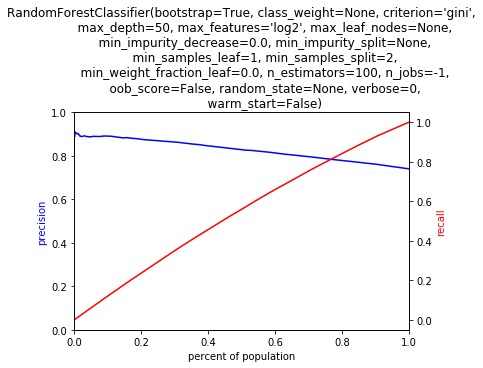

0.945134162902832


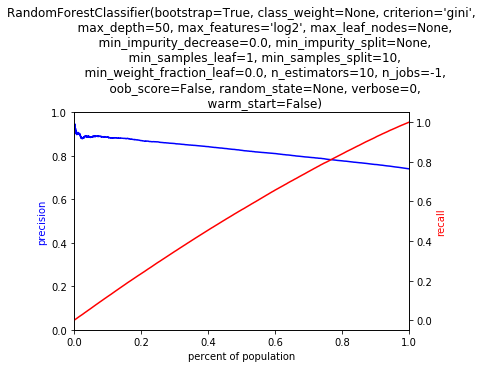

4.858380079269409


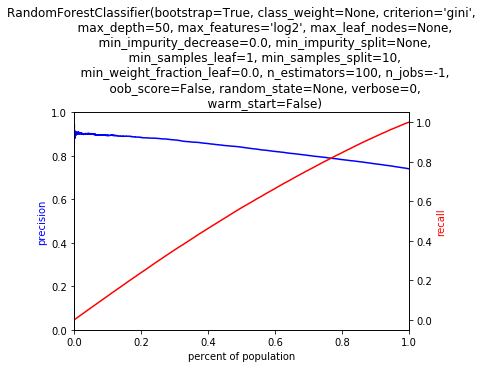

DT
{'criterion': ['gini', 'entropy'], 'max_depth': [10, 20, 50], 'max_features': ['sqrt', 'log2'], 'min_samples_split': [2, 5, 10]}
0.3243870735168457


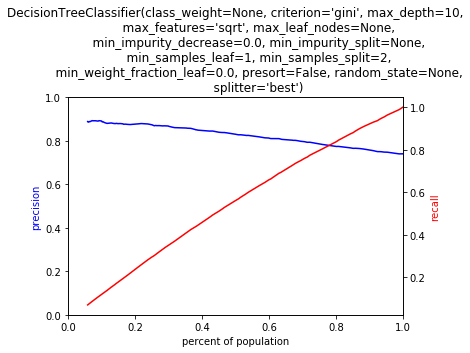

0.30744385719299316


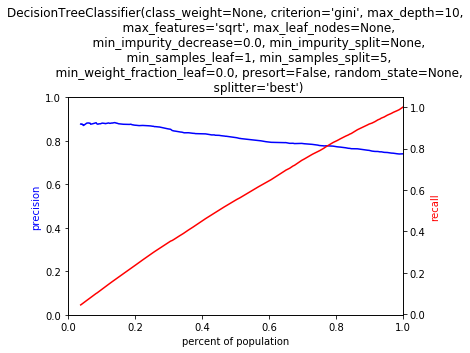

0.3571510314941406


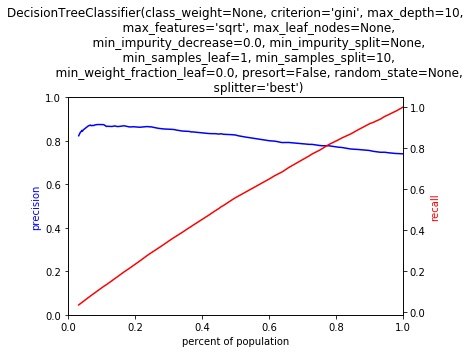

0.3272421360015869


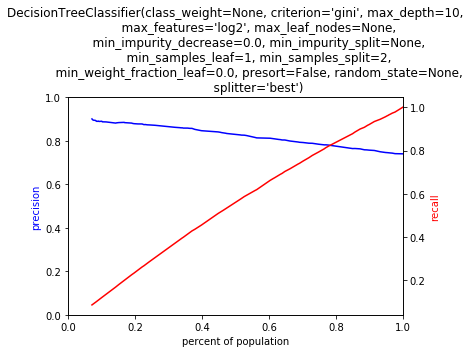

0.41613101959228516


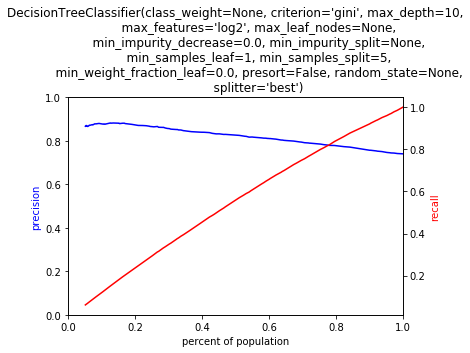

0.3813161849975586


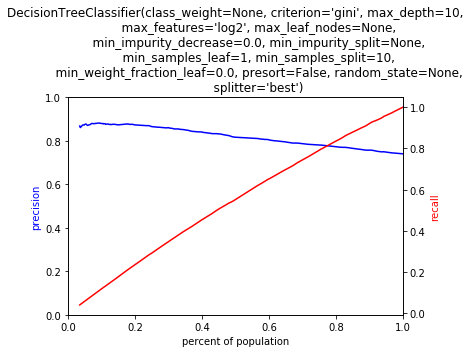

0.32348203659057617


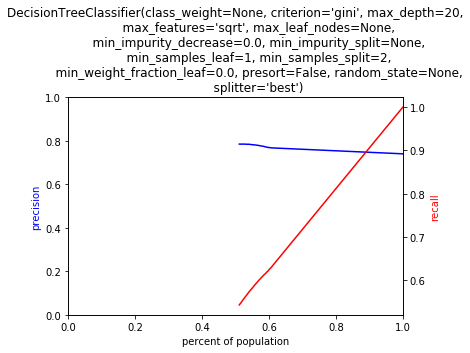

0.3070671558380127


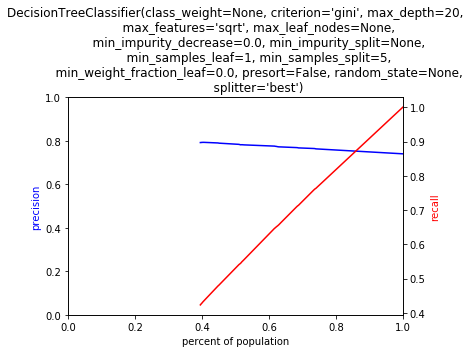

0.3211050033569336


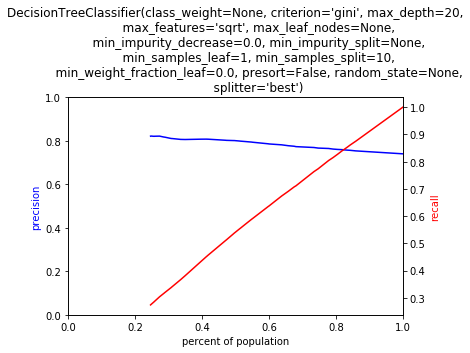

0.380321741104126


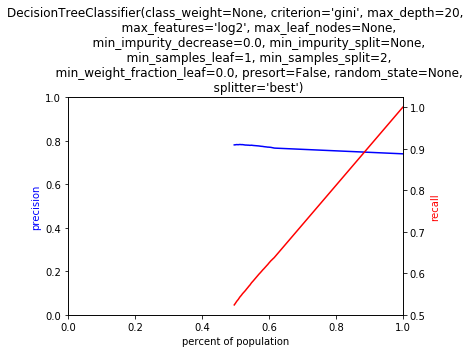

0.38474202156066895


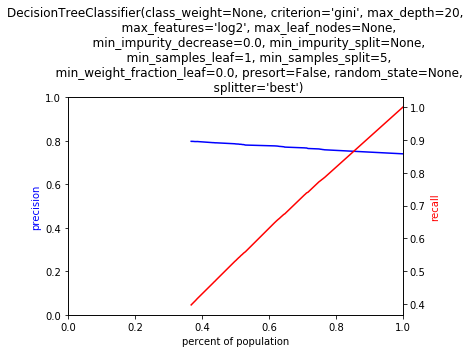

0.3912689685821533


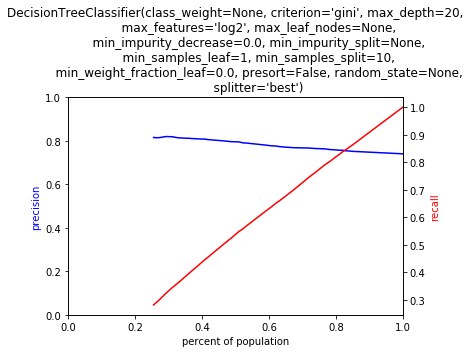

0.30783987045288086


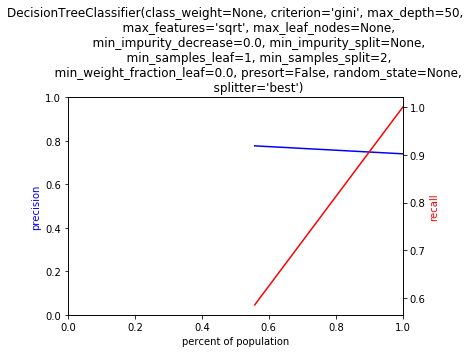

0.30886387825012207


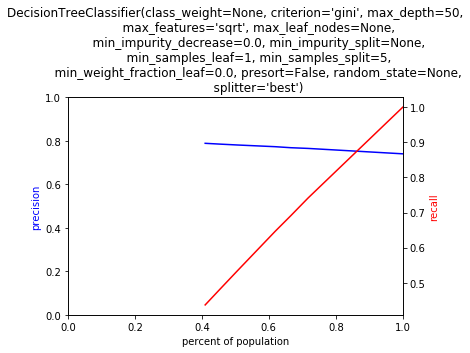

0.4129011631011963


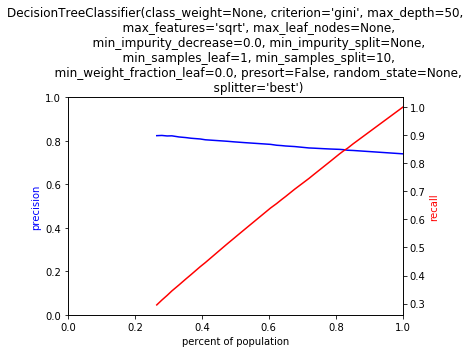

0.37700796127319336


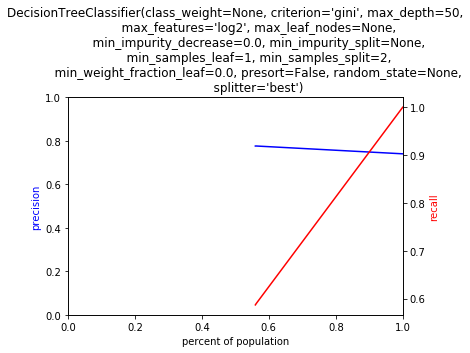

0.3658008575439453


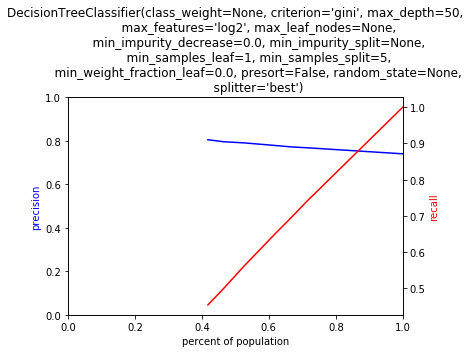

0.3445312976837158


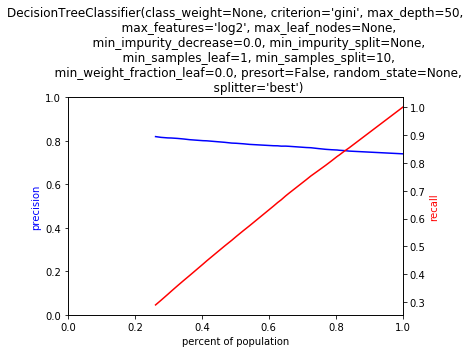

0.33878302574157715


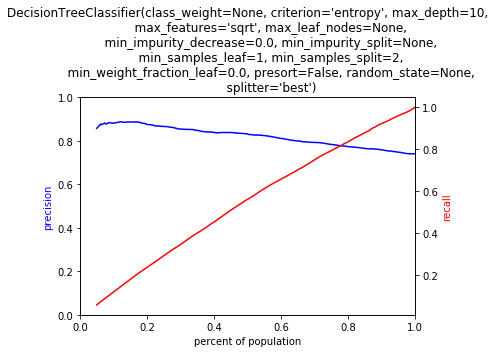

0.4202587604522705


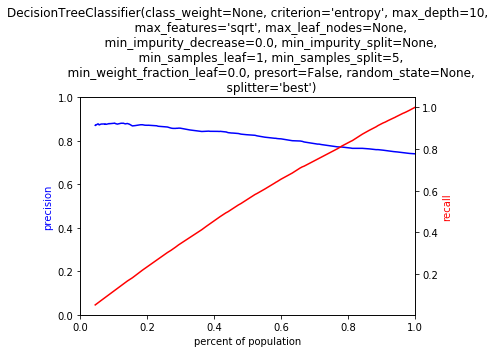

0.3957250118255615


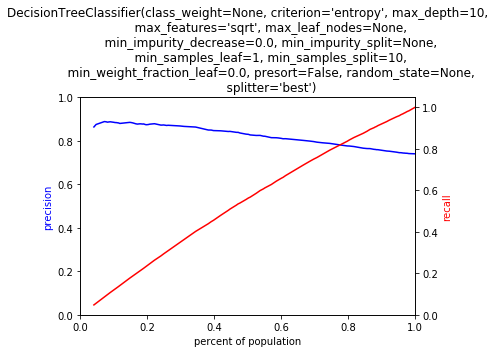

0.5268368721008301


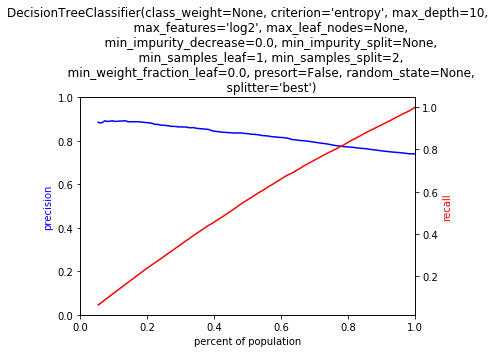

0.32511115074157715


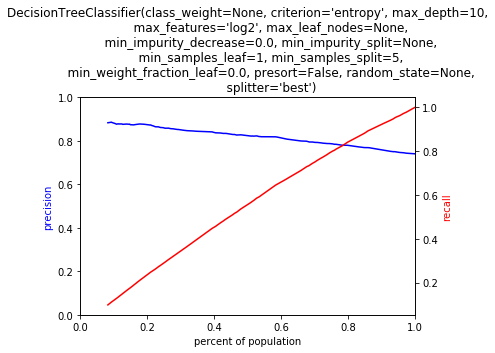

0.5111920833587646


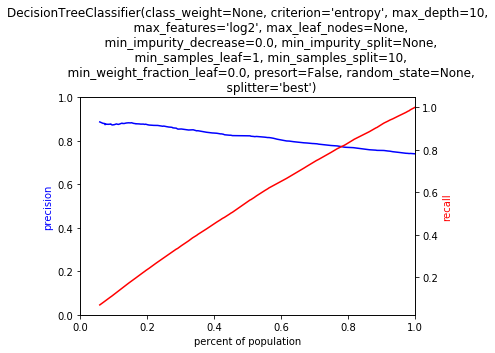

0.3350996971130371


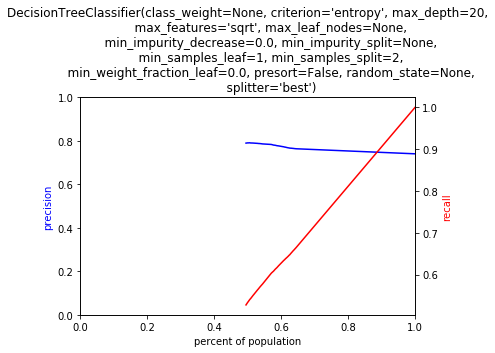

0.34443020820617676


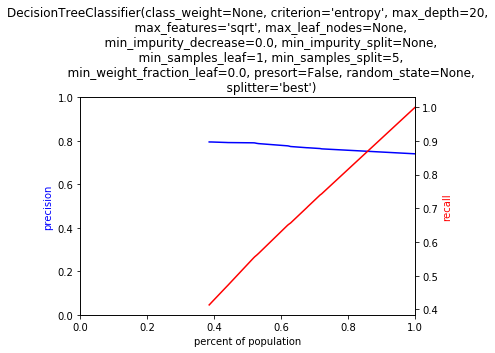

0.33870410919189453


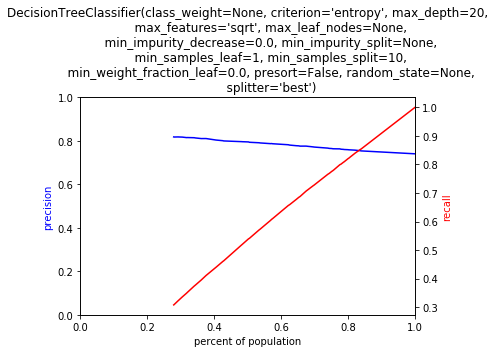

0.4117929935455322


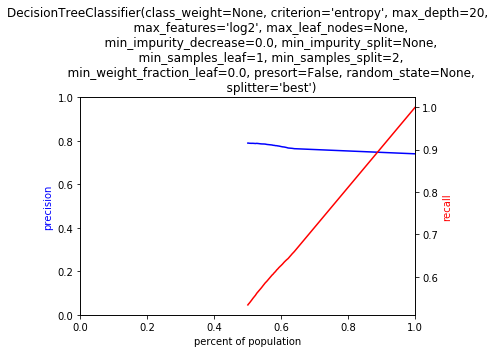

0.3329341411590576


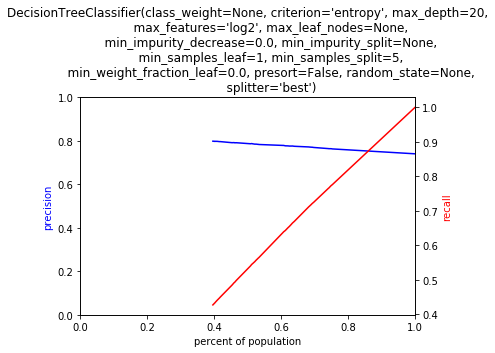

0.33934521675109863


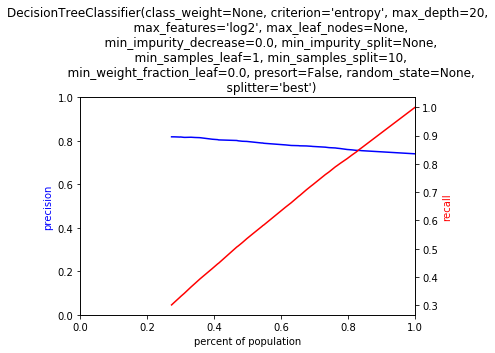

0.3279547691345215


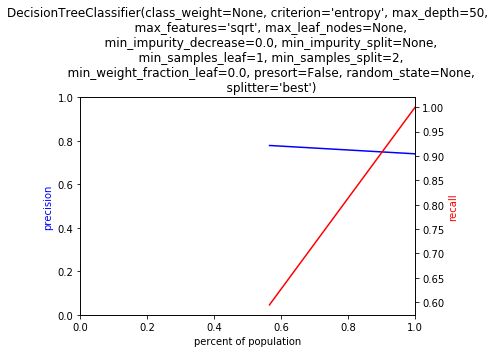

0.33727002143859863


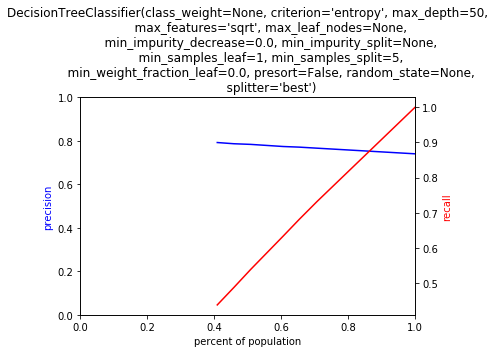

0.4039640426635742


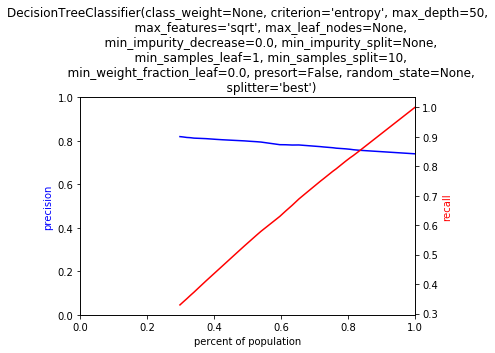

0.39380407333374023


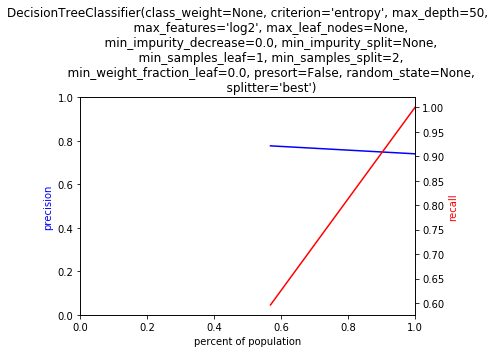

0.33635902404785156


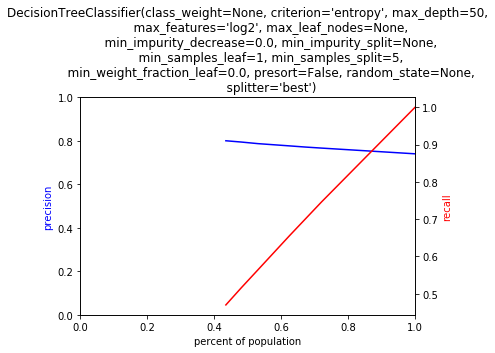

0.35039615631103516


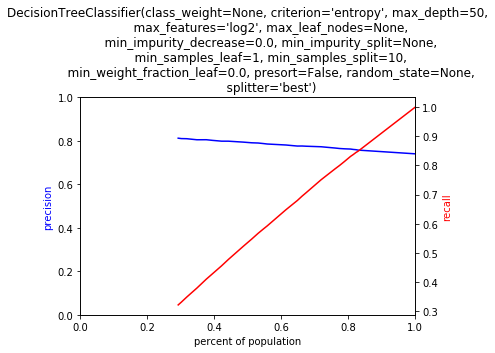

LR
{'penalty': ['l1', 'l2'], 'C': [0.001, 0.1, 1]}
0.29044103622436523


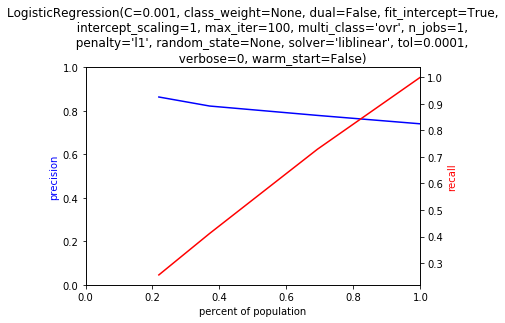

0.3770020008087158


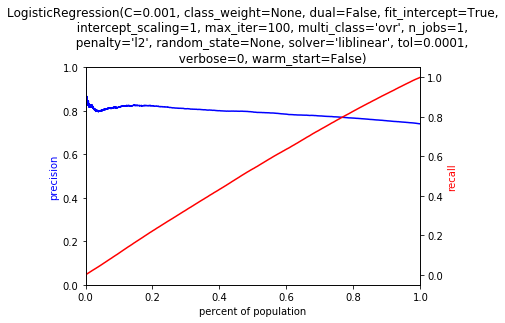

0.8134658336639404


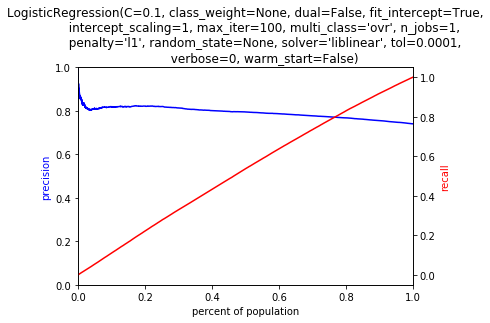

0.776630163192749


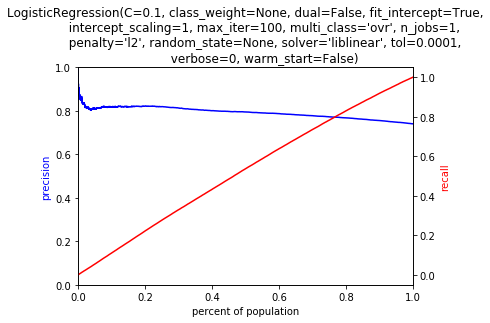

0.8374030590057373


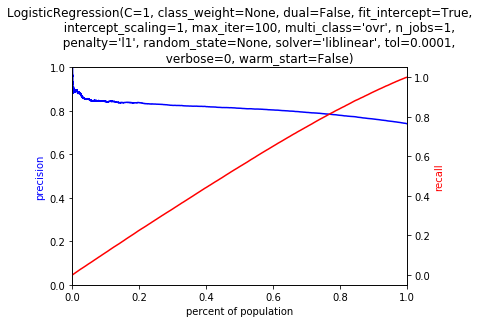

0.9396939277648926


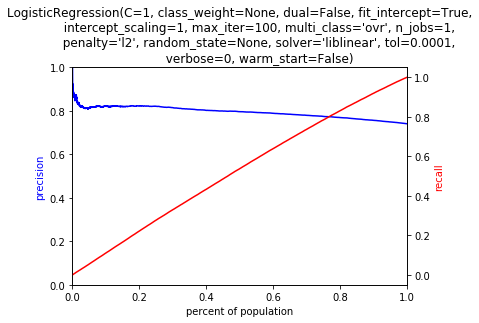

NB
{}
0.47921109199523926


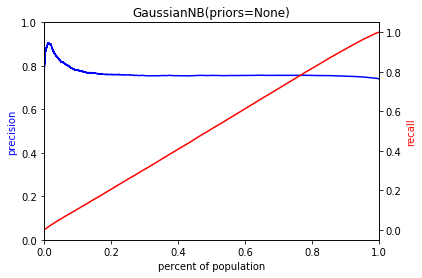

BAG
{'n_estimators': [10], 'max_samples': [5], 'max_features': [5, 10], 'bootstrap_features': [False, True]}
0.34139513969421387


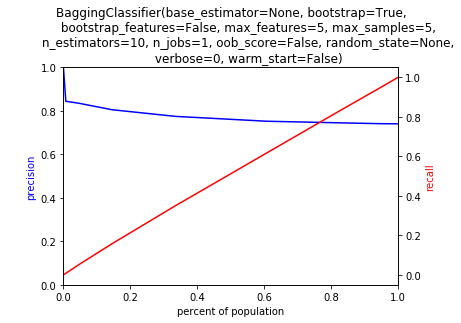

0.37320494651794434


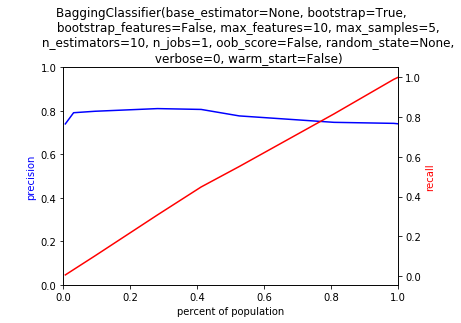

0.35240602493286133


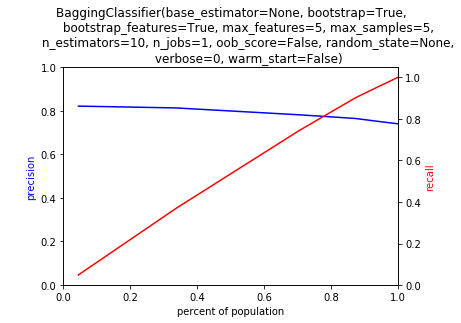

0.3420228958129883


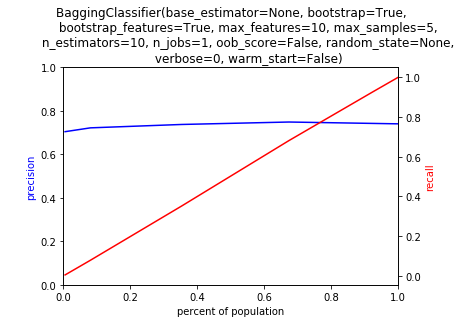

AB
{'algorithm': ['SAMME', 'SAMME.R'], 'n_estimators': [10, 100, 1000]}
0.6308369636535645


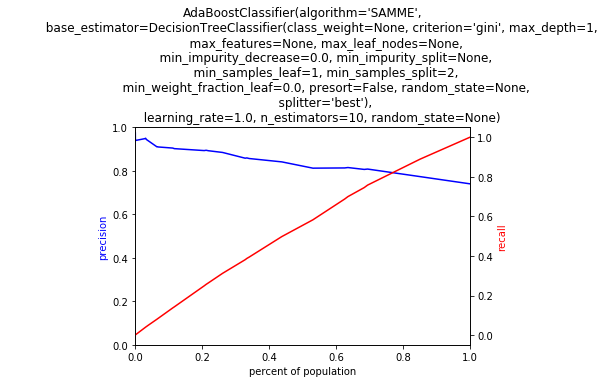

3.9587490558624268


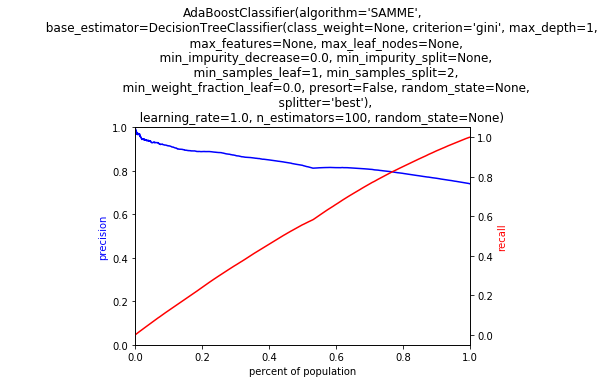

41.602006673812866


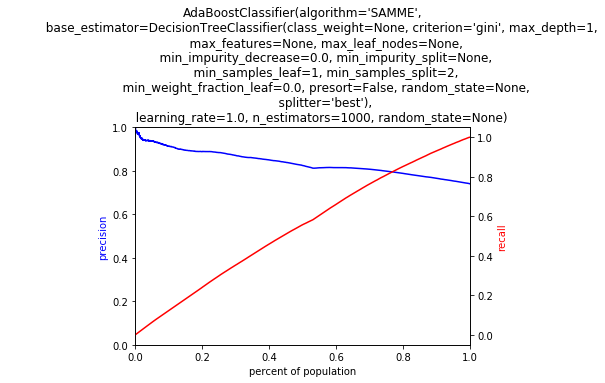

0.6967849731445312


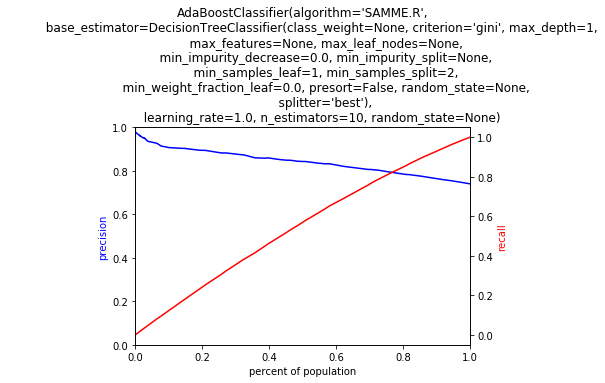

4.686049938201904


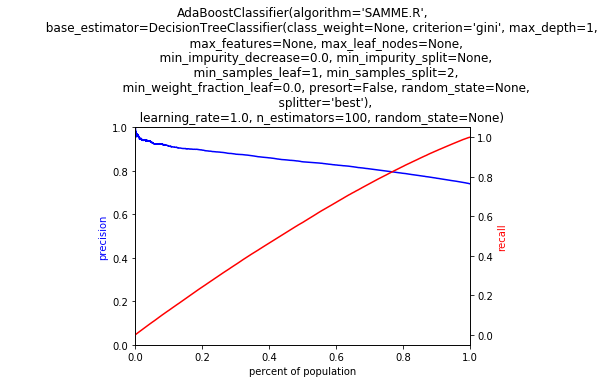

50.62710118293762


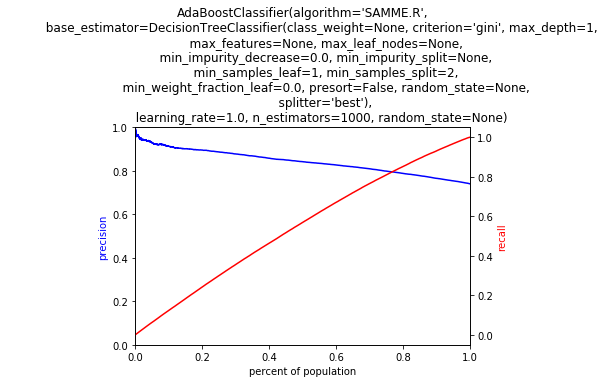

CUTOFF: 2011-12-31 VALIDATION: 2012-06-30
Booleans converted: fully_funded
Dummified: school_state
Dummified: school_zip
Dummified: school_metro
Booleans converted: school_charter
Booleans converted: school_magnet
Booleans converted: school_year_round
Booleans converted: school_nlns
Booleans converted: school_kipp
Booleans converted: school_charter_ready_promise
Dummified: teacher_prefix
Booleans converted: teacher_teach_for_america
Booleans converted: teacher_ny_teaching_fellow
Dummified: primary_focus_subject
Dummified: primary_focus_area
Dummified: secondary_focus_subject
Dummified: secondary_focus_area
Dummified: resource_type
Dummified: grade_level
Dummified: fulfillment_labor_materials
Normalizing: total_price_excluding_optional_support
Normalizing: total_price_including_optional_support
Missing values imputed: students_reached
Normalizing: students_reached
Booleans converted: eligible_double_your_impact_match
Booleans converted: eligible_almost_home_match
Getting month of date_p

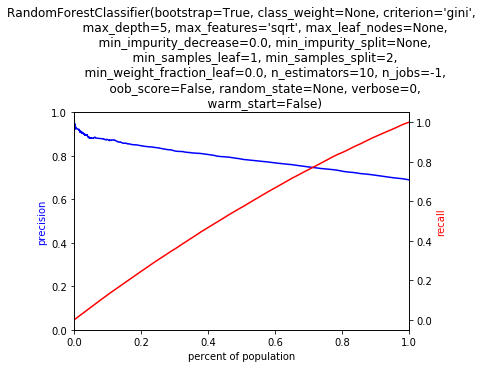

4.265752077102661


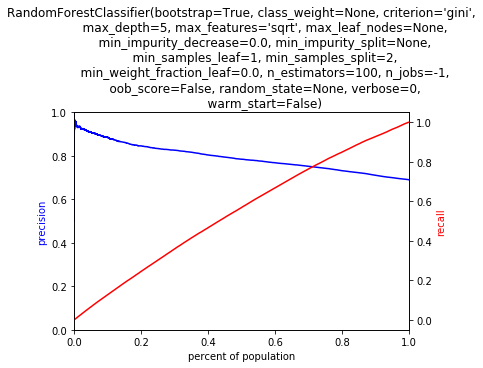

0.7958981990814209


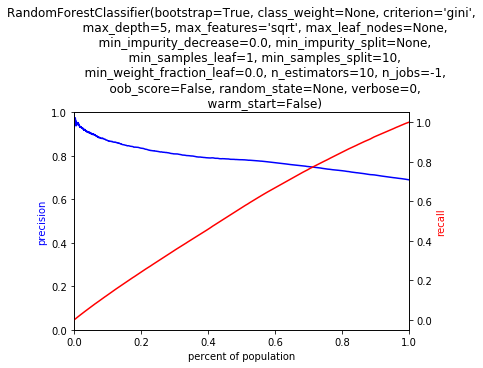

4.195917129516602


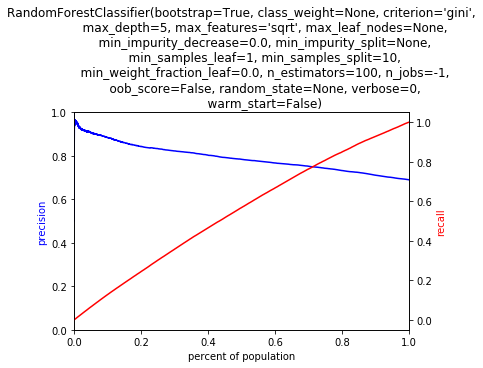

0.8194518089294434


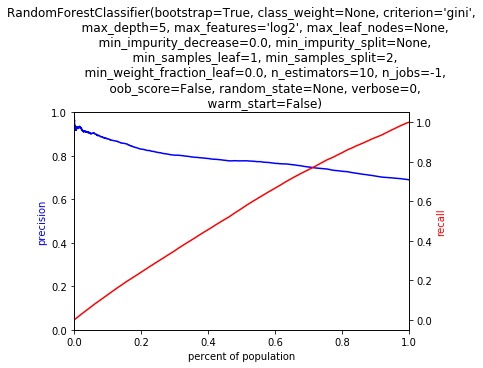

4.164889097213745


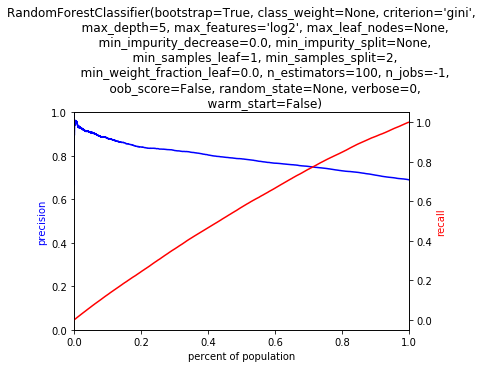

0.7979331016540527


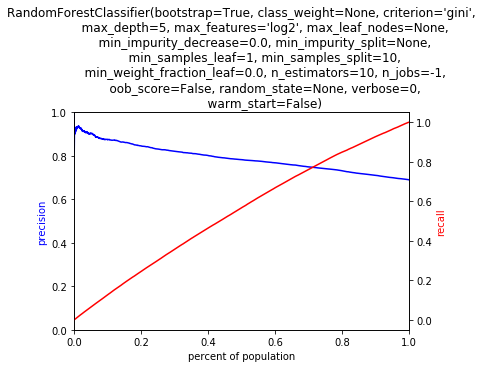

4.138841152191162


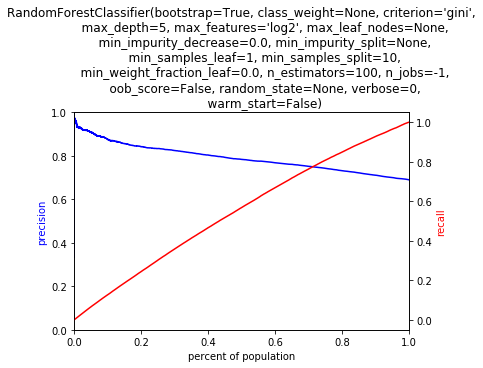

1.3938112258911133


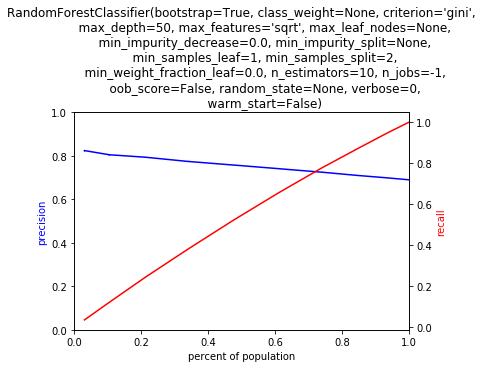

11.416048288345337


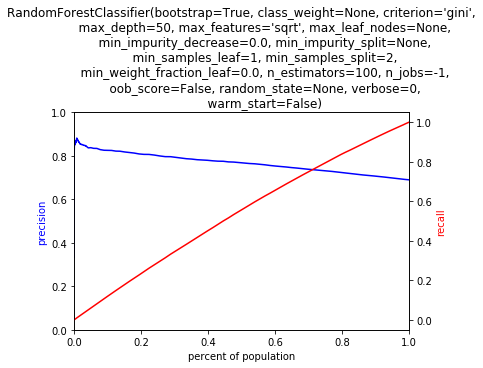

1.7158260345458984


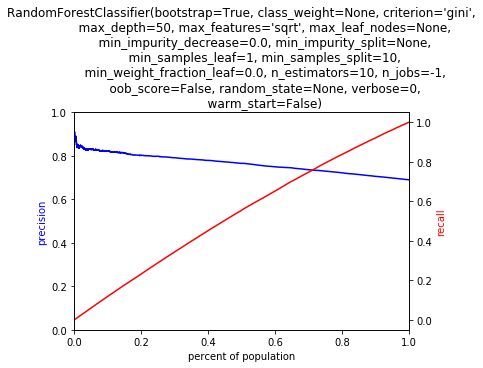

10.991726160049438


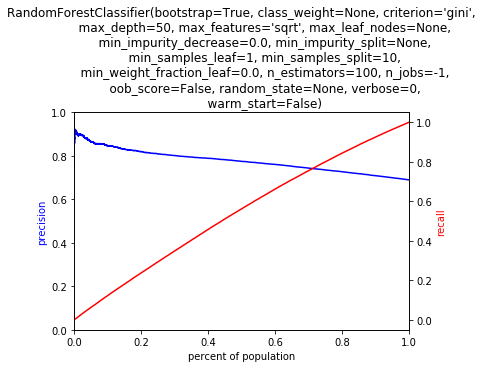

1.820807933807373


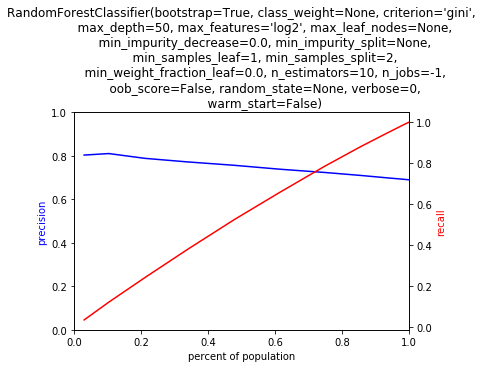

12.74547815322876


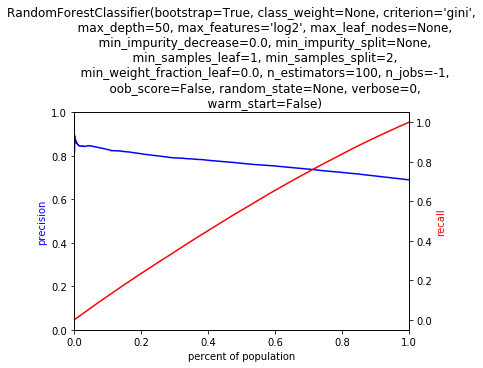

1.3582191467285156


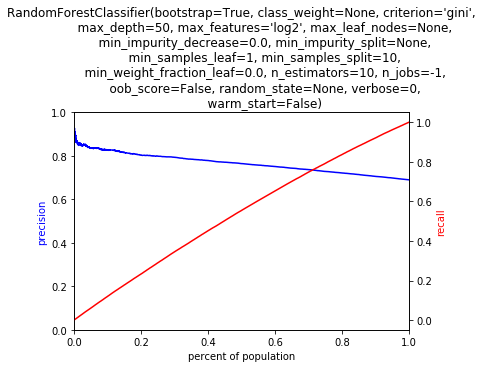

11.328405141830444


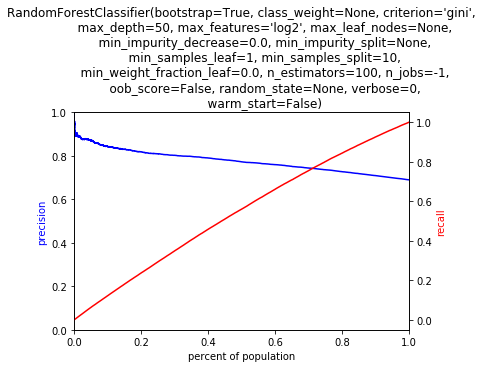

DT
{'criterion': ['gini', 'entropy'], 'max_depth': [10, 20, 50], 'max_features': ['sqrt', 'log2'], 'min_samples_split': [2, 5, 10]}
0.41715192794799805


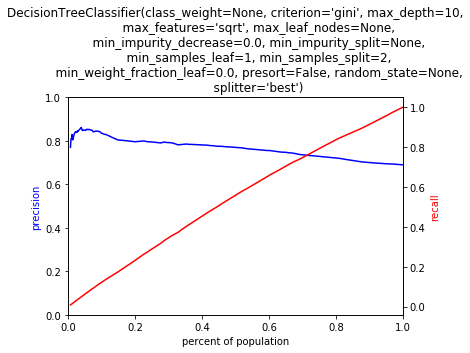

0.38115715980529785


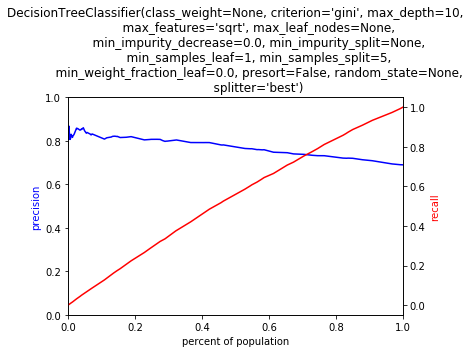

0.4679570198059082


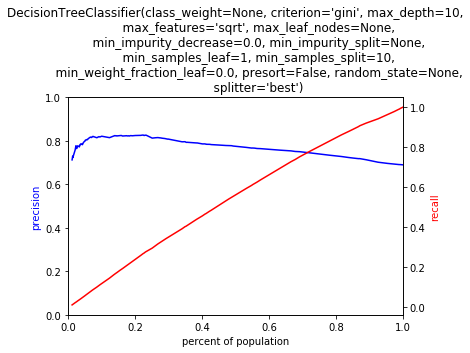

0.4419901371002197


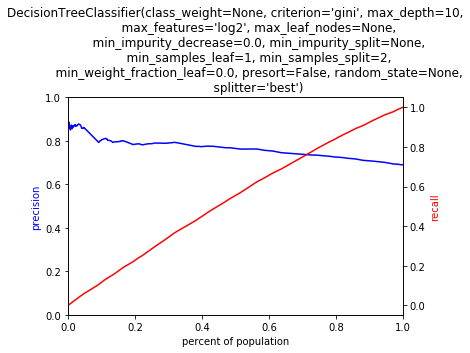

0.42402195930480957


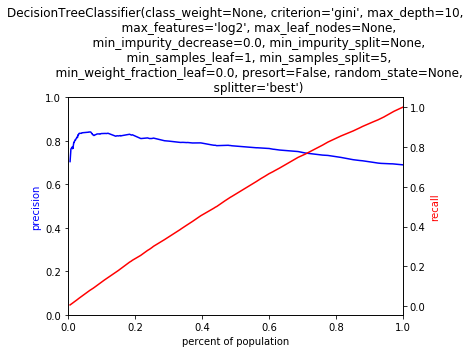

0.46714019775390625


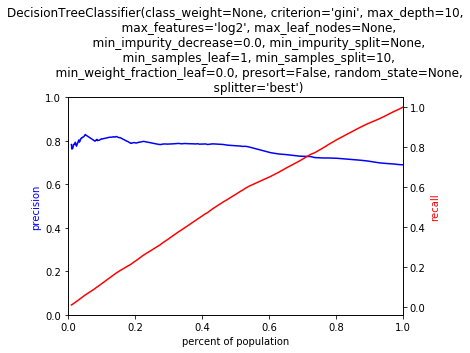

0.48673510551452637


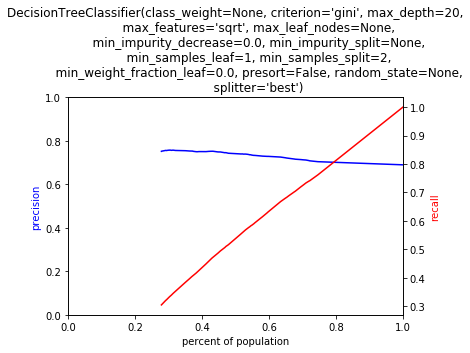

0.4405629634857178


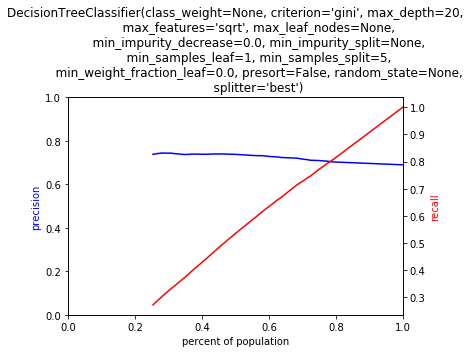

0.4551560878753662


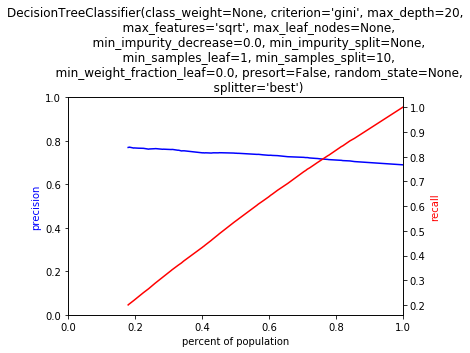

0.4999229907989502


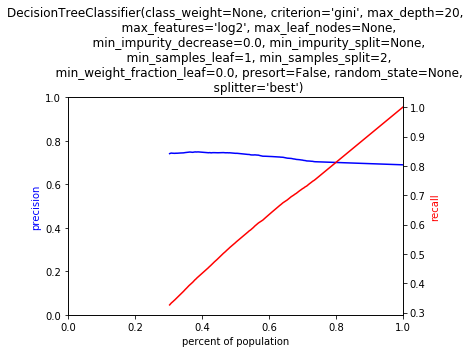

0.46152210235595703


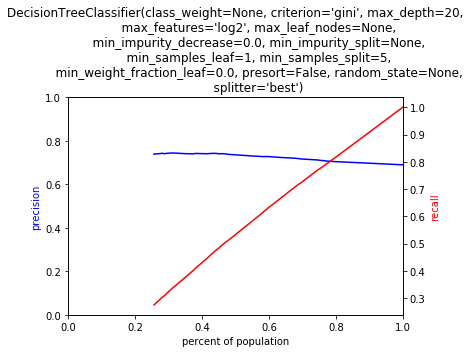

0.4631381034851074


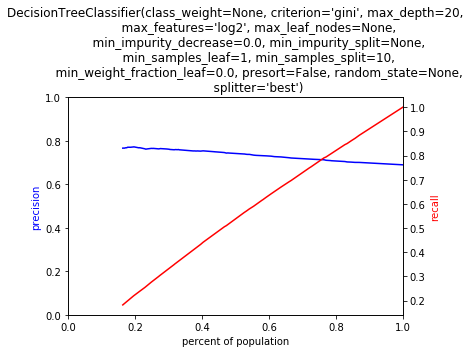

0.47955989837646484


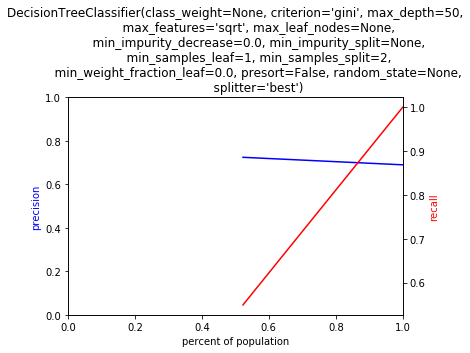

0.47487497329711914


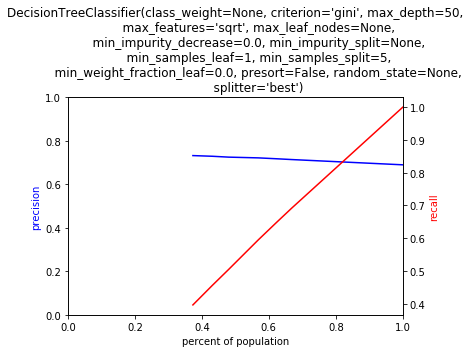

0.46539902687072754


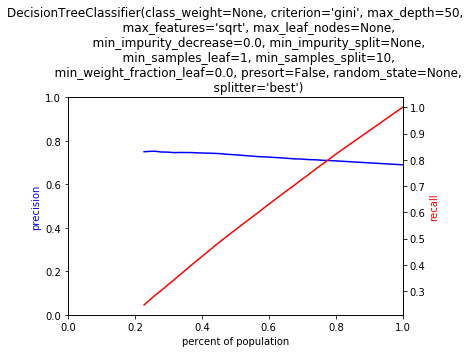

0.4800851345062256


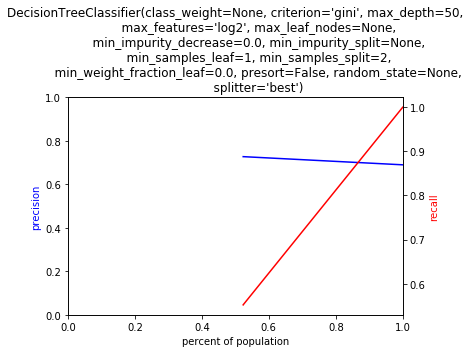

0.4960780143737793


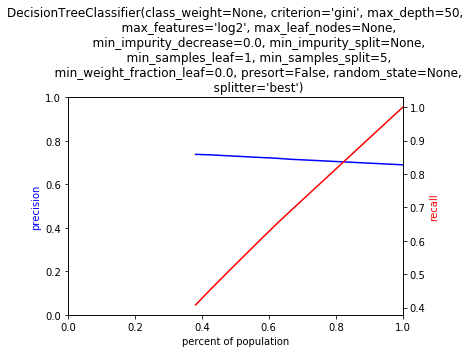

0.5485529899597168


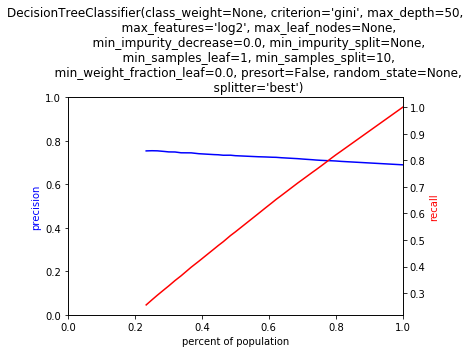

0.3739199638366699


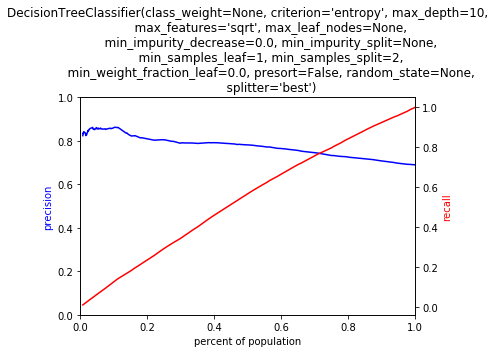

0.4439208507537842


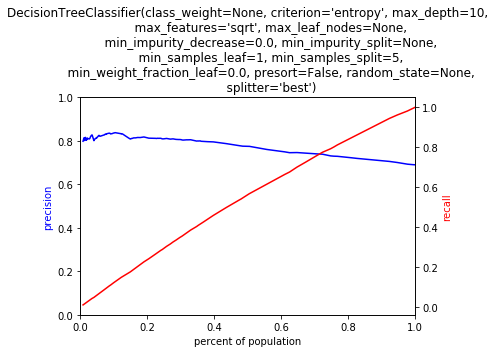

0.3952159881591797


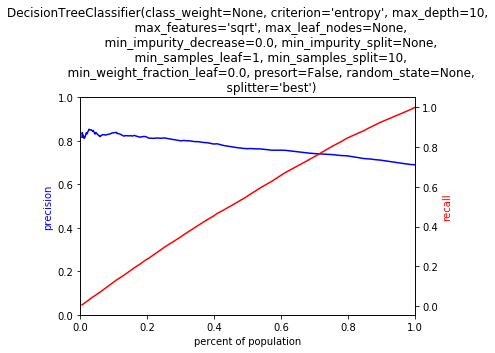

0.39254283905029297


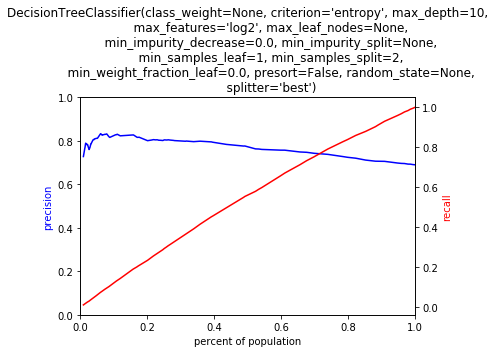

0.4196779727935791


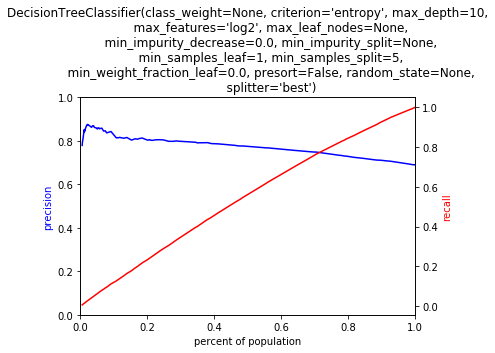

0.41908788681030273


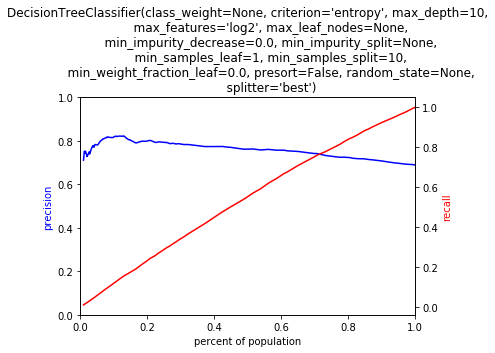

0.5449550151824951


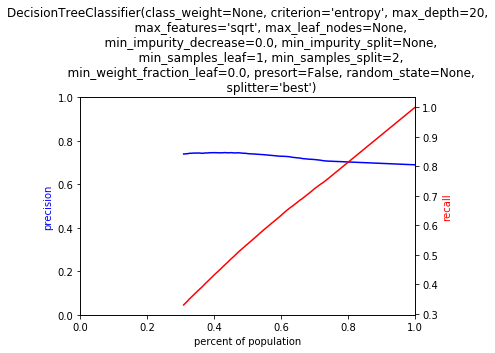

0.5655100345611572


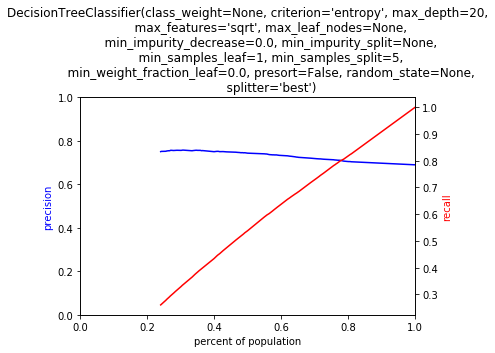

0.5316312313079834


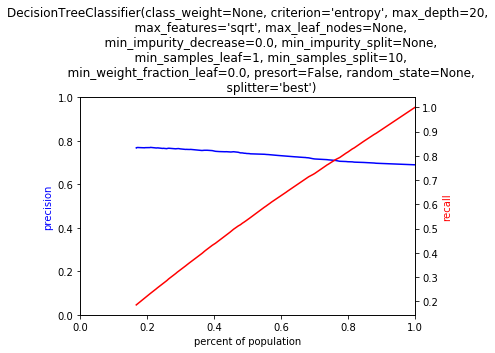

0.5892689228057861


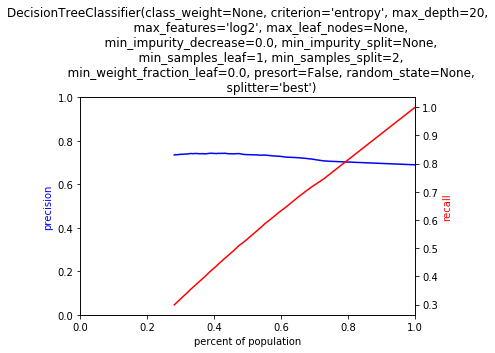

0.5555520057678223


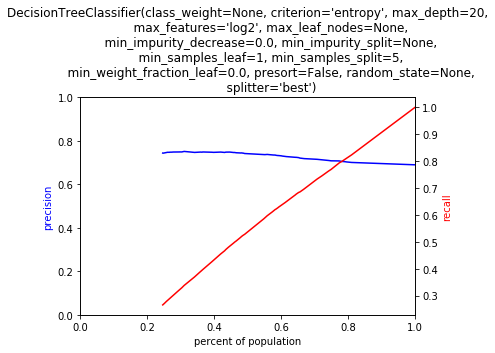

0.5443158149719238


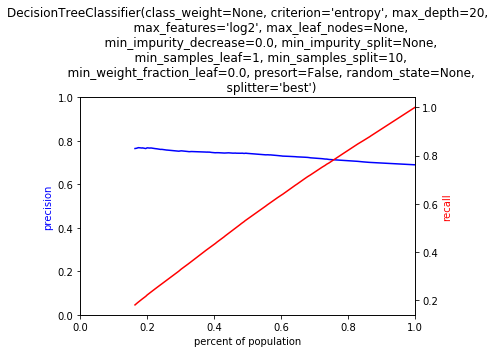

0.5460870265960693


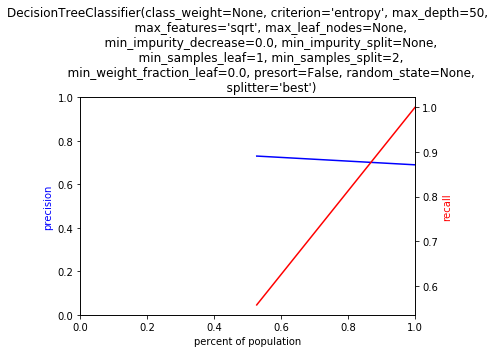

0.5494520664215088


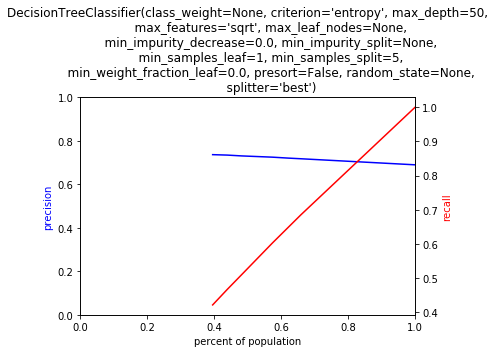

0.981208086013794


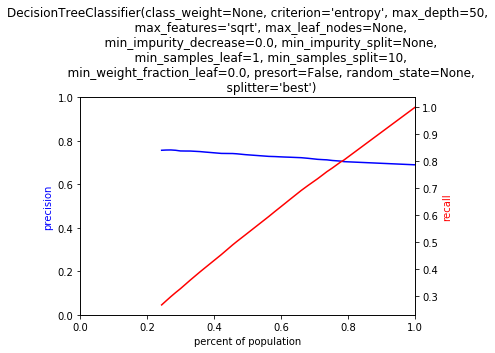

0.5356700420379639


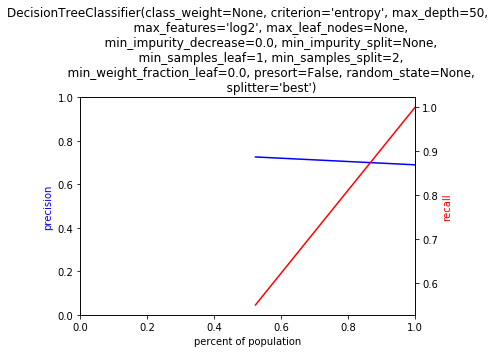

0.5143899917602539


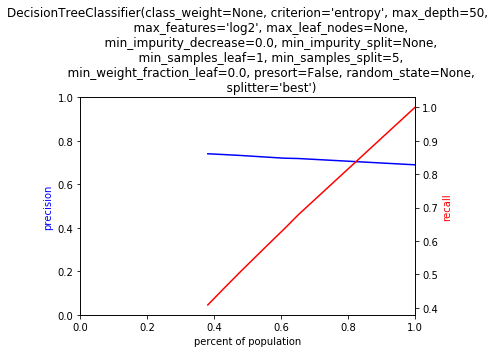

0.5291368961334229


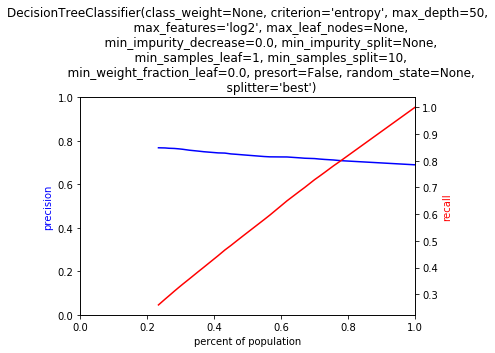

LR
{'penalty': ['l1', 'l2'], 'C': [0.001, 0.1, 1]}
0.4869112968444824


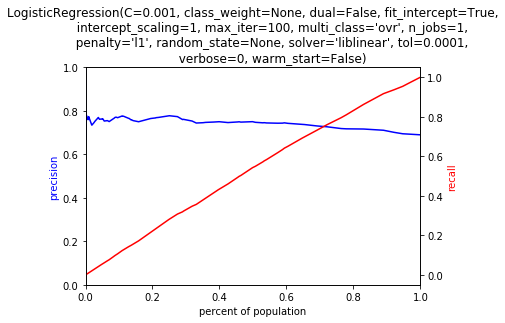

0.5933980941772461


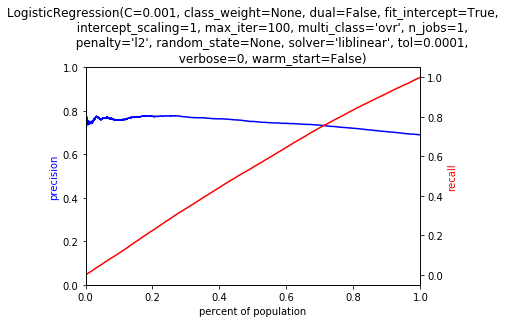

0.9143788814544678


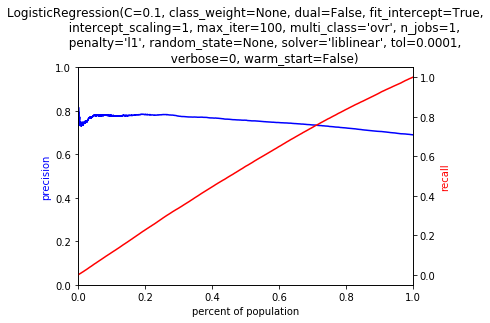

1.002351999282837


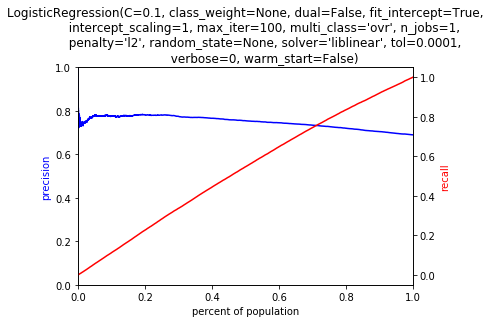

5.834836959838867


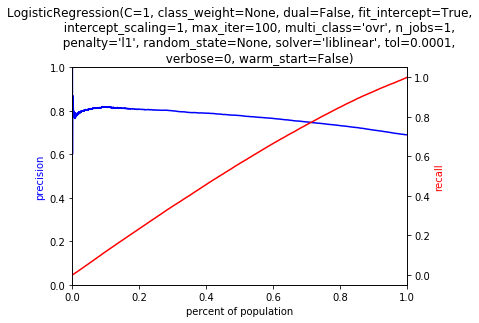

1.8591430187225342


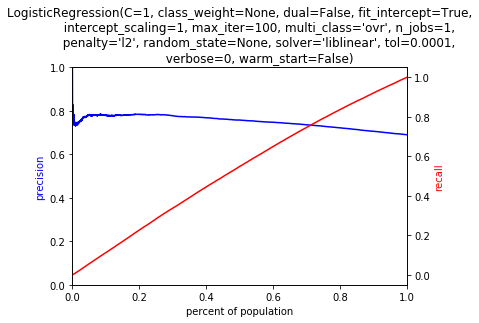

NB
{}
0.39178013801574707


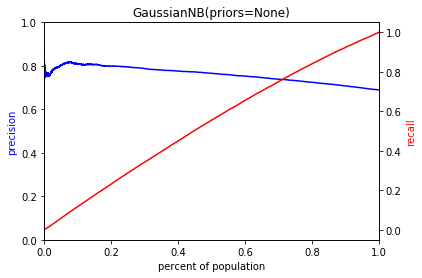

BAG
{'n_estimators': [10], 'max_samples': [5], 'max_features': [5, 10], 'bootstrap_features': [False, True]}
0.3862171173095703


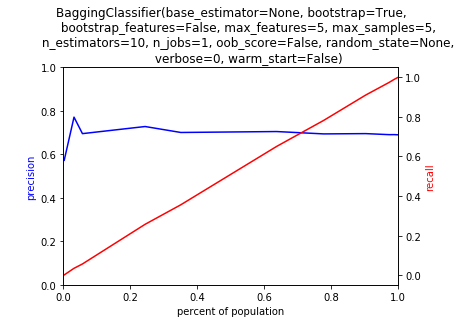

0.417935848236084


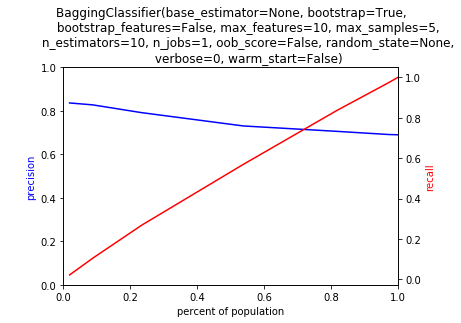

0.37419700622558594


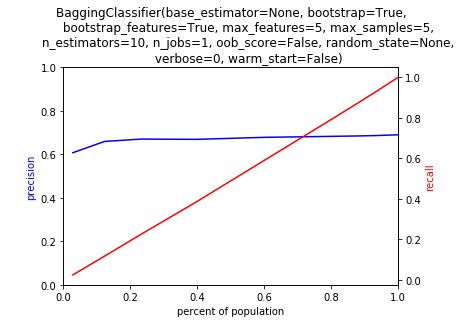

0.4199178218841553


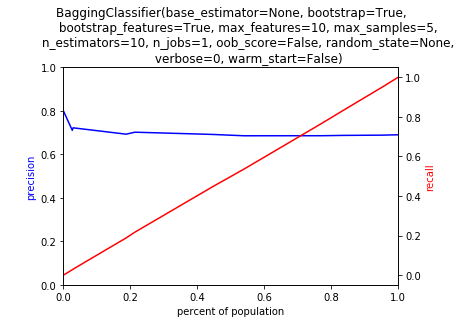

AB
{'algorithm': ['SAMME', 'SAMME.R'], 'n_estimators': [10, 100, 1000]}
1.0527138710021973


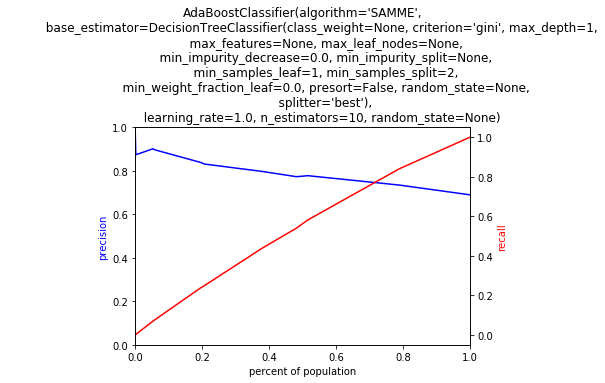

8.854949951171875


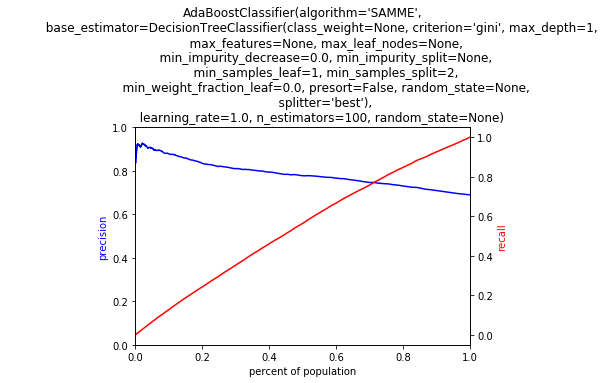

86.93415713310242


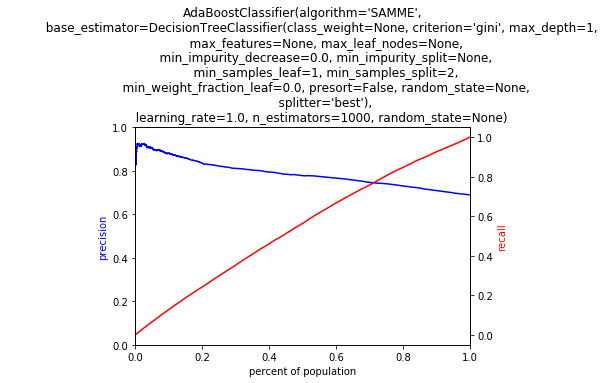

1.487304925918579


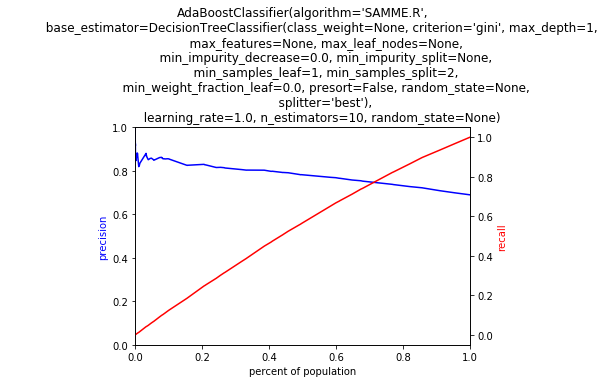

11.585170984268188


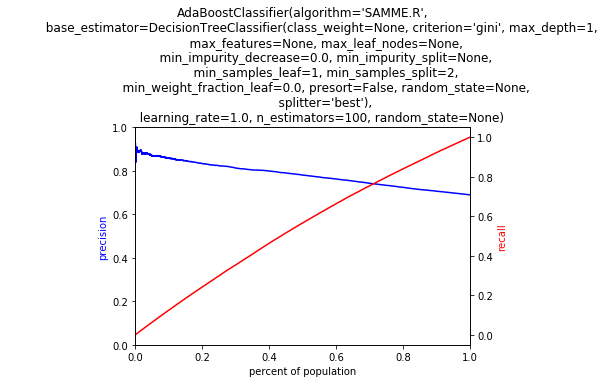

102.55856609344482


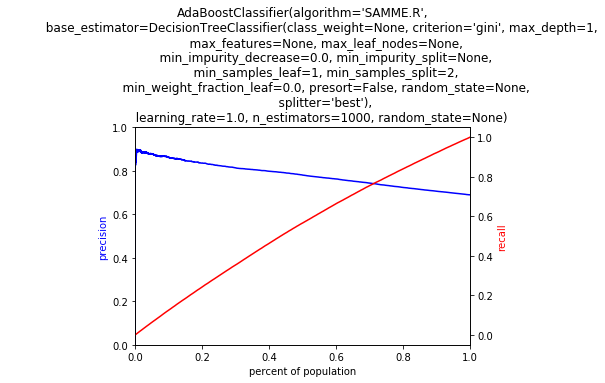

CUTOFF: 2012-06-30 VALIDATION: 2012-12-31
Booleans converted: fully_funded
Dummified: school_state
Dummified: school_zip
Dummified: school_metro
Booleans converted: school_charter
Booleans converted: school_magnet
Booleans converted: school_year_round
Booleans converted: school_nlns
Booleans converted: school_kipp
Booleans converted: school_charter_ready_promise
Dummified: teacher_prefix
Booleans converted: teacher_teach_for_america
Booleans converted: teacher_ny_teaching_fellow
Dummified: primary_focus_subject
Dummified: primary_focus_area
Dummified: secondary_focus_subject
Dummified: secondary_focus_area
Dummified: resource_type
Dummified: grade_level
Dummified: fulfillment_labor_materials
Normalizing: total_price_excluding_optional_support
Normalizing: total_price_including_optional_support
Missing values imputed: students_reached
Normalizing: students_reached
Booleans converted: eligible_double_your_impact_match
Booleans converted: eligible_almost_home_match
Getting month of date_p

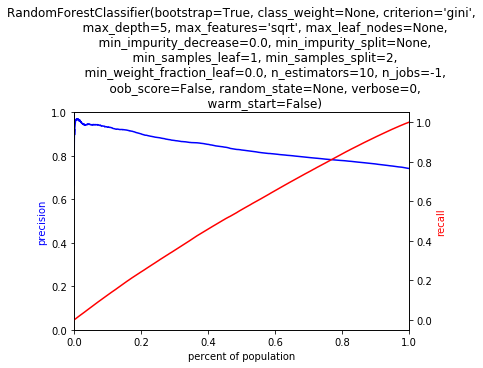

7.3598620891571045


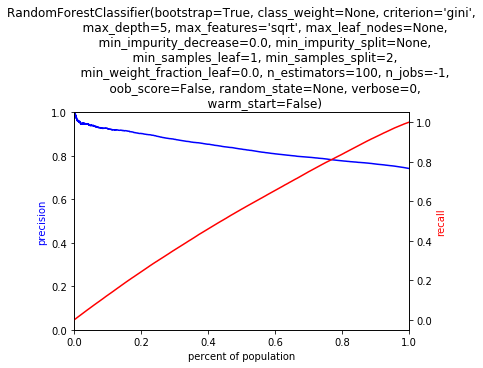

1.2318148612976074


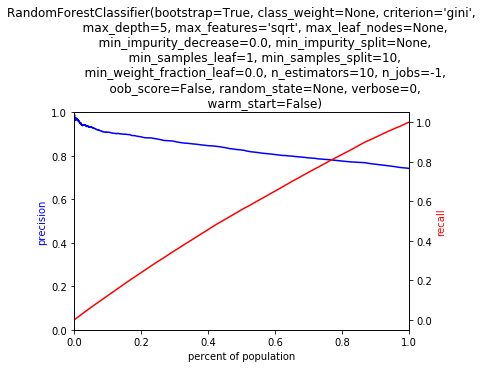

6.992485046386719


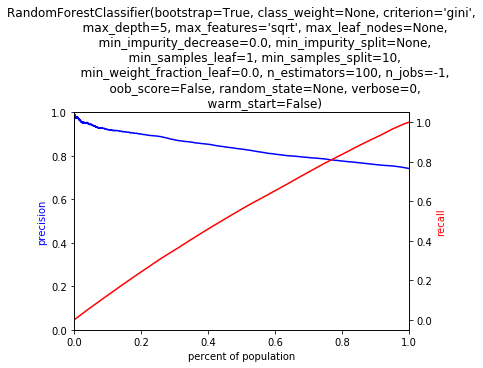

1.076512098312378


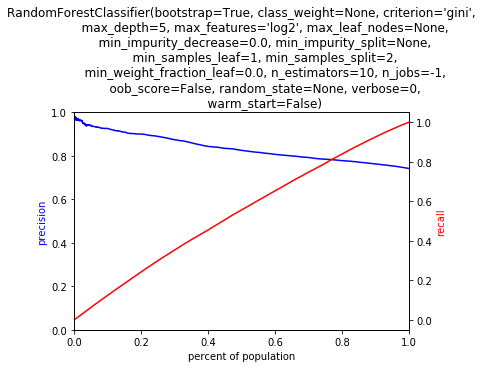

7.57384991645813


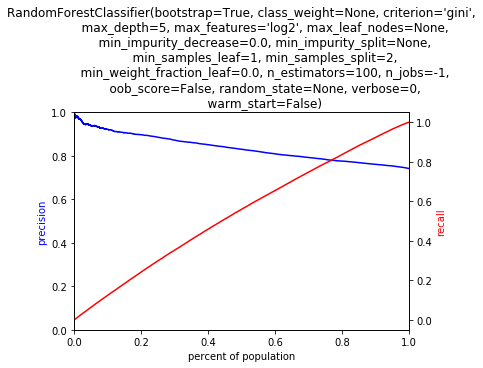

1.1474239826202393


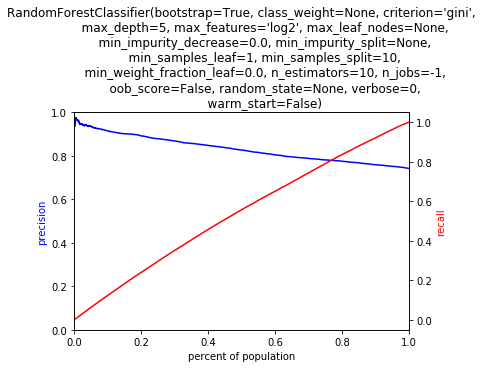

6.815248250961304


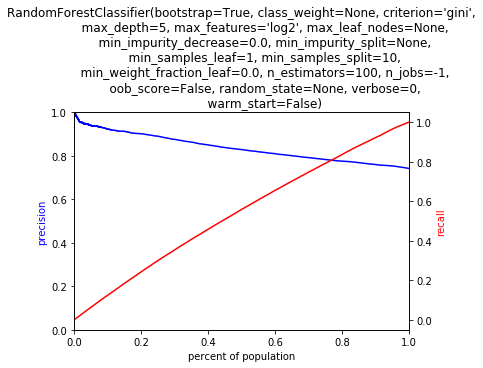

2.4197559356689453


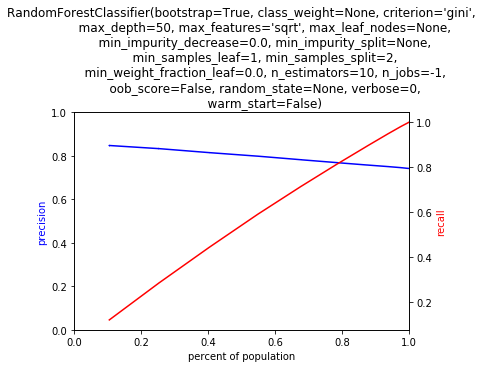

19.82813334465027


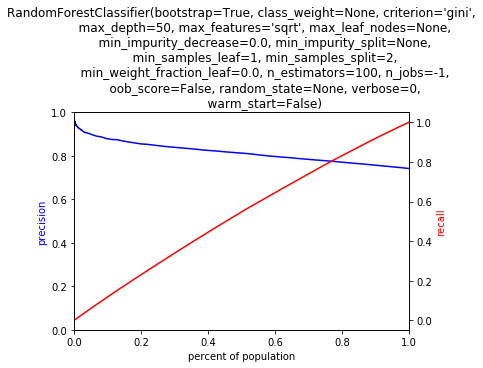

2.5780670642852783


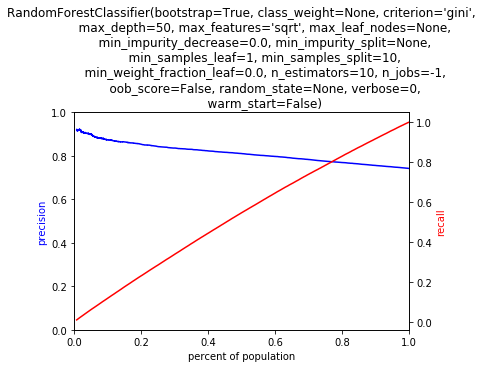

16.366961002349854


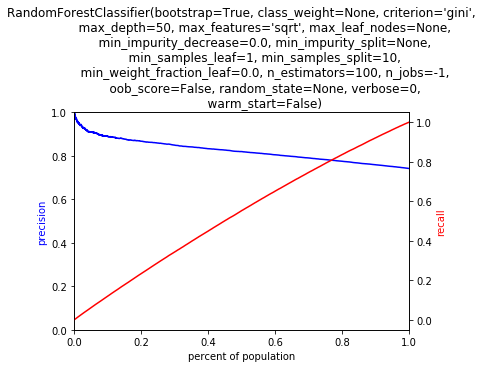

3.259816884994507


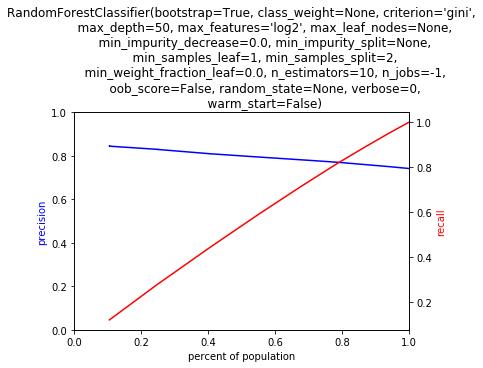

21.495537042617798


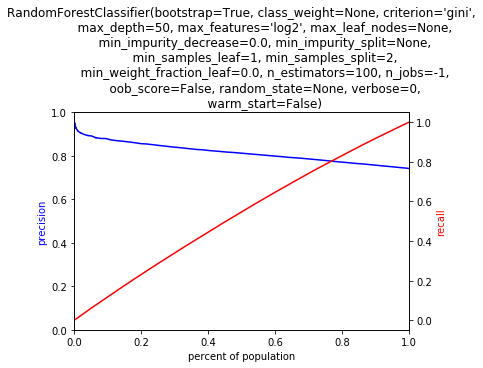

2.4173831939697266


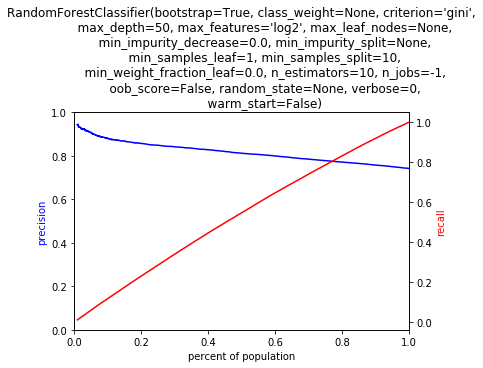

18.061687231063843


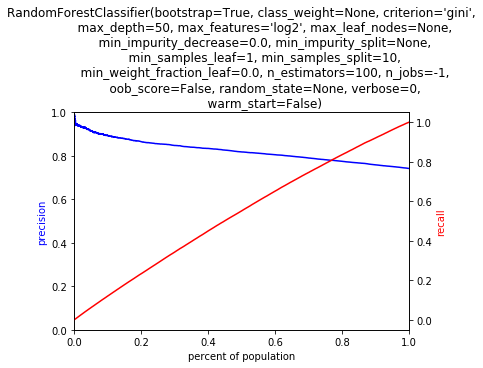

DT
{'criterion': ['gini', 'entropy'], 'max_depth': [10, 20, 50], 'max_features': ['sqrt', 'log2'], 'min_samples_split': [2, 5, 10]}
0.5538561344146729


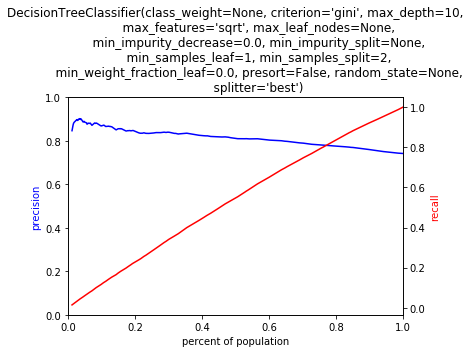

0.6108002662658691


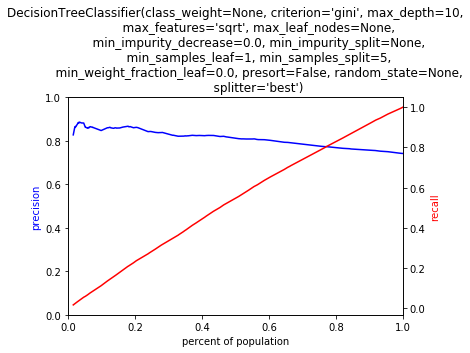

0.5012693405151367


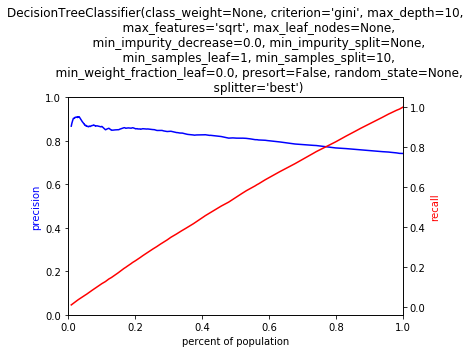

0.5014419555664062


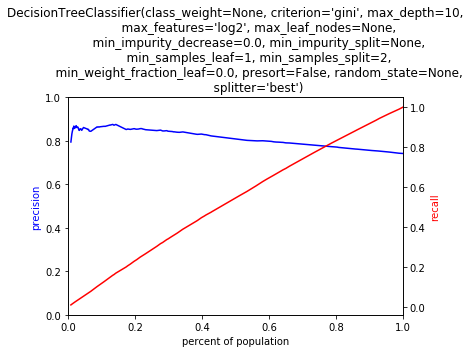

0.5286509990692139


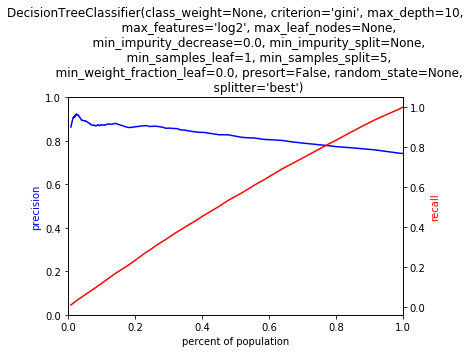

0.5775852203369141


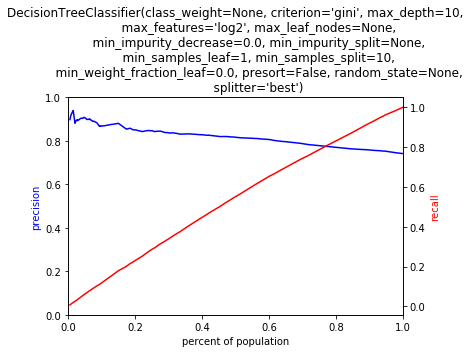

0.7657420635223389


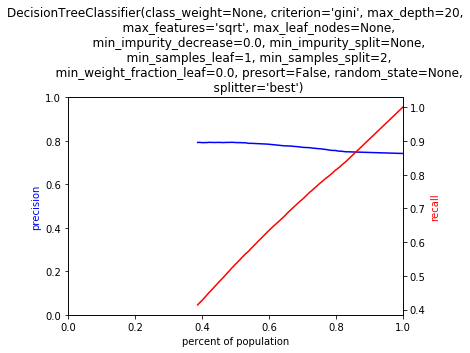

0.6493299007415771


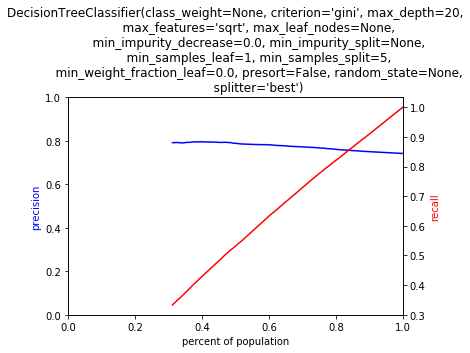

0.6747641563415527


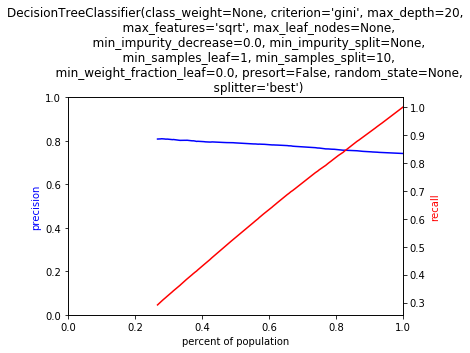

0.7688088417053223


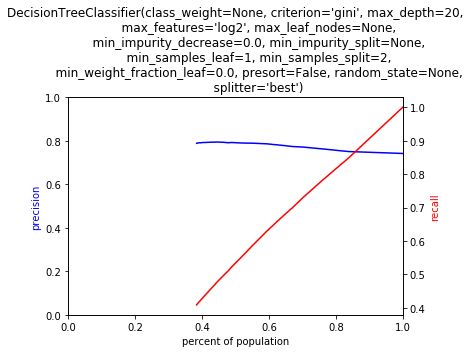

0.6499459743499756


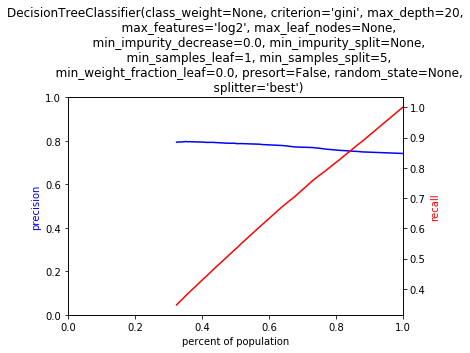

0.6766579151153564


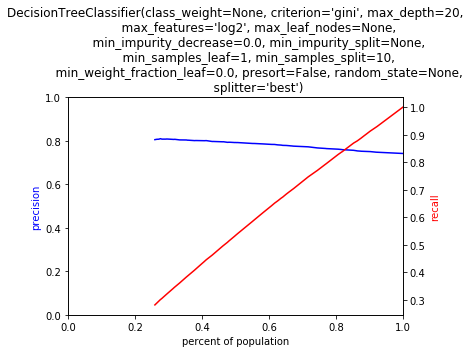

0.7538952827453613


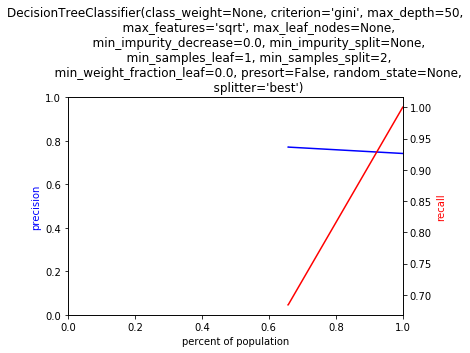

0.751103401184082


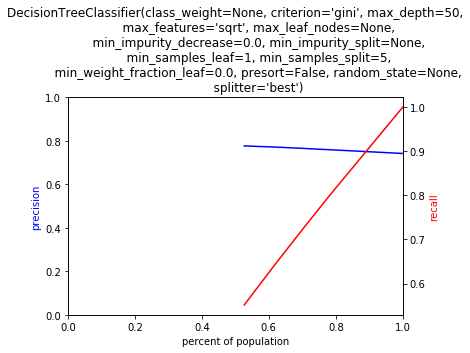

0.6961472034454346


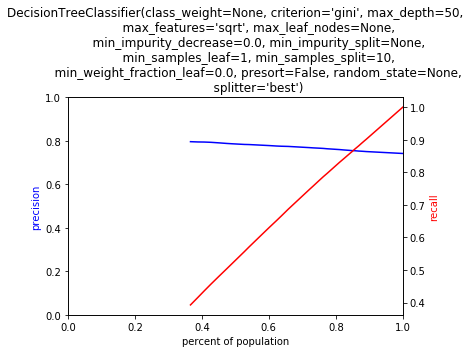

0.7105739116668701


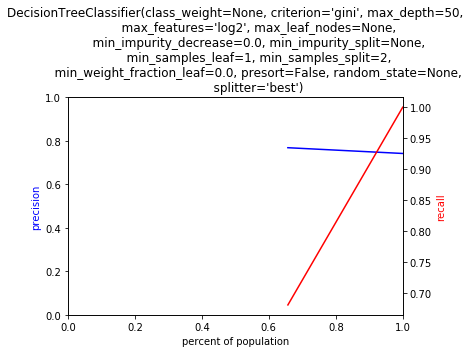

0.7277748584747314


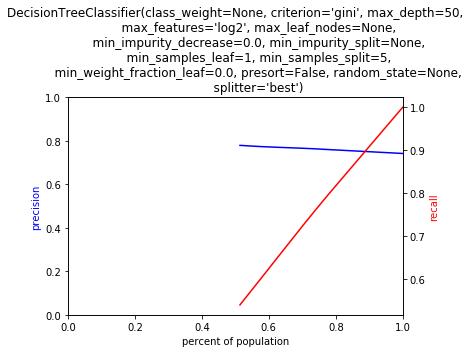

0.6927731037139893


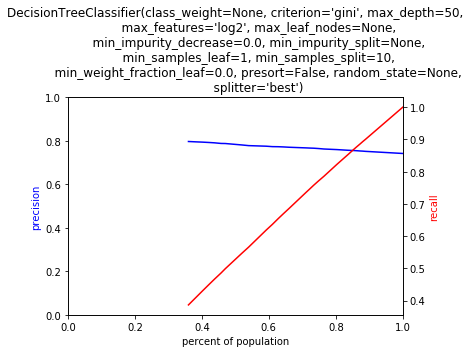

0.5740511417388916


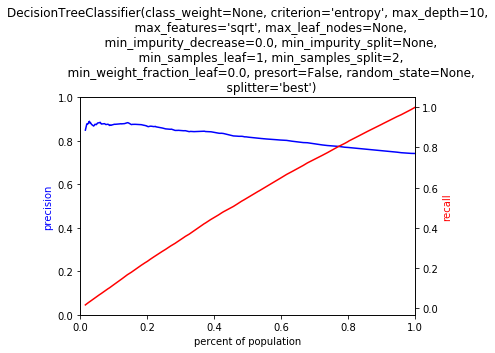

0.5078680515289307


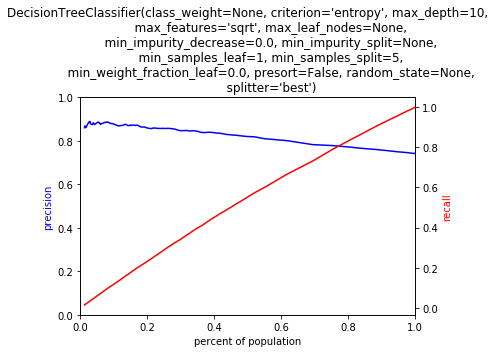

0.5396339893341064


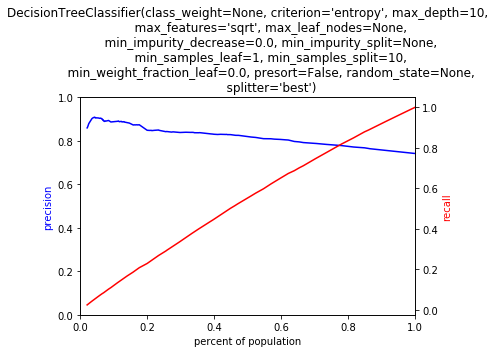

0.6815998554229736


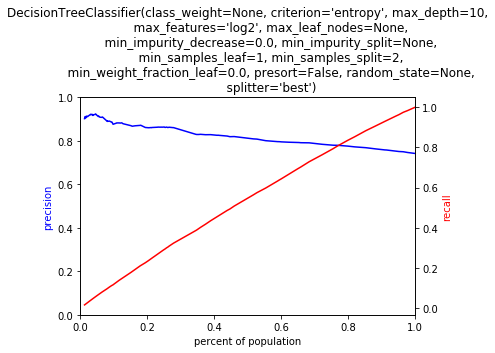

0.5806059837341309


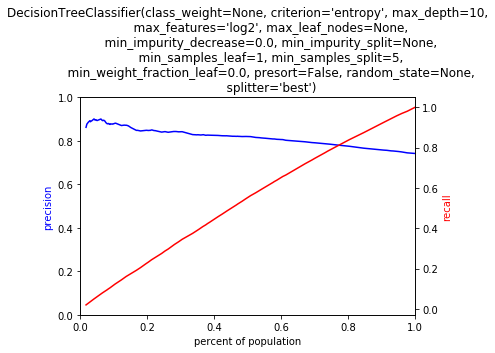

0.622556209564209


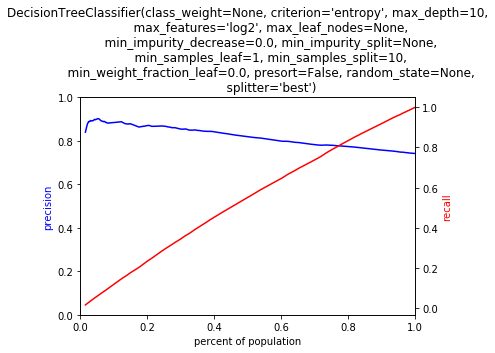

0.8057239055633545


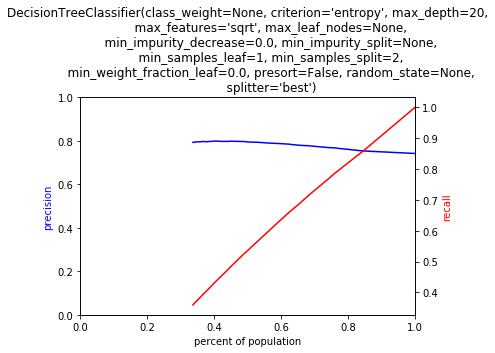

0.7399749755859375


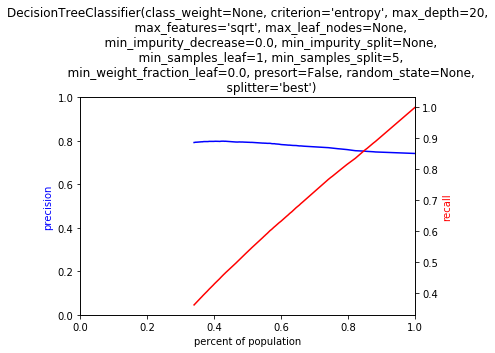

0.781378984451294


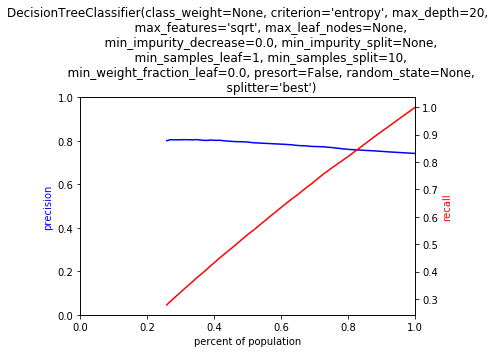

0.8250489234924316


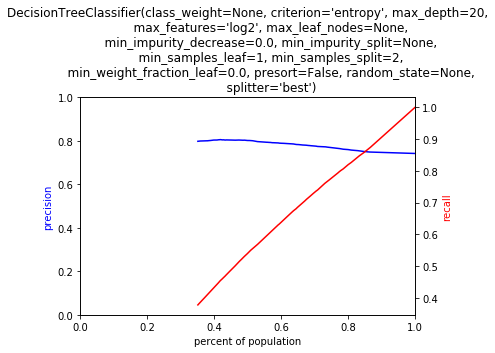

0.7410719394683838


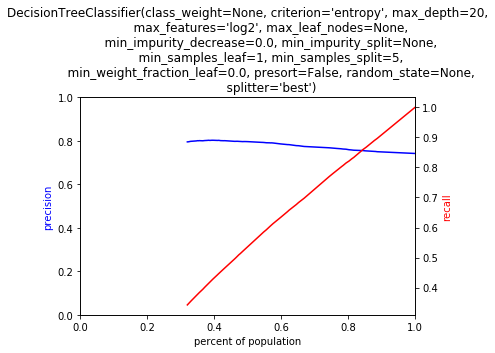

0.7712929248809814


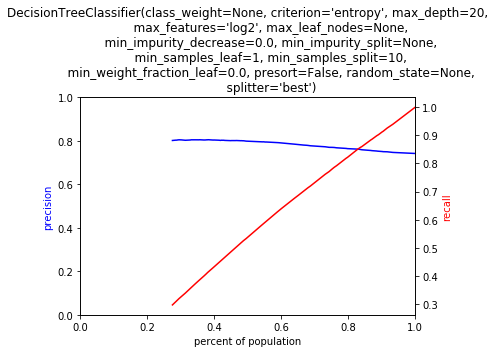

1.024116039276123


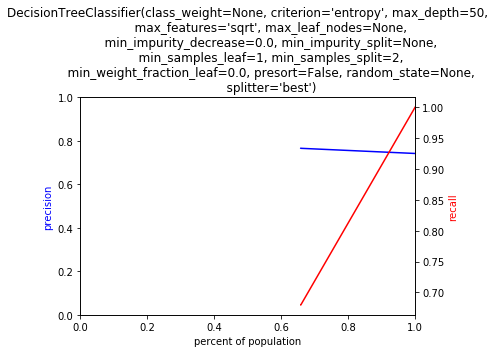

0.8101298809051514


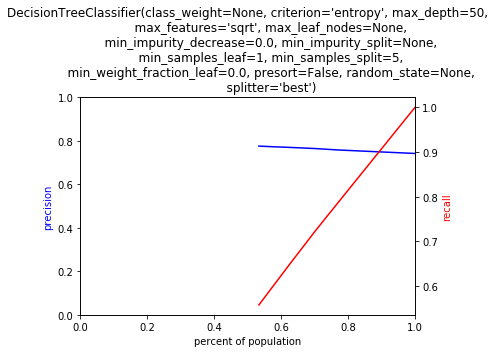

0.8832318782806396


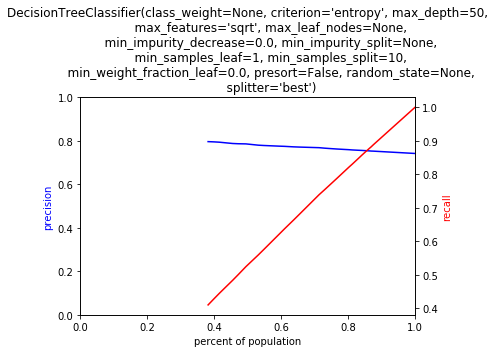

0.9069750308990479


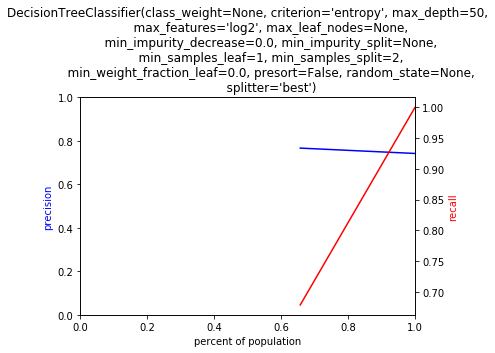

0.9063749313354492


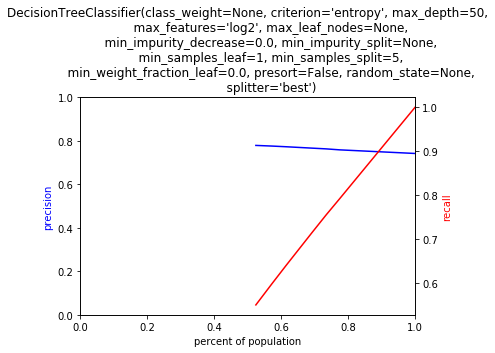

0.8048851490020752


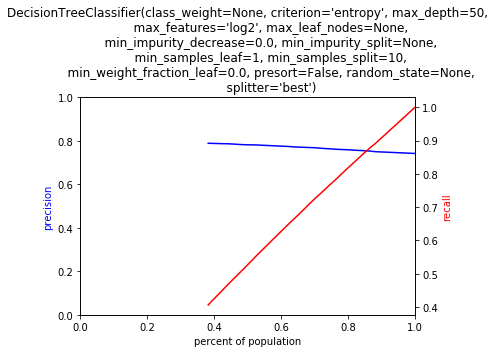

LR
{'penalty': ['l1', 'l2'], 'C': [0.001, 0.1, 1]}
0.8502416610717773


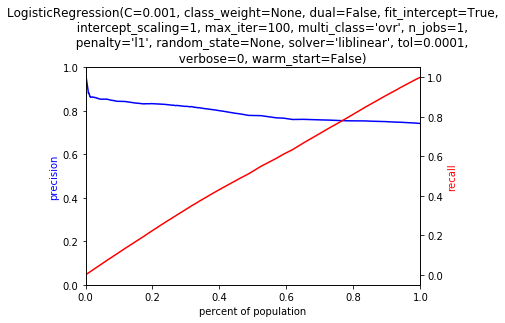

1.0134410858154297


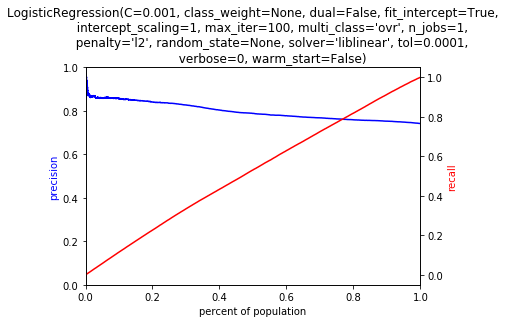

2.7868378162384033


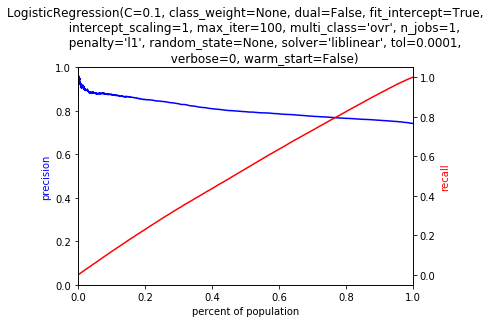

1.4429550170898438


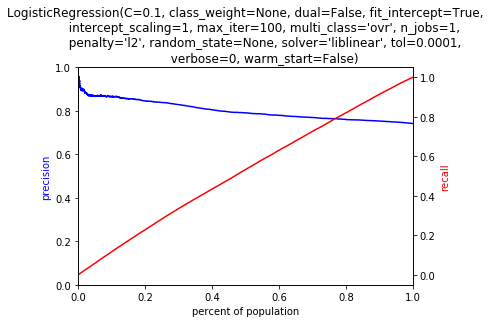

1.4838950634002686


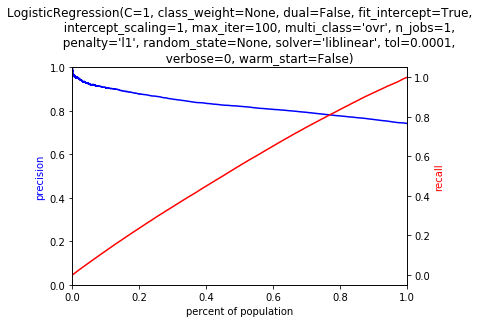

2.704843044281006


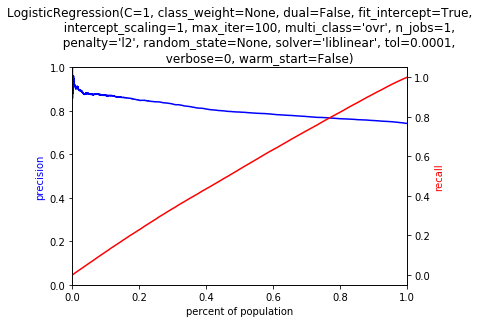

NB
{}
0.6096618175506592


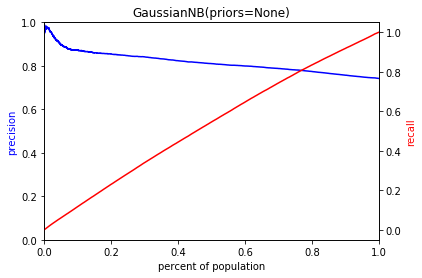

BAG
{'n_estimators': [10], 'max_samples': [5], 'max_features': [5, 10], 'bootstrap_features': [False, True]}
0.5333311557769775


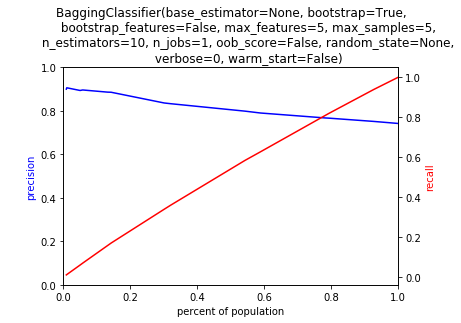

0.5930209159851074


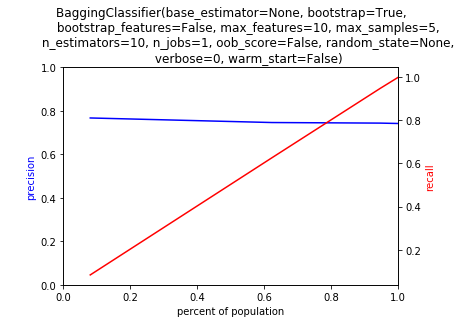

0.557405948638916


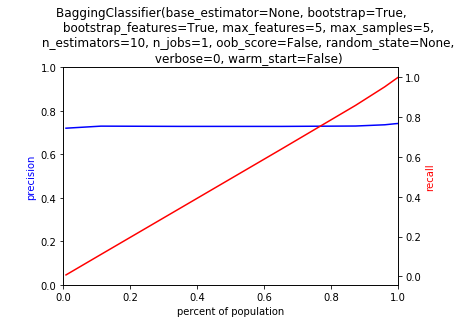

0.6433432102203369


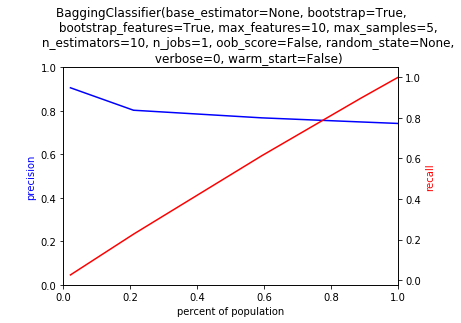

AB
{'algorithm': ['SAMME', 'SAMME.R'], 'n_estimators': [10, 100, 1000]}
1.7386531829833984


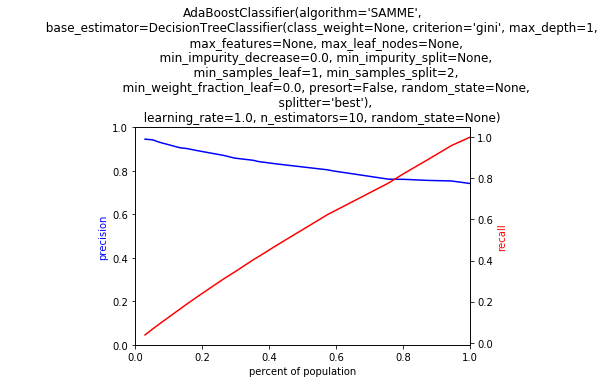

14.786106824874878


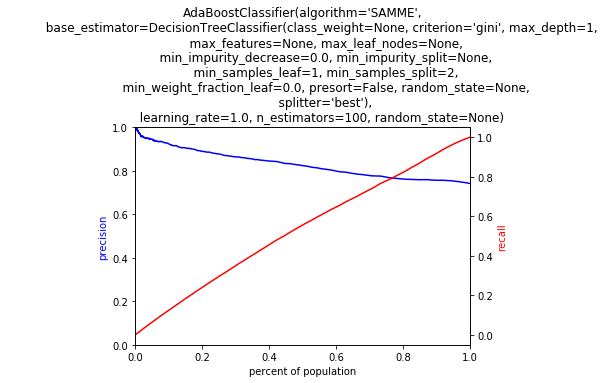

155.13340282440186


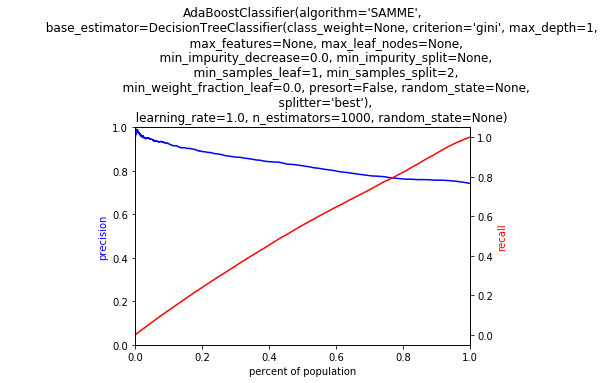

2.035496950149536


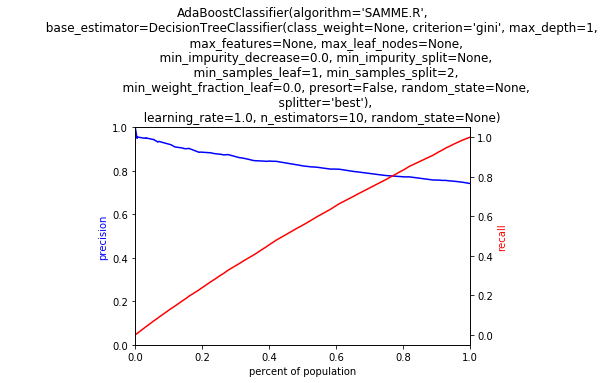

16.173723936080933


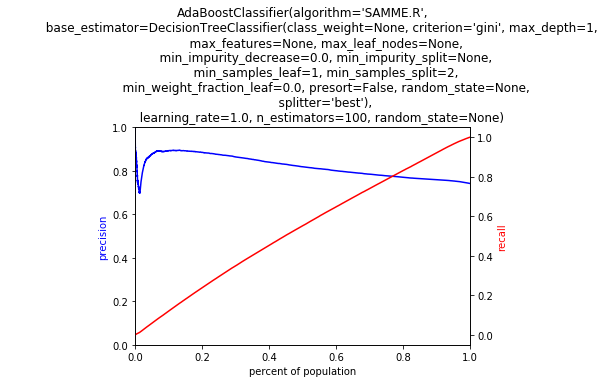

164.7976291179657


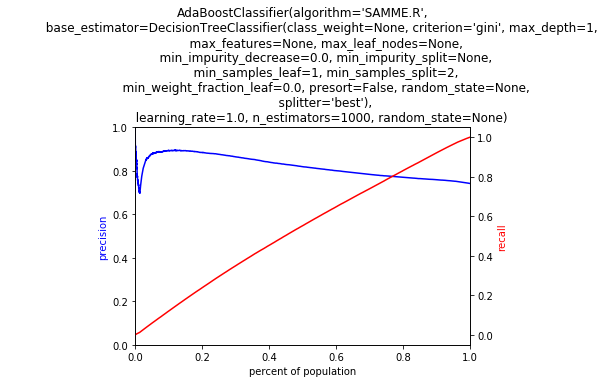

CUTOFF: 2012-12-31 VALIDATION: 2013-06-30
Booleans converted: fully_funded
Dummified: school_state
Dummified: school_zip
Dummified: school_metro
Booleans converted: school_charter
Booleans converted: school_magnet
Booleans converted: school_year_round
Booleans converted: school_nlns
Booleans converted: school_kipp
Booleans converted: school_charter_ready_promise
Dummified: teacher_prefix
Booleans converted: teacher_teach_for_america
Booleans converted: teacher_ny_teaching_fellow
Dummified: primary_focus_subject
Dummified: primary_focus_area
Dummified: secondary_focus_subject
Dummified: secondary_focus_area
Dummified: resource_type
Dummified: grade_level
Dummified: fulfillment_labor_materials
Normalizing: total_price_excluding_optional_support
Normalizing: total_price_including_optional_support
Missing values imputed: students_reached
Normalizing: students_reached
Booleans converted: eligible_double_your_impact_match
Booleans converted: eligible_almost_home_match
Getting month of date_p

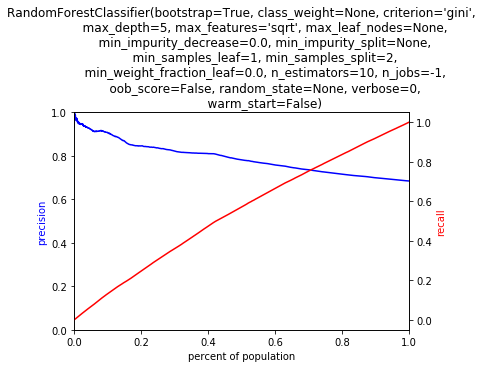

13.124804735183716


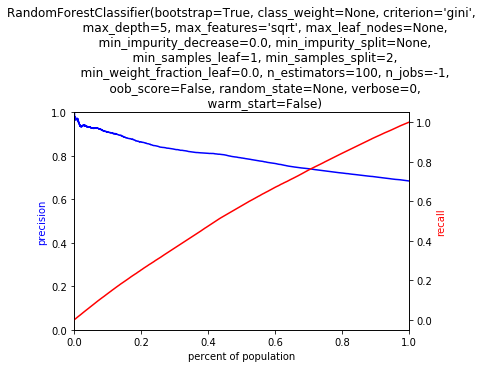

1.4455821514129639


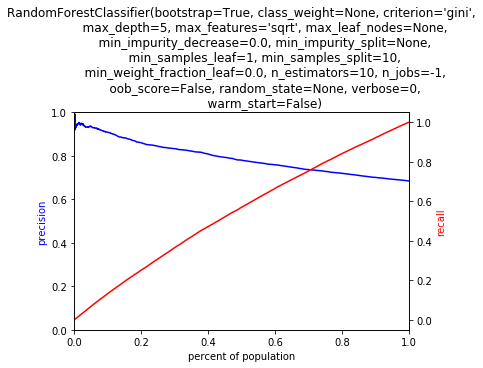

9.530230045318604


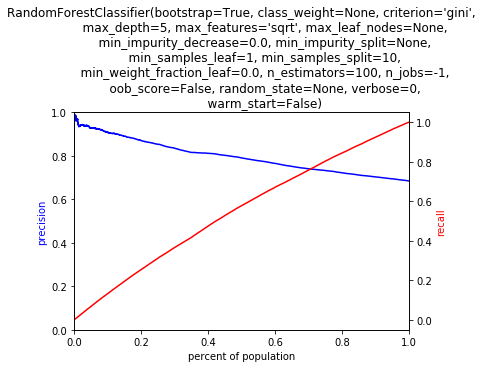

1.226139783859253


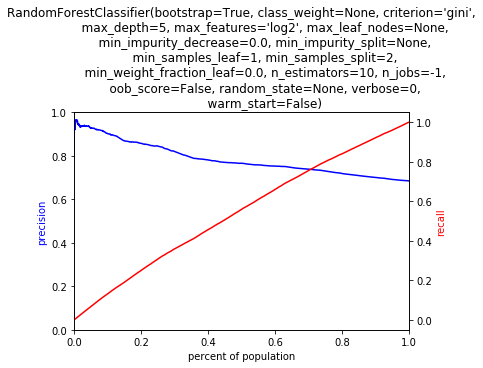

9.561591148376465


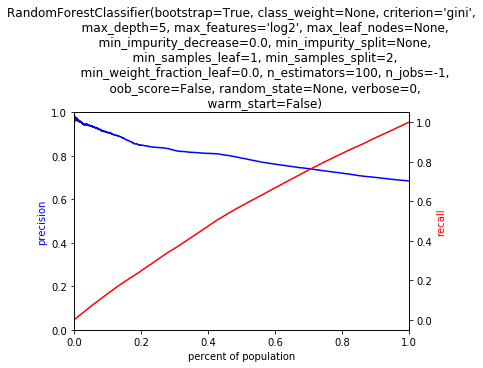

1.2956130504608154


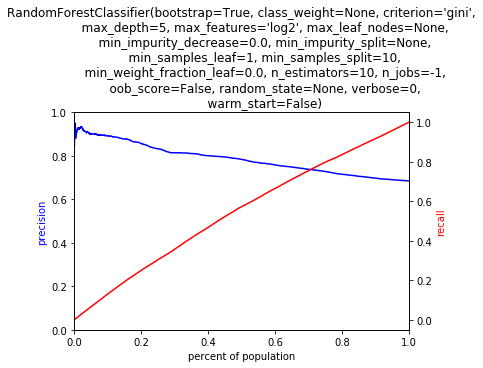

9.963388919830322


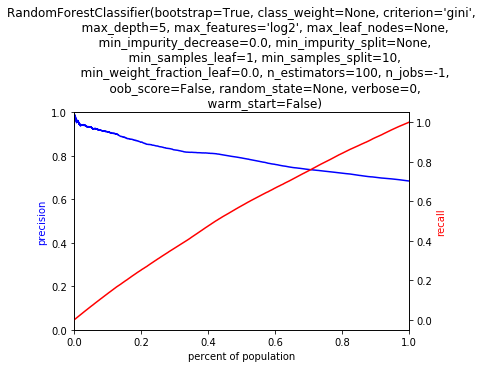

3.261096954345703


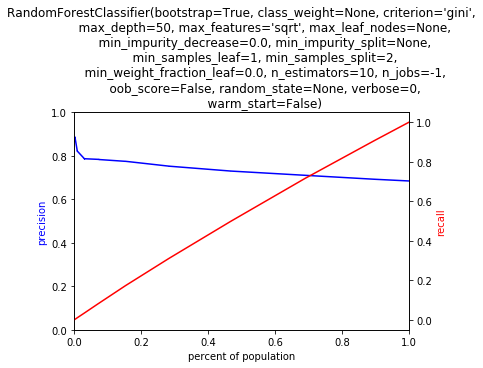

29.828216075897217


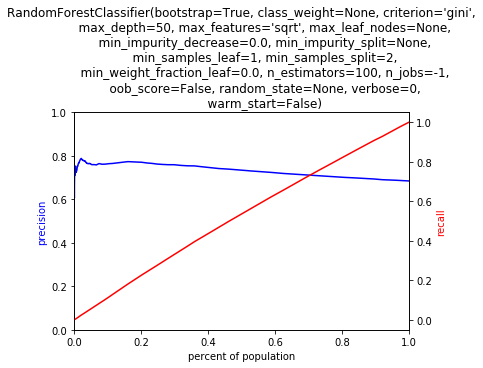

2.882657051086426


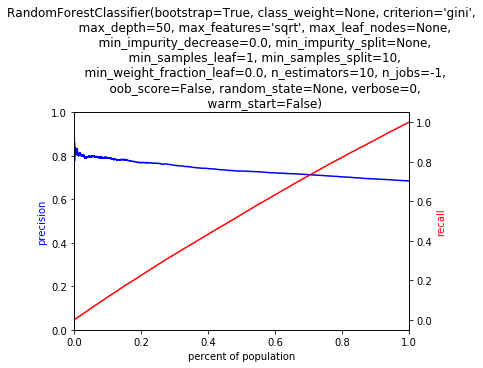

25.667471885681152


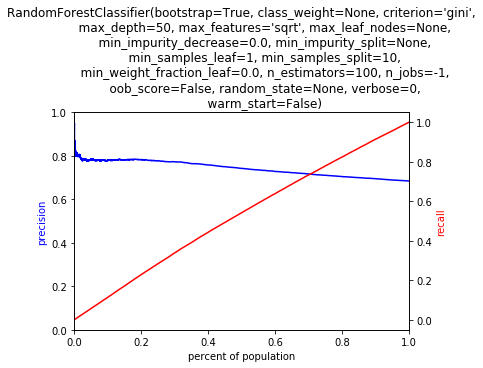

3.2043001651763916


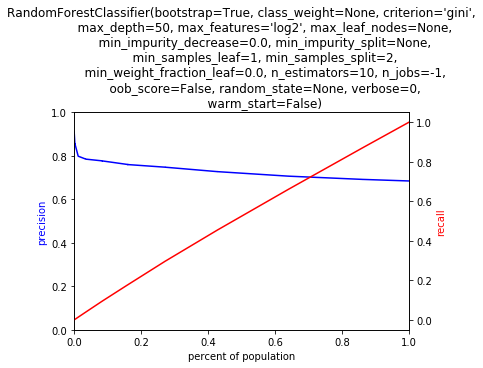

29.974076986312866


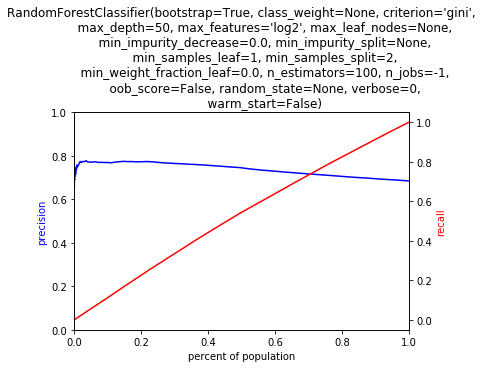

3.213137149810791


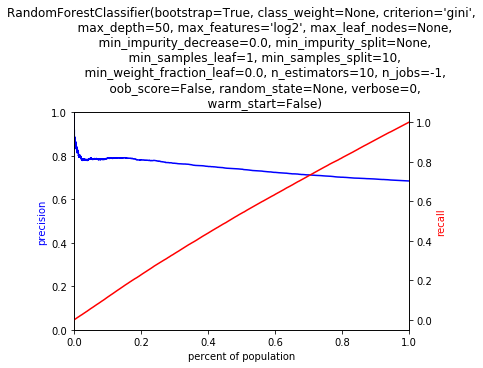

28.101124048233032


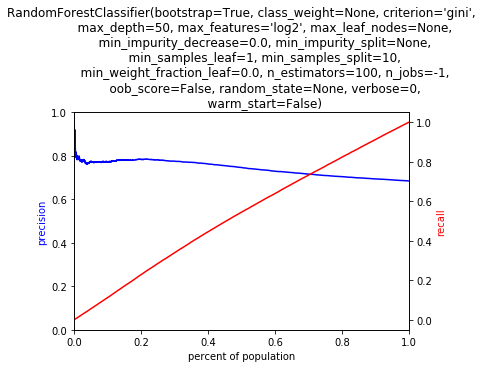

DT
{'criterion': ['gini', 'entropy'], 'max_depth': [10, 20, 50], 'max_features': ['sqrt', 'log2'], 'min_samples_split': [2, 5, 10]}
0.5184769630432129


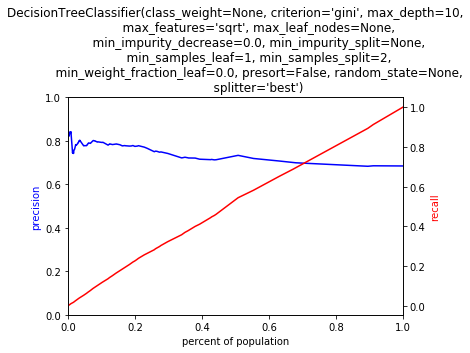

0.5954771041870117


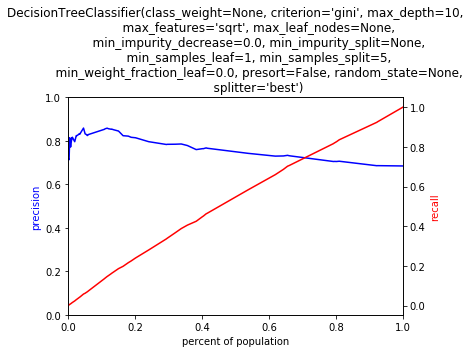

0.5342311859130859


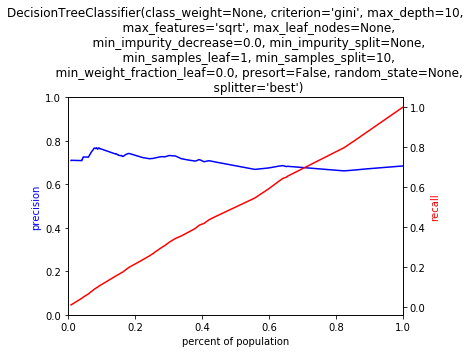

0.5993611812591553


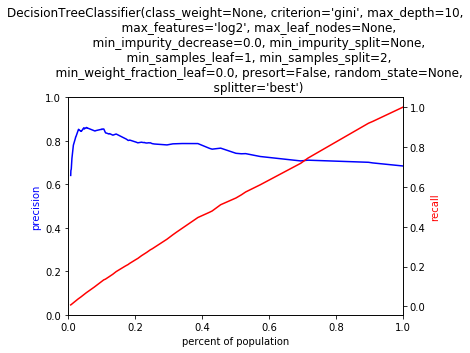

0.5504341125488281


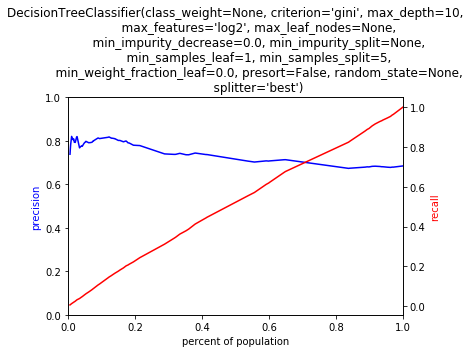

0.7336242198944092


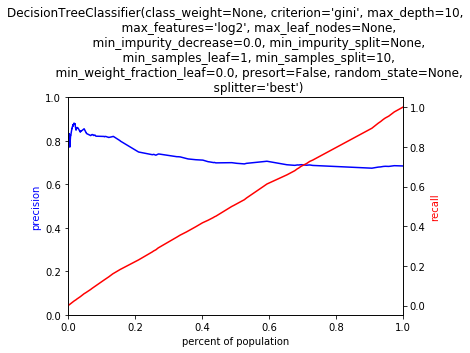

0.96999192237854


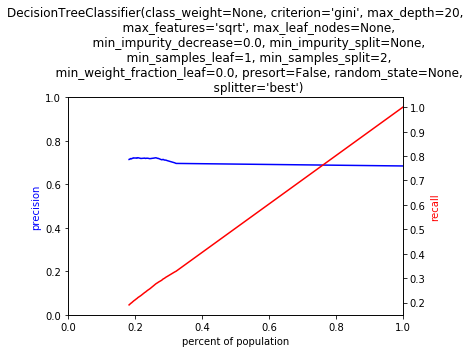

0.8122036457061768


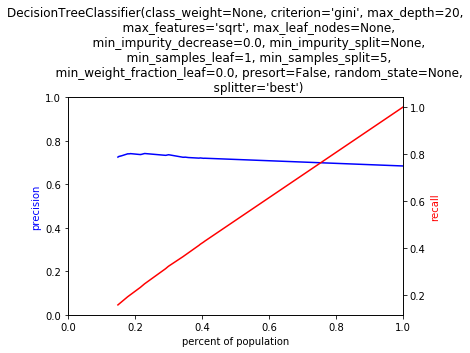

0.6935858726501465


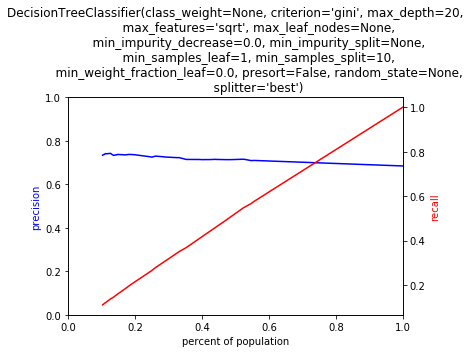

0.7130520343780518


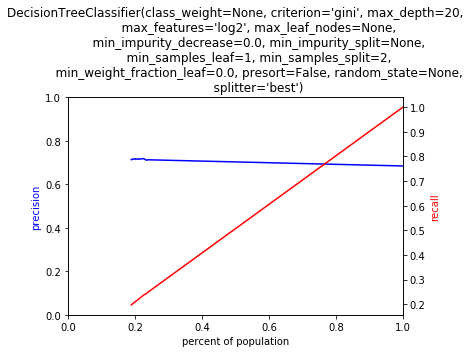

0.6625196933746338


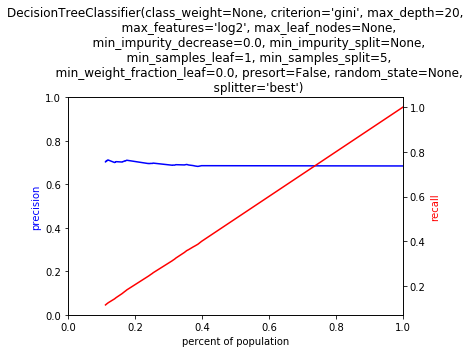

0.7323510646820068


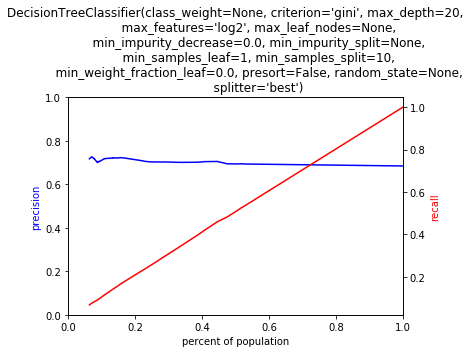

0.8021640777587891


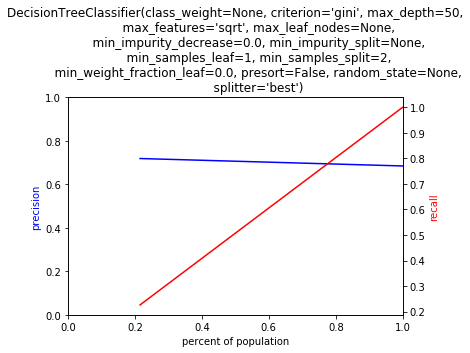

0.8795971870422363


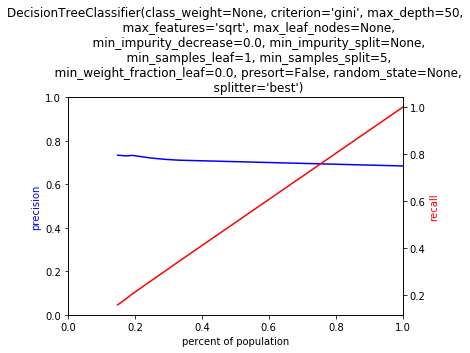

0.7573089599609375


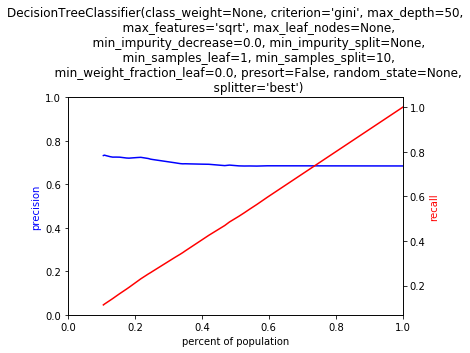

0.930781364440918


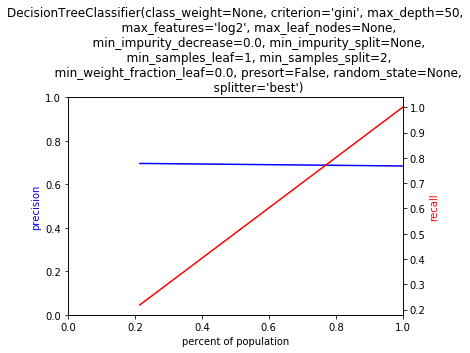

0.7557919025421143


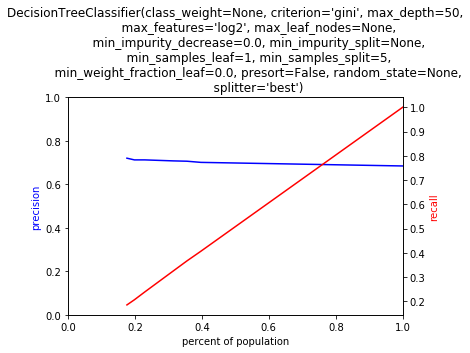

0.7950611114501953


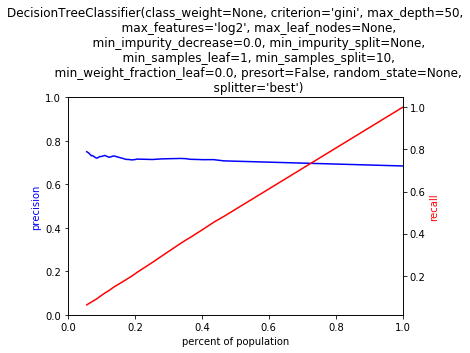

0.48903703689575195


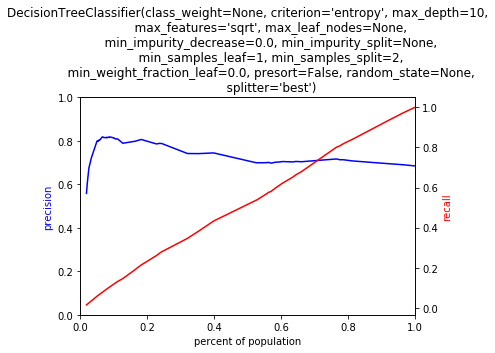

0.6383097171783447


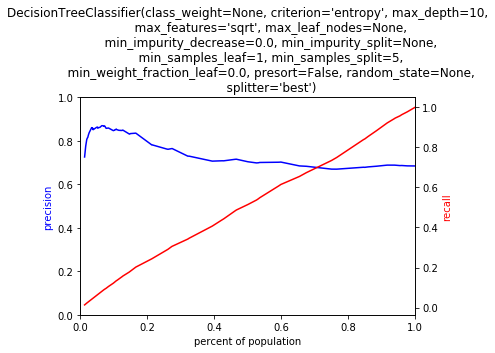

0.49183011054992676


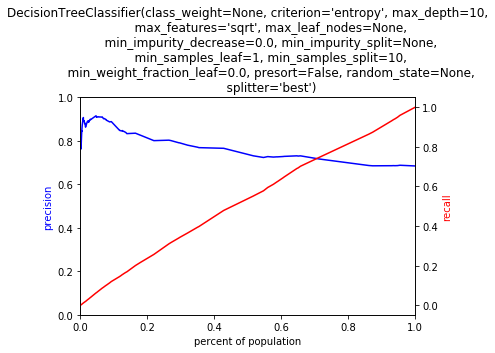

0.5851378440856934


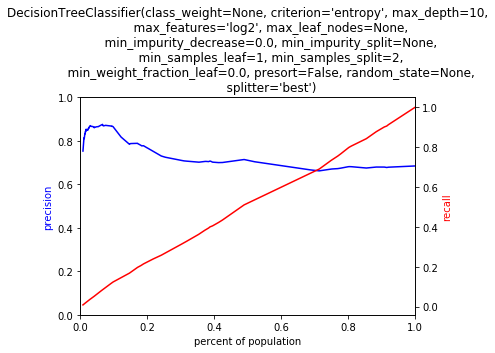

0.4819808006286621


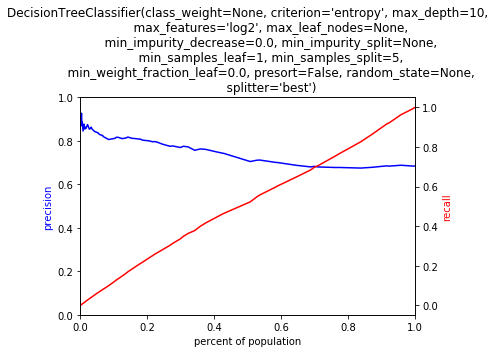

0.5590288639068604


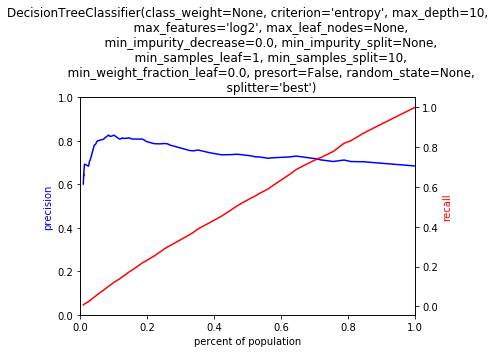

0.7536709308624268


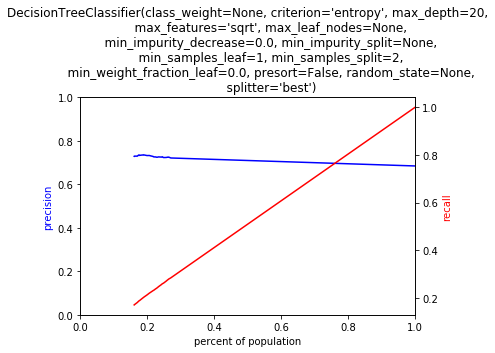

0.841947078704834


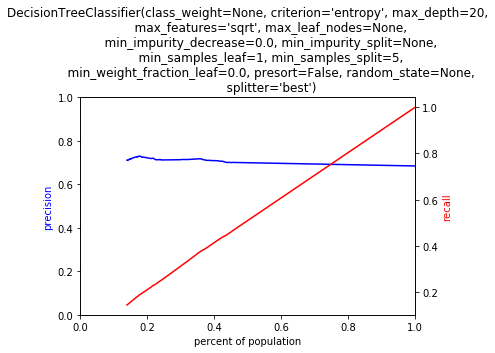

0.7153561115264893


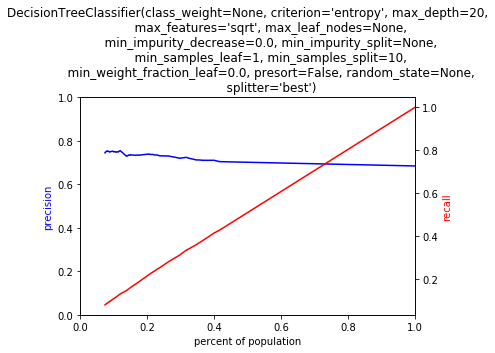

0.8538780212402344


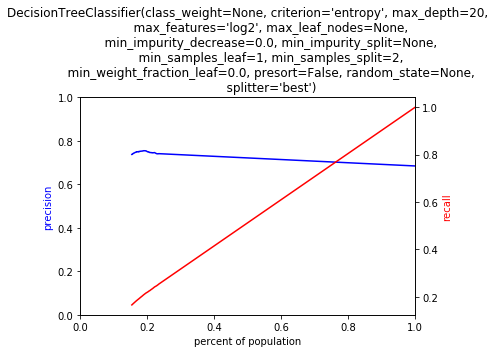

0.8685190677642822


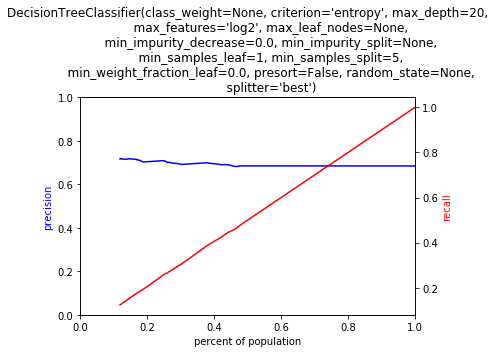

0.9111511707305908


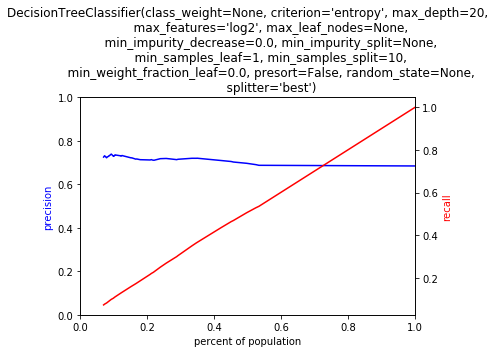

0.9672889709472656


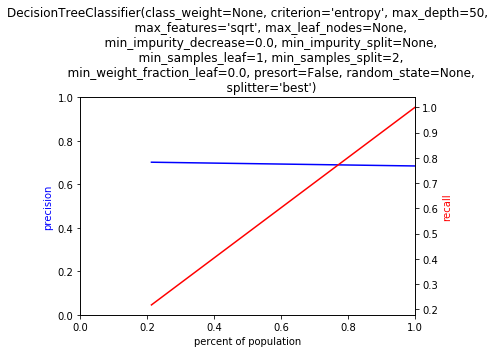

0.9220709800720215


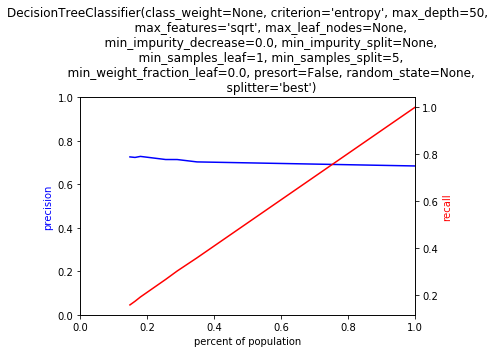

0.887197732925415


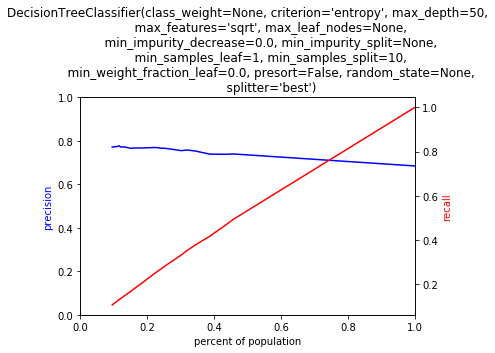

0.9969727993011475


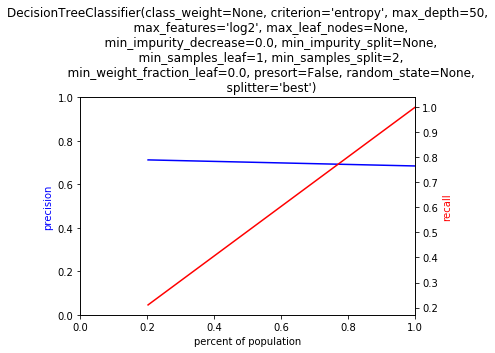

0.8594670295715332


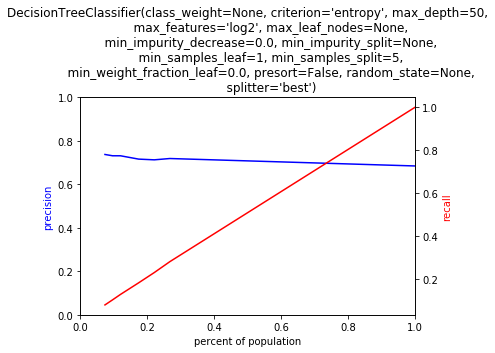

0.9963910579681396


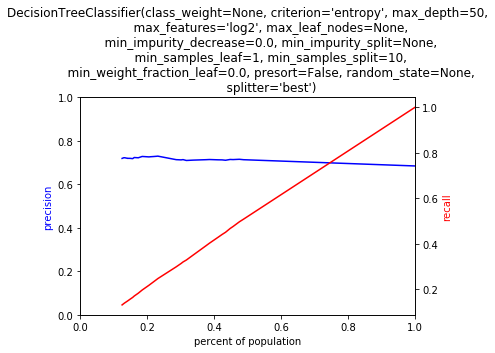

LR
{'penalty': ['l1', 'l2'], 'C': [0.001, 0.1, 1]}
1.0173969268798828


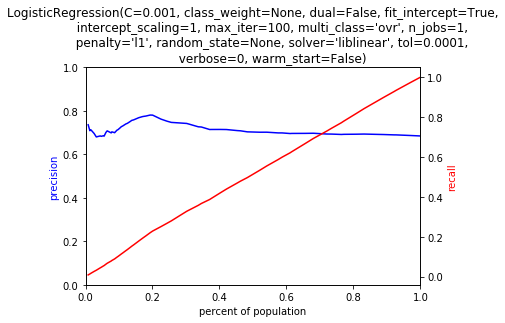

1.0716347694396973


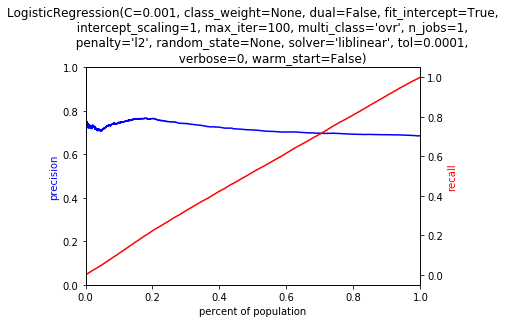

4.047019958496094


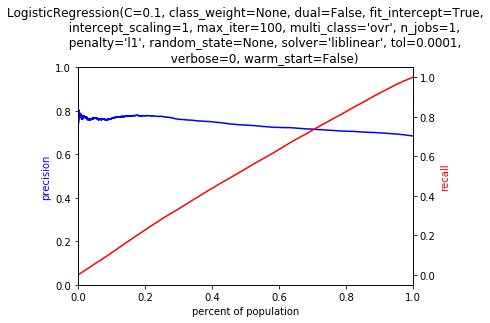

2.3453457355499268


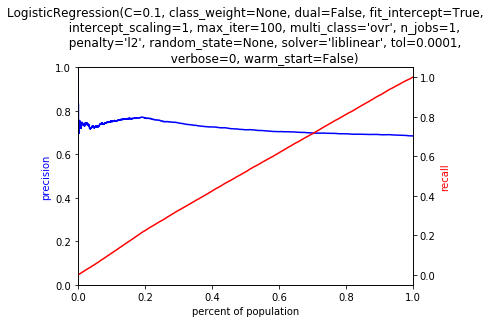

1.5341260433197021


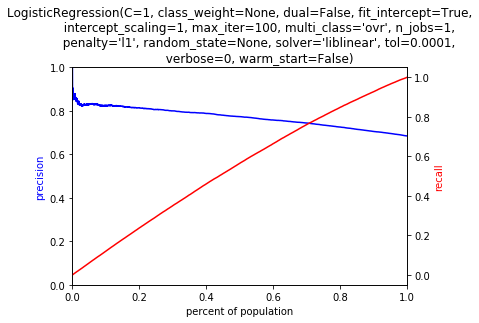

4.922369718551636


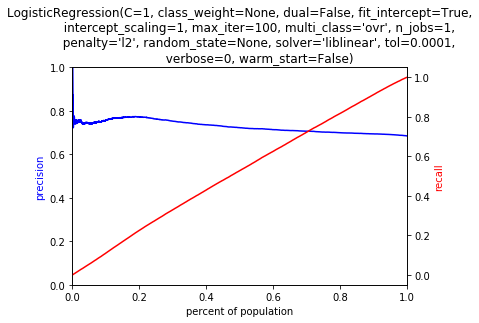

NB
{}
0.3909487724304199


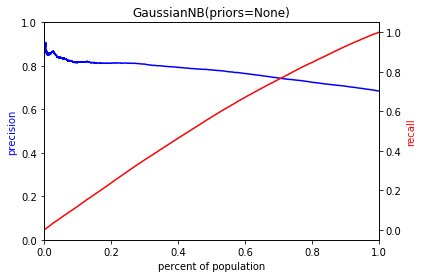

BAG
{'n_estimators': [10], 'max_samples': [5], 'max_features': [5, 10], 'bootstrap_features': [False, True]}
0.6519849300384521


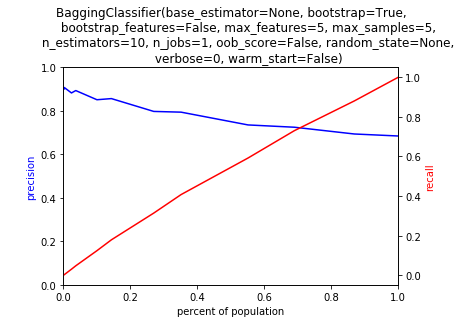

0.5407199859619141


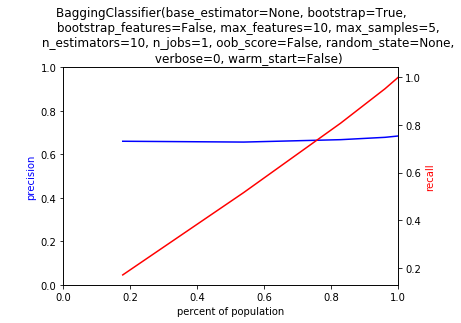

0.4908449649810791


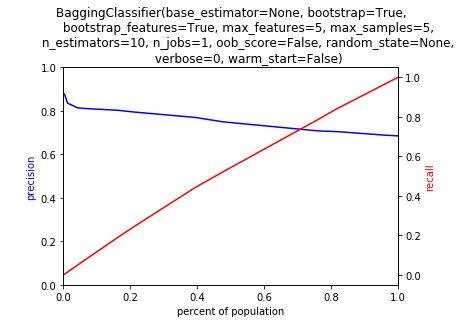

0.5616257190704346


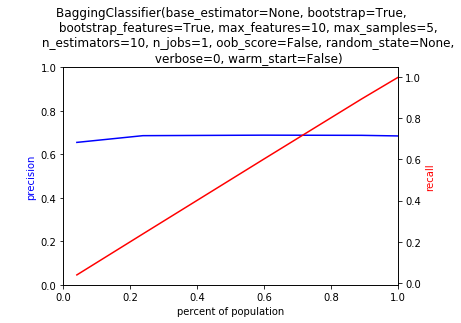

AB
{'algorithm': ['SAMME', 'SAMME.R'], 'n_estimators': [10, 100, 1000]}
2.38163685798645


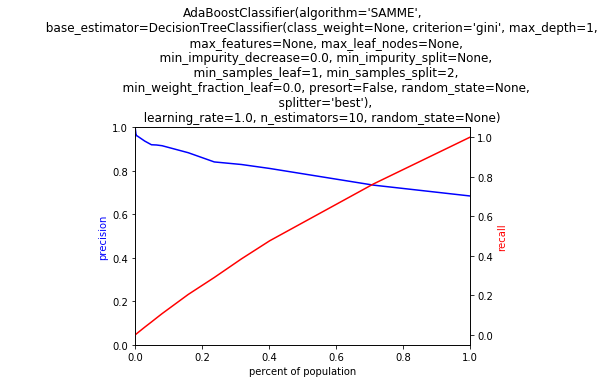

22.080049991607666


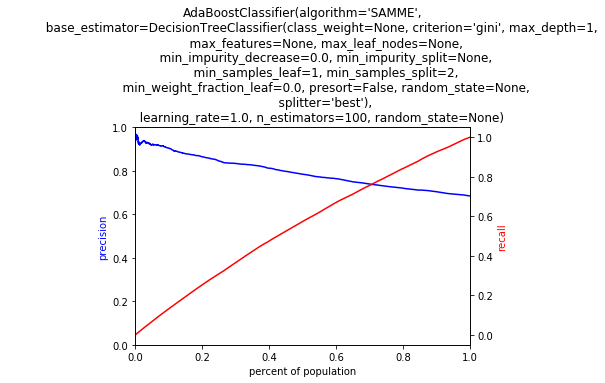

210.09049129486084


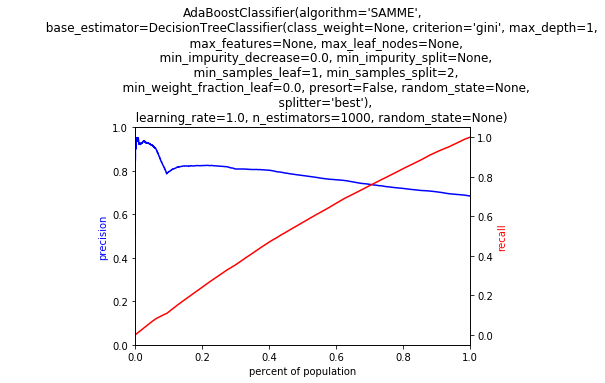

3.58707594871521


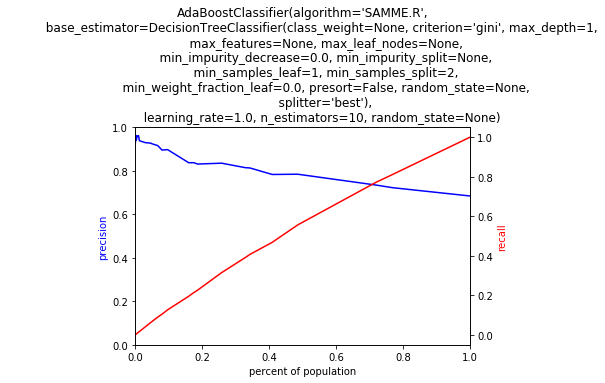

24.31085705757141


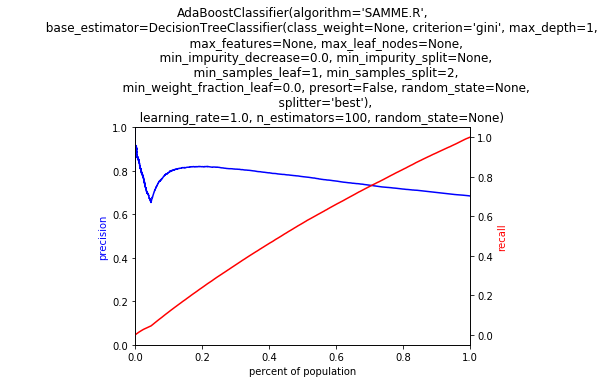

250.78388714790344


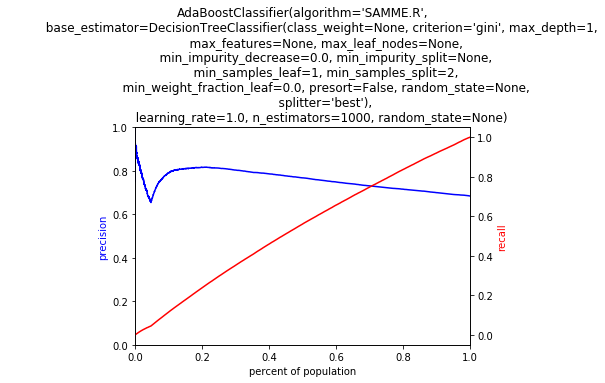

CUTOFF: 2013-06-30 VALIDATION: 2013-12-31
Booleans converted: fully_funded
Dummified: school_state
Dummified: school_zip
Dummified: school_metro
Booleans converted: school_charter
Booleans converted: school_magnet
Booleans converted: school_year_round
Booleans converted: school_nlns
Booleans converted: school_kipp
Booleans converted: school_charter_ready_promise
Dummified: teacher_prefix
Booleans converted: teacher_teach_for_america
Booleans converted: teacher_ny_teaching_fellow
Dummified: primary_focus_subject
Dummified: primary_focus_area
Dummified: secondary_focus_subject
Dummified: secondary_focus_area
Dummified: resource_type
Dummified: grade_level
Dummified: fulfillment_labor_materials
Normalizing: total_price_excluding_optional_support
Normalizing: total_price_including_optional_support
Missing values imputed: students_reached
Normalizing: students_reached
Booleans converted: eligible_double_your_impact_match
Booleans converted: eligible_almost_home_match
Getting month of date_p

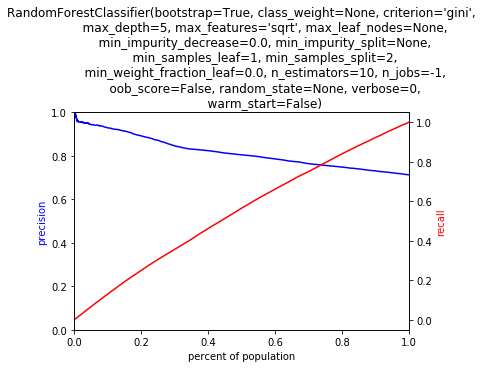

15.283507823944092


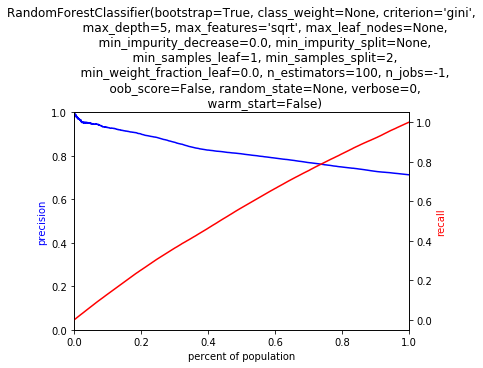

2.3217060565948486


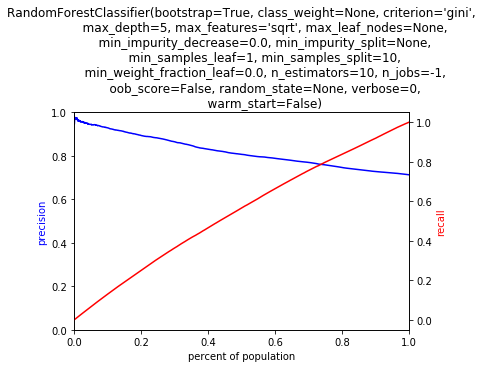

15.433048248291016


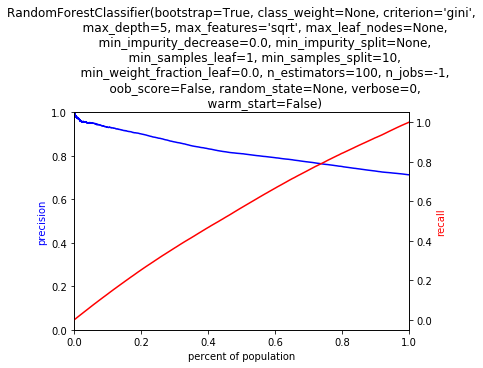

2.3177170753479004


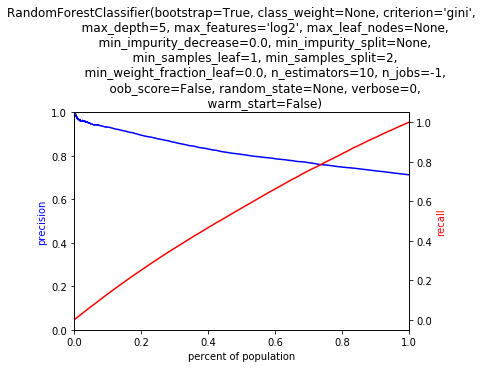

13.389338970184326


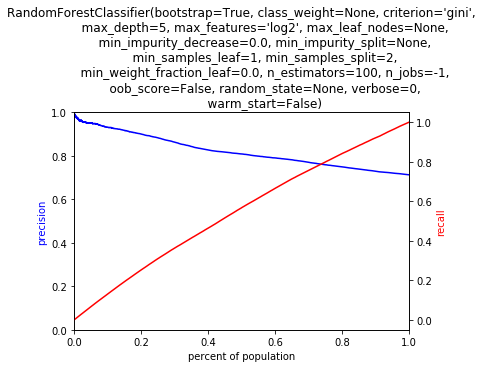

2.430062770843506


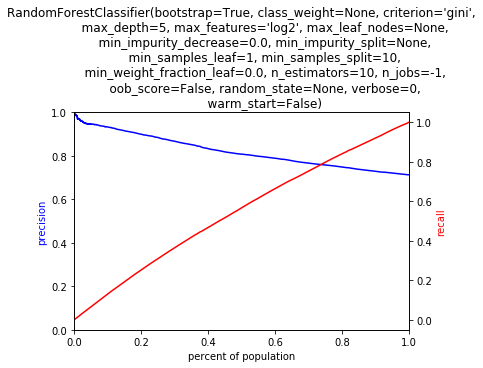

15.876828908920288


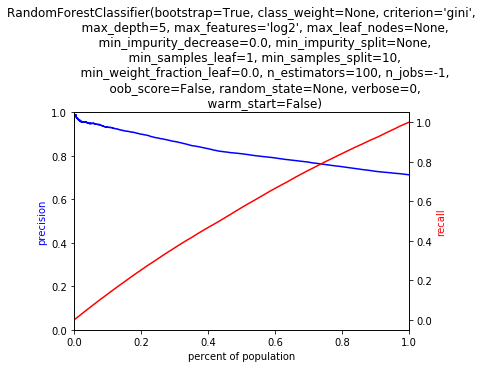

4.358696937561035


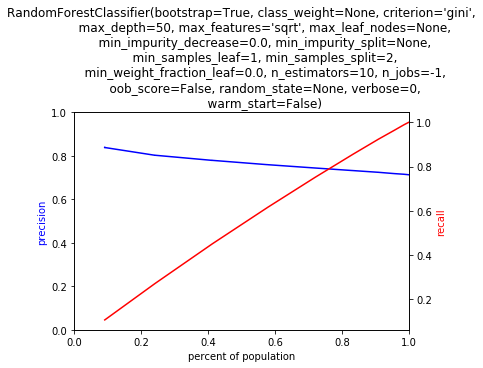

41.30349683761597


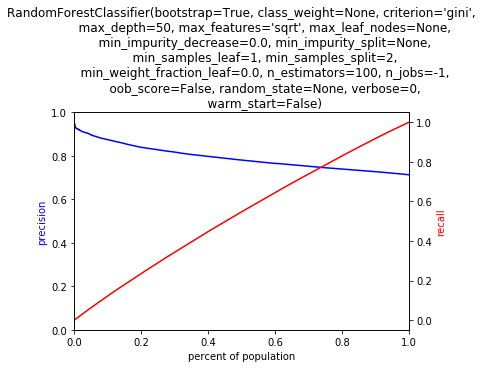

4.326841115951538


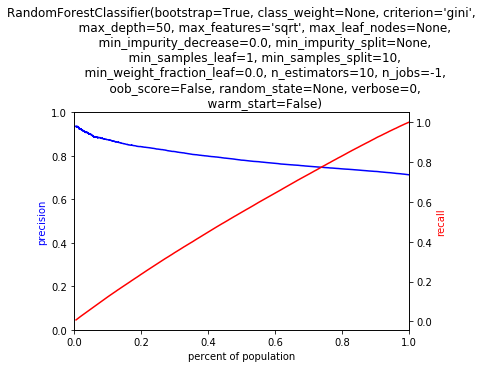

31.59907102584839


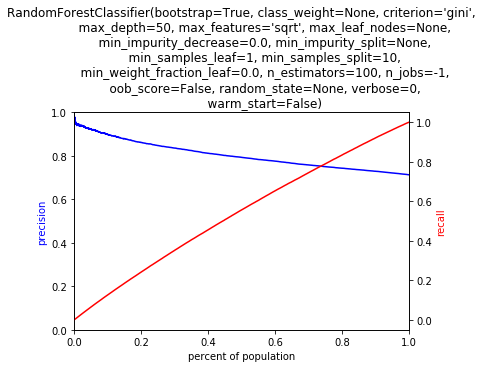

4.085314750671387


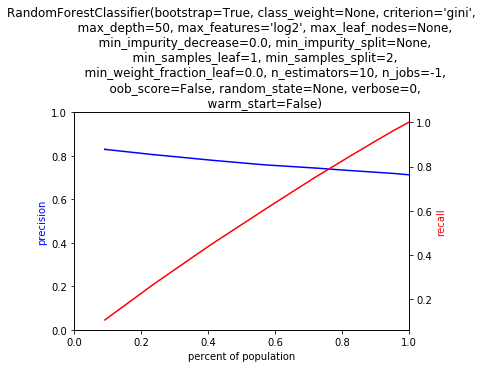

39.85277795791626


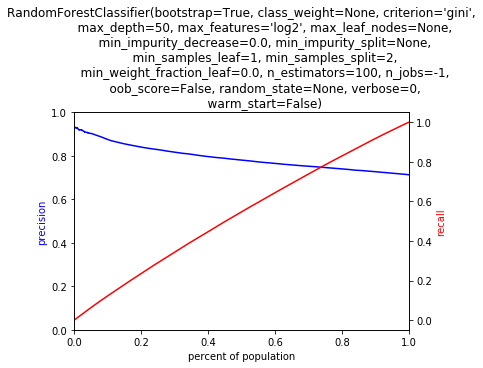

4.115384101867676


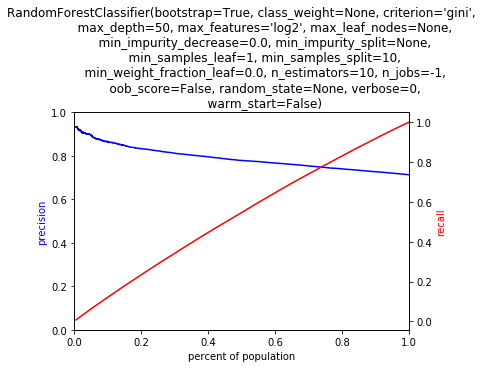

36.47549891471863


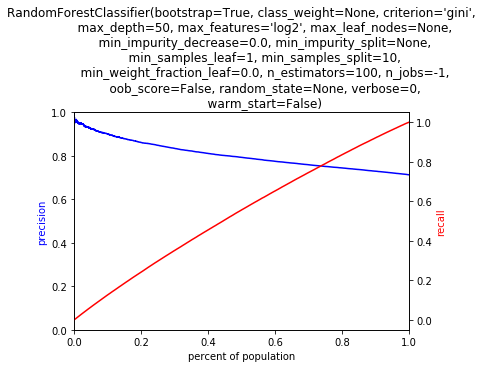

DT
{'criterion': ['gini', 'entropy'], 'max_depth': [10, 20, 50], 'max_features': ['sqrt', 'log2'], 'min_samples_split': [2, 5, 10]}
0.9011268615722656


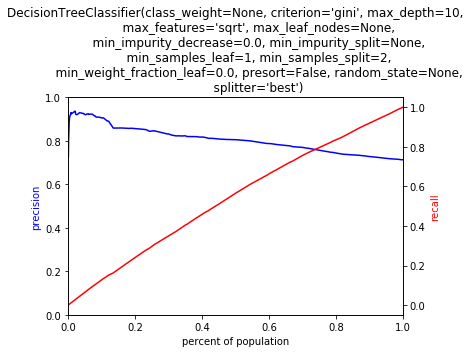

0.9019331932067871


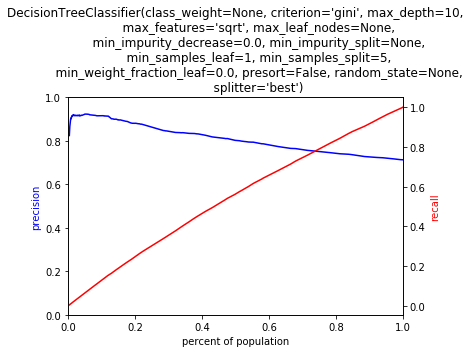

0.8737590312957764


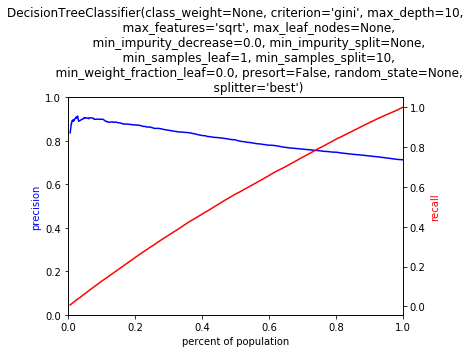

1.1256330013275146


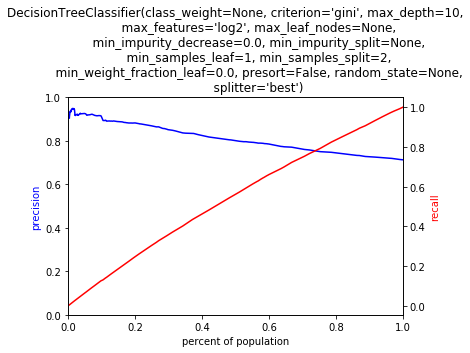

0.9775450229644775


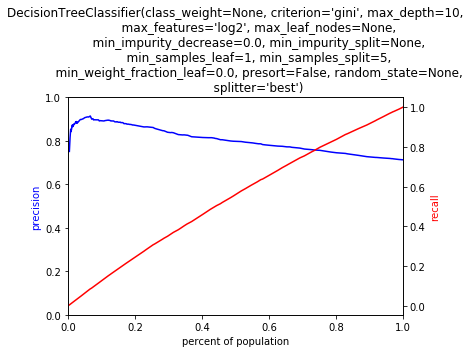

1.0624969005584717


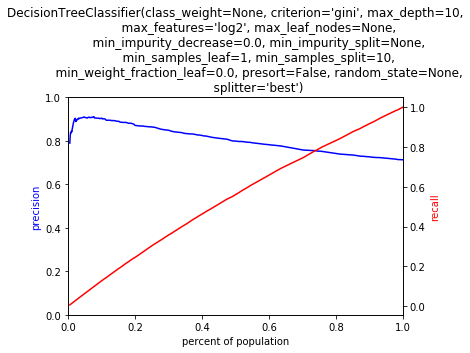

1.3734071254730225


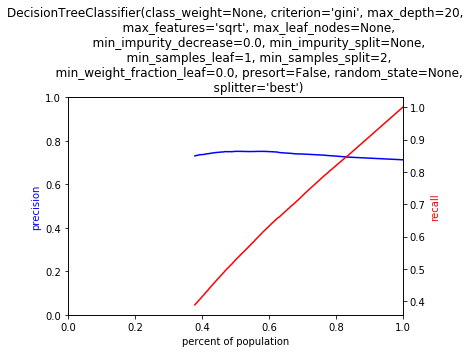

1.1419577598571777


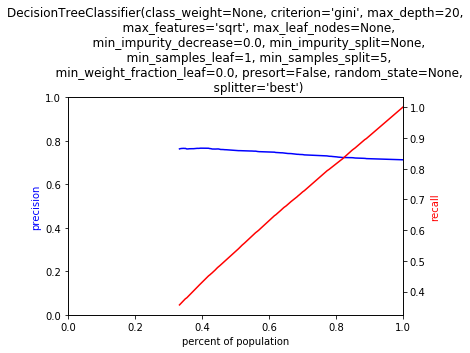

1.4015820026397705


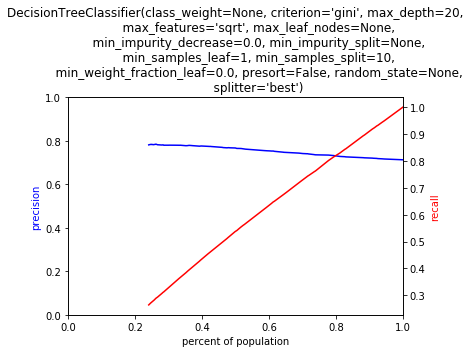

1.140394926071167


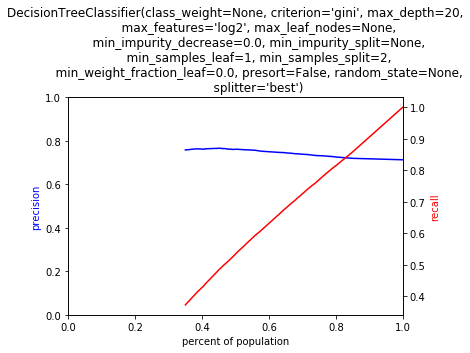

1.142477035522461


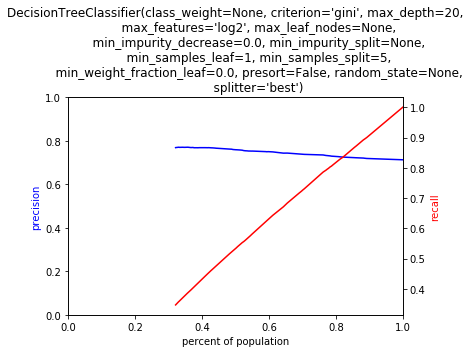

1.1801459789276123


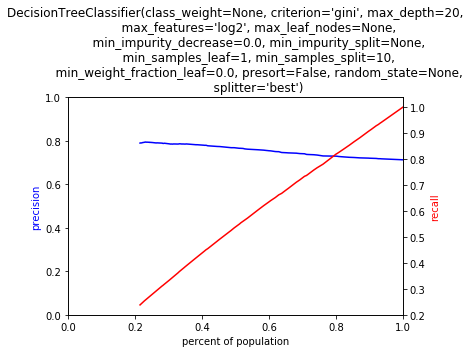

1.1487619876861572


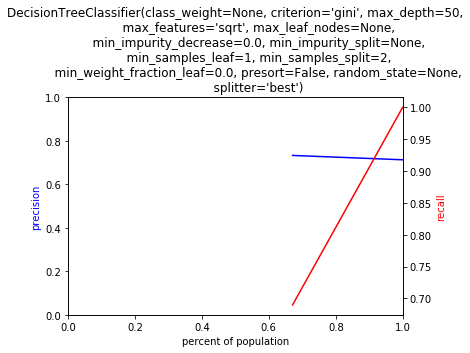

1.2591121196746826


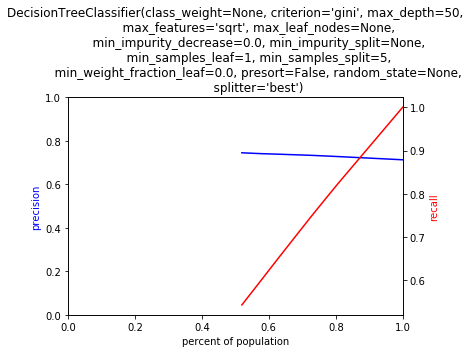

1.1409659385681152


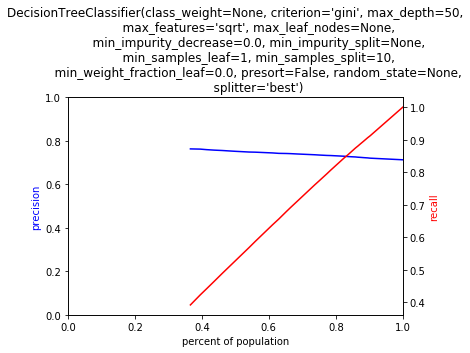

1.292133092880249


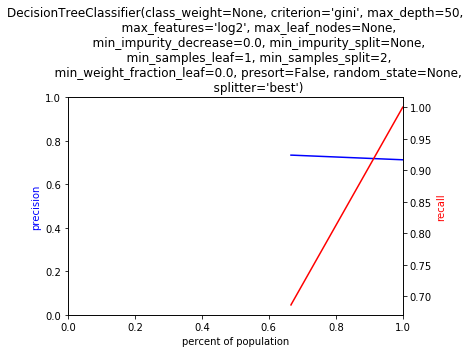

1.2014389038085938


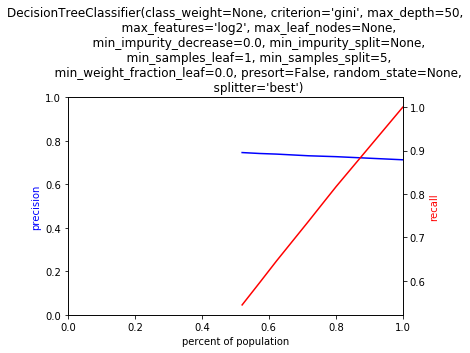

1.240488052368164


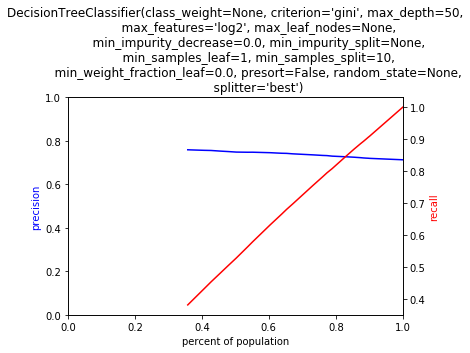

0.8728229999542236


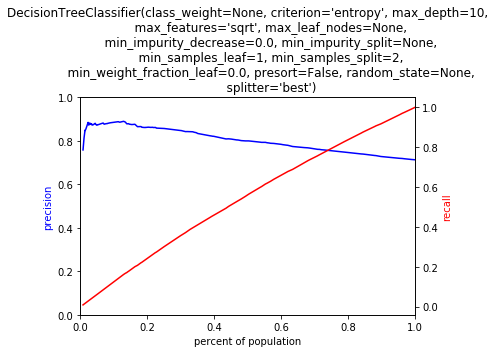

0.8772199153900146


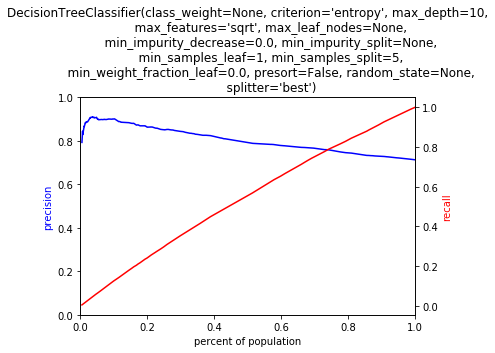

0.8744399547576904


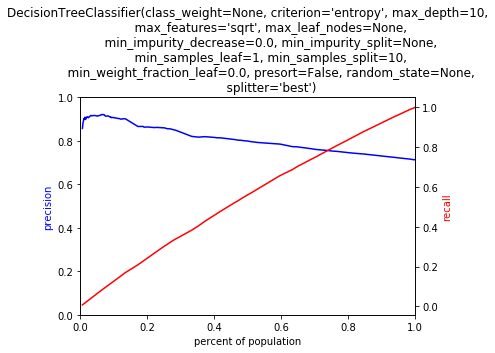

0.9330430030822754


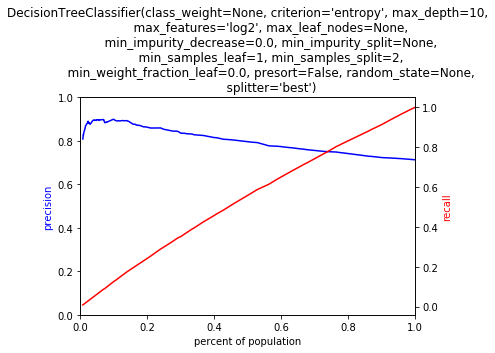

0.9003689289093018


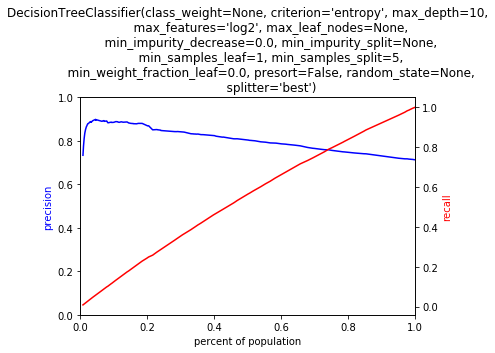

0.8920519351959229


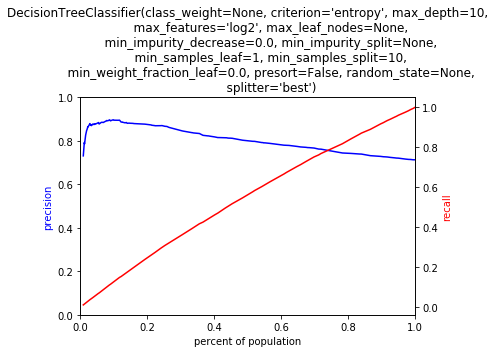

1.2406108379364014


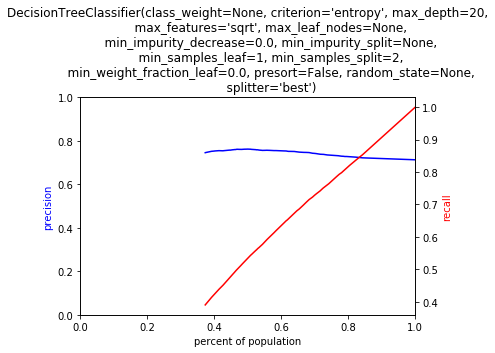

1.2396738529205322


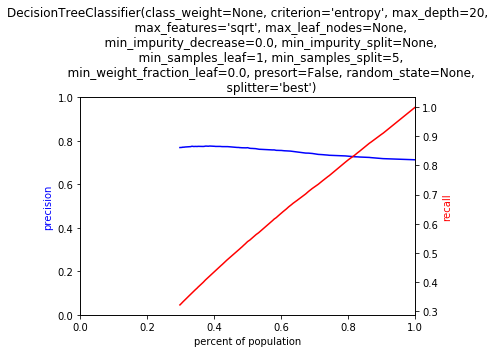

1.219024896621704


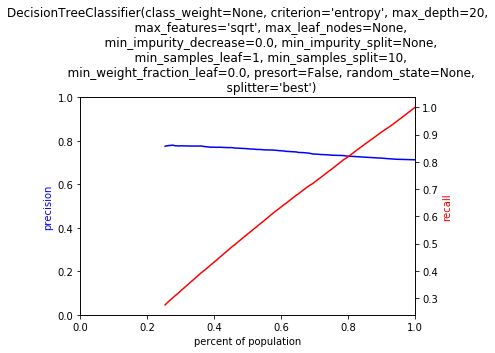

1.3948097229003906


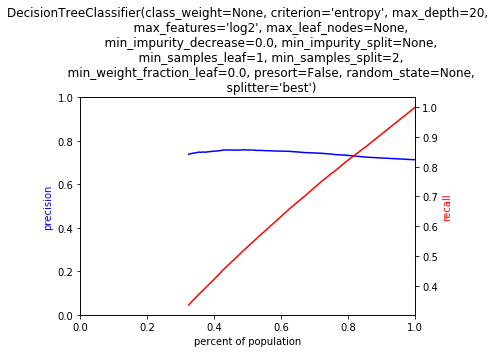

1.4028737545013428


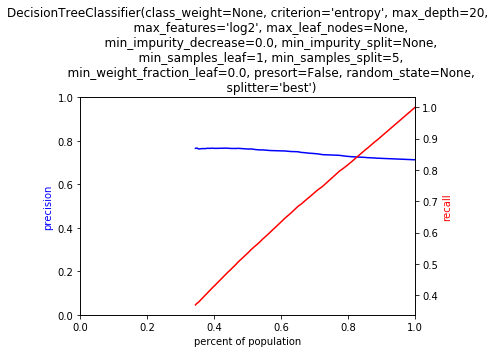

1.374009132385254


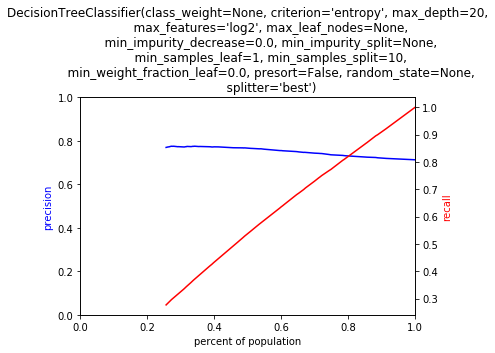

1.507786750793457


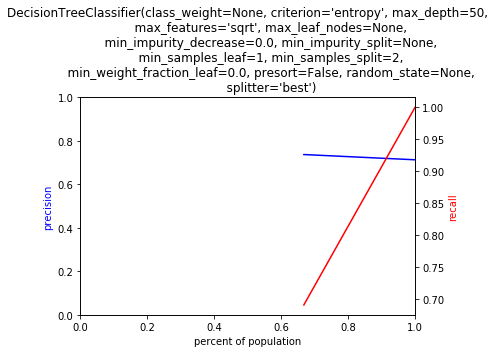

1.35160493850708


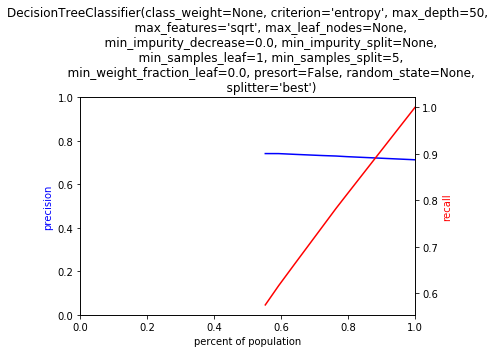

1.3248291015625


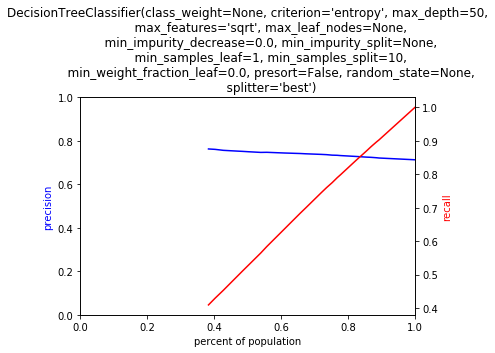

1.5663390159606934


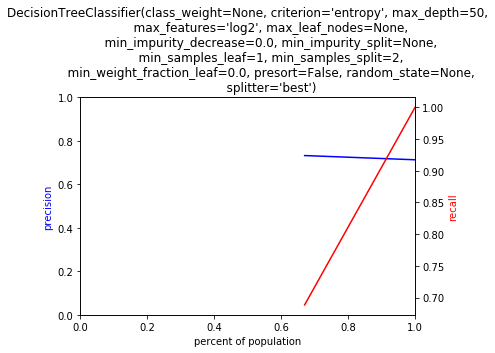

1.3910472393035889


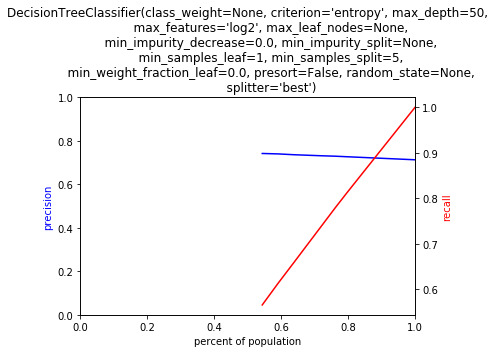

1.4709539413452148


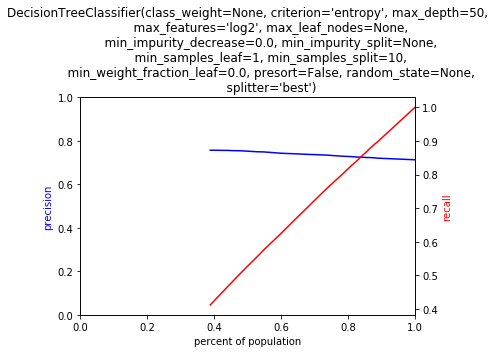

LR
{'penalty': ['l1', 'l2'], 'C': [0.001, 0.1, 1]}
1.7954139709472656


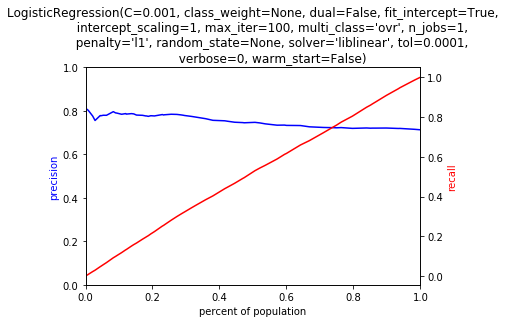

1.6814360618591309


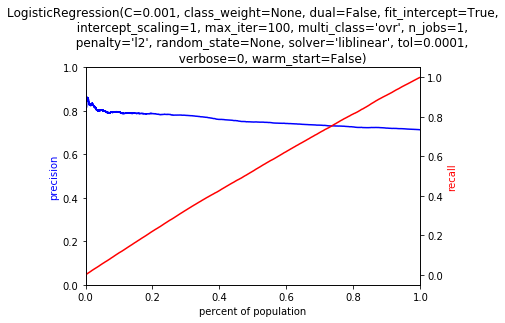

39.6333429813385


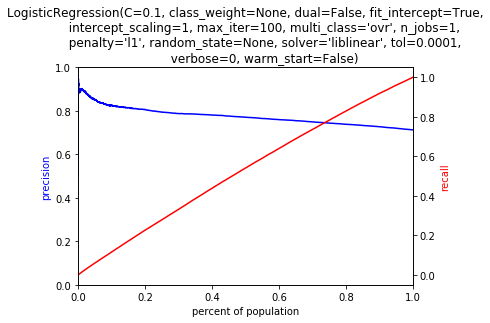

3.2583048343658447


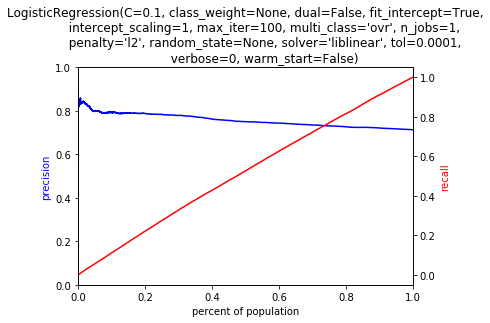

2.3011667728424072


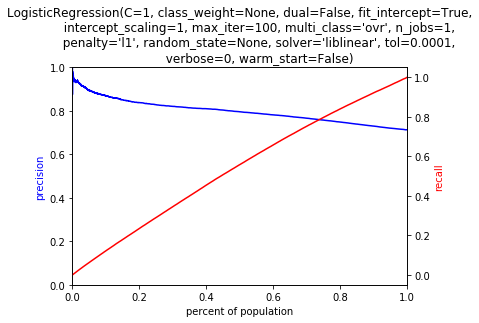

6.7432990074157715


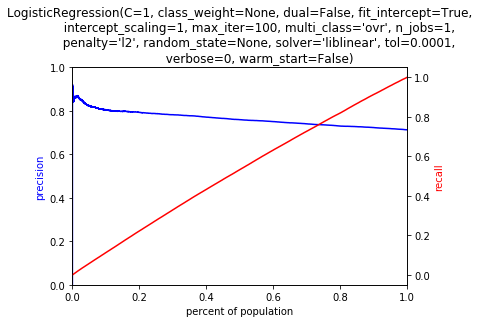

NB
{}
0.7934808731079102


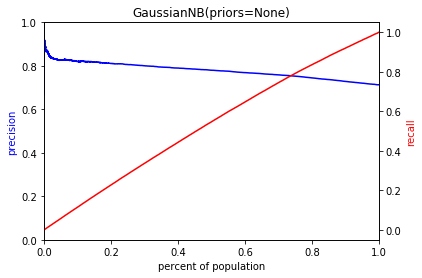

BAG
{'n_estimators': [10], 'max_samples': [5], 'max_features': [5, 10], 'bootstrap_features': [False, True]}
1.0622022151947021


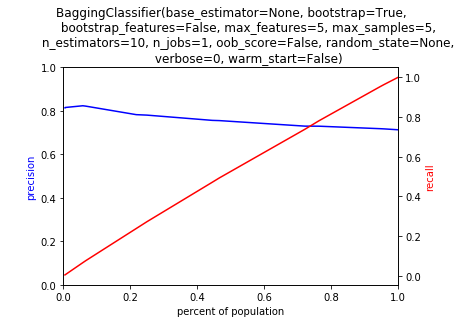

1.1283061504364014


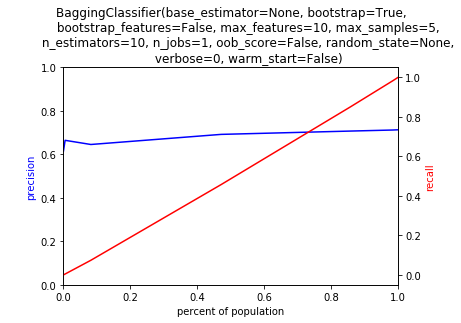

0.9394748210906982


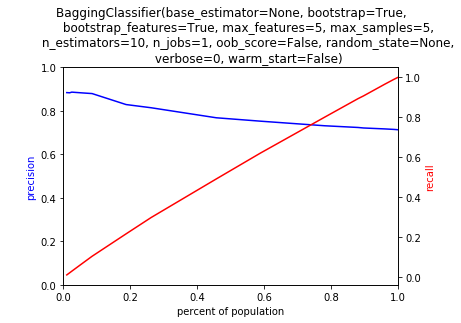

1.0320699214935303


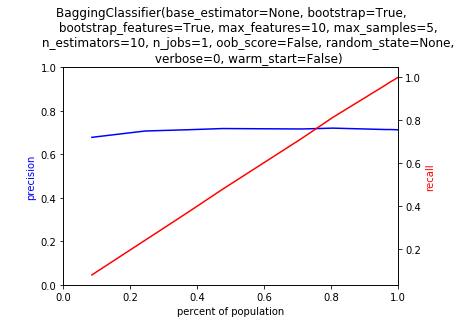

AB
{'algorithm': ['SAMME', 'SAMME.R'], 'n_estimators': [10, 100, 1000]}
3.1895430088043213


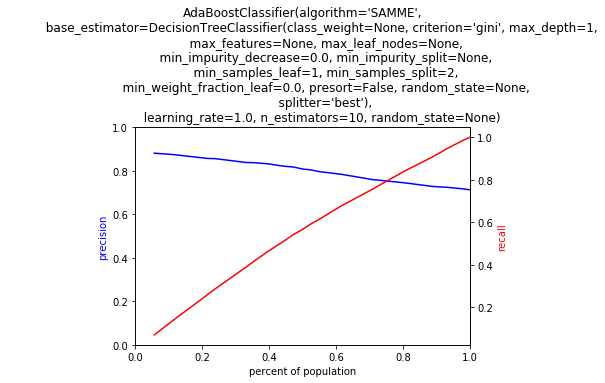

26.210175037384033


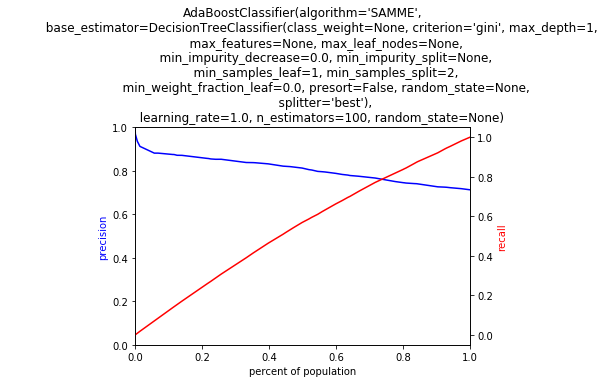

265.47935009002686


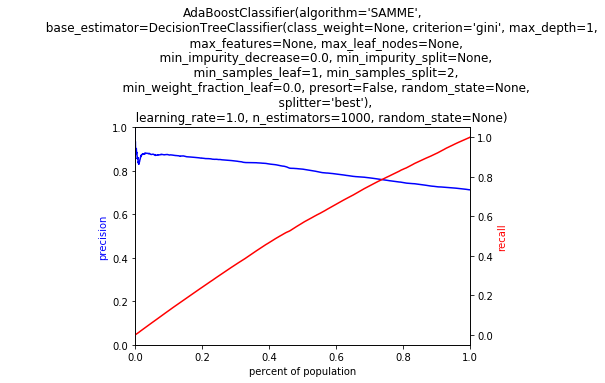

3.1781461238861084


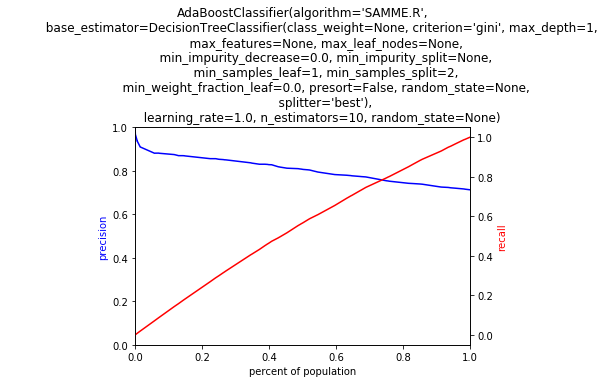

33.7027690410614


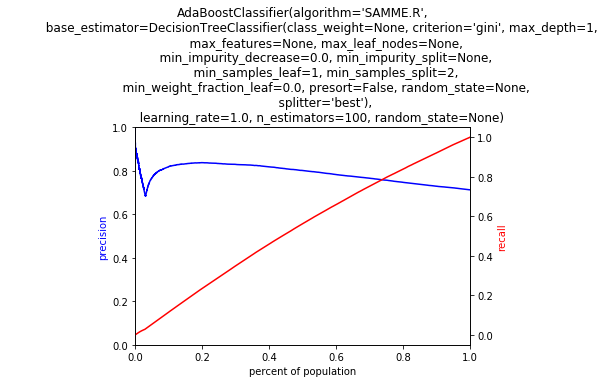

301.5542540550232


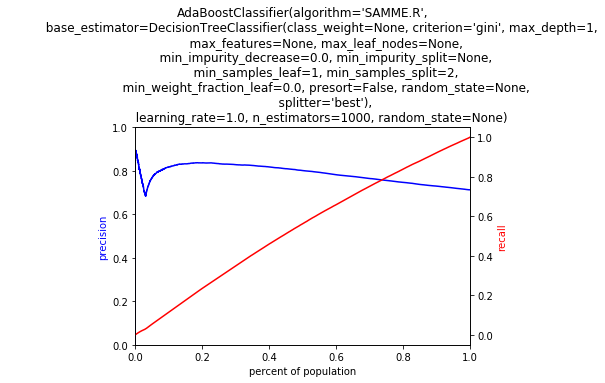

,model_type,clf,parameters,validation_date,train_set_size,validation_set_size,baseline,precision_at_5,precision_at_10,precision_at_20,precision_at_30,precision_at_50,recall_at_5,recall_at_10,recall_at_20,recall_at_30,recall_at_50,auc-roc,time_elapsed,features_used
0,RF,"(DecisionTreeClassifier(class_weight=None, cri...","{'max_depth': 5, 'max_features': 'sqrt', 'min_...",2011-12-31,47754,56442,0.740353,0.939759,0.913359,0.880936,0.870187,0.836328,0.063465,0.123364,0.237969,0.352598,0.564817,0.673259,0.612452,"[total_price_including_optional_support, total..."
1,RF,"(DecisionTreeClassifier(class_weight=None, cri...","{'max_depth': 5, 'max_features': 'sqrt', 'min_...",2011-12-31,47754,56442,0.740353,0.925585,0.915485,0.894224,0.876860,0.841784,0.062507,0.123651,0.241558,0.355302,0.568502,0.684554,2.573005,"[total_price_including_optional_support, total..."
2,RF,"(DecisionTreeClassifier(class_weight=None, cri...","{'max_depth': 5, 'max_features': 'sqrt', 'min_...",2011-12-31,47754,56442,0.740353,0.925230,0.910170,0.888820,0.871958,0.836859,0.062484,0.122933,0.240099,0.353316,0.565176,0.678580,0.719081,"[total_price_including_optional_support, total..."
3,RF,"(DecisionTreeClassifier(class_weight=None, cri...","{'max_depth': 5, 'max_features': 'sqrt', 'min_...",2011-12-31,47754,56442,0.740353,0.929837,0.914777,0.890769,0.873021,0.840544,0.062795,0.123555,0.240625,0.353746,0.567665,0.682166,2.011052,"[total_price_including_optional_support, total..."
4,RF,"(DecisionTreeClassifier(class_weight=None, cri...","{'max_depth': 5, 'max_features': 'log2', 'min_...",2011-12-31,47754,56442,0.740353,0.935152,0.917612,0.901400,0.878042,0.846604,0.063154,0.123938,0.243497,0.355781,0.571757,0.688838,0.584383,"[total_price_including_optional_support, total..."
5,RF,"(DecisionTreeClassifier(class_weight=None, cri...","{'max_depth': 5, 'max_features': 'log2', 'min_...",2011-12-31,47754,56442,0.740353,0.932318,0.910524,0.890149,0.875325,0.836824,0.062962,0.122981,0.240458,0.354680,0.565152,0.679629,2.009852,"[total_price_including_optional_support, total..."
6,RF,"(DecisionTreeClassifier(class_weight=None, cri...","{'max_depth': 5, 'max_features': 'log2', 'min_...",2011-12-31,47754,56442,0.740353,0.934089,0.921510,0.890149,0.874203,0.838135,0.063082,0.124465,0.240458,0.354225,0.566037,0.677669,0.677660,"[total_price_including_optional_support, total..."
7,RF,"(DecisionTreeClassifier(class_weight=None, cri...","{'max_depth': 5, 'max_features': 'log2', 'min_...",2011-12-31,47754,56442,0.740353,0.926293,0.913005,0.895641,0.874616,0.843096,0.062555,0.123316,0.241941,0.354393,0.569388,0.683647,2.158690,"[total_price_including_optional_support, total..."
8,RF,"(DecisionTreeClassifier(class_weight=None, cri...","{'max_depth': 50, 'max_features': 'sqrt', 'min...",2011-12-31,47754,56442,0.740353,0.885542,0.942771,0.908664,0.872017,0.844619,0.059803,0.127336,0.245459,0.353340,0.570417,0.624593,0.925225,"[total_price_including_optional_support, total..."
9,RF,"(DecisionTreeClassifier(class_weight=None, cri...","{'max_depth': 50, 'max_features': 'sqrt', 'min...",2011-12-31,47754,56442,0.740353,0.890858,0.883948,0.881113,0.867588,0.831367,0.060162,0.119391,0.238017,0.351545,0.561466,0.654564,5.154412,"[total_price_including_optional_support, total..."


In [11]:
tempura_validation_loop(df, CUTOFF_VAL_PAIRS, SMALL_GRID, 
                        ['RF', 'DT', 'LR', 'NB', 'BAG', 'AB'], 
                        'results/sg_feat_important.pkl', use_importance=True)

In [12]:
sg_ft_imp_results = read_file('results/sg_feat_important.pkl')

In [13]:
sg_ft_imp_results

,model_type,clf,parameters,validation_date,train_set_size,validation_set_size,baseline,precision_at_5,precision_at_10,precision_at_20,precision_at_30,precision_at_50,recall_at_5,recall_at_10,recall_at_20,recall_at_30,recall_at_50,auc-roc,time_elapsed,features_used
0,RF,"(DecisionTreeClassifier(class_weight=None, cri...","{'max_depth': 5, 'max_features': 'sqrt', 'min_...",2011-12-31,47754,56442,0.740353,0.939759,0.913359,0.880936,0.870187,0.836328,0.063465,0.123364,0.237969,0.352598,0.564817,0.673259,0.612452,"[total_price_including_optional_support, total..."
1,RF,"(DecisionTreeClassifier(class_weight=None, cri...","{'max_depth': 5, 'max_features': 'sqrt', 'min_...",2011-12-31,47754,56442,0.740353,0.925585,0.915485,0.894224,0.876860,0.841784,0.062507,0.123651,0.241558,0.355302,0.568502,0.684554,2.573005,"[total_price_including_optional_support, total..."
2,RF,"(DecisionTreeClassifier(class_weight=None, cri...","{'max_depth': 5, 'max_features': 'sqrt', 'min_...",2011-12-31,47754,56442,0.740353,0.925230,0.910170,0.888820,0.871958,0.836859,0.062484,0.122933,0.240099,0.353316,0.565176,0.678580,0.719081,"[total_price_including_optional_support, total..."
3,RF,"(DecisionTreeClassifier(class_weight=None, cri...","{'max_depth': 5, 'max_features': 'sqrt', 'min_...",2011-12-31,47754,56442,0.740353,0.929837,0.914777,0.890769,0.873021,0.840544,0.062795,0.123555,0.240625,0.353746,0.567665,0.682166,2.011052,"[total_price_including_optional_support, total..."
4,RF,"(DecisionTreeClassifier(class_weight=None, cri...","{'max_depth': 5, 'max_features': 'log2', 'min_...",2011-12-31,47754,56442,0.740353,0.935152,0.917612,0.901400,0.878042,0.846604,0.063154,0.123938,0.243497,0.355781,0.571757,0.688838,0.584383,"[total_price_including_optional_support, total..."
5,RF,"(DecisionTreeClassifier(class_weight=None, cri...","{'max_depth': 5, 'max_features': 'log2', 'min_...",2011-12-31,47754,56442,0.740353,0.932318,0.910524,0.890149,0.875325,0.836824,0.062962,0.122981,0.240458,0.354680,0.565152,0.679629,2.009852,"[total_price_including_optional_support, total..."
6,RF,"(DecisionTreeClassifier(class_weight=None, cri...","{'max_depth': 5, 'max_features': 'log2', 'min_...",2011-12-31,47754,56442,0.740353,0.934089,0.921510,0.890149,0.874203,0.838135,0.063082,0.124465,0.240458,0.354225,0.566037,0.677669,0.677660,"[total_price_including_optional_support, total..."
7,RF,"(DecisionTreeClassifier(class_weight=None, cri...","{'max_depth': 5, 'max_features': 'log2', 'min_...",2011-12-31,47754,56442,0.740353,0.926293,0.913005,0.895641,0.874616,0.843096,0.062555,0.123316,0.241941,0.354393,0.569388,0.683647,2.158690,"[total_price_including_optional_support, total..."
8,RF,"(DecisionTreeClassifier(class_weight=None, cri...","{'max_depth': 50, 'max_features': 'sqrt', 'min...",2011-12-31,47754,56442,0.740353,0.885542,0.942771,0.908664,0.872017,0.844619,0.059803,0.127336,0.245459,0.353340,0.570417,0.624593,0.925225,"[total_price_including_optional_support, total..."
9,RF,"(DecisionTreeClassifier(class_weight=None, cri...","{'max_depth': 50, 'max_features': 'sqrt', 'min...",2011-12-31,47754,56442,0.740353,0.890858,0.883948,0.881113,0.867588,0.831367,0.060162,0.119391,0.238017,0.351545,0.561466,0.654564,5.154412,"[total_price_including_optional_support, total..."


<br>
<h1><center>Evaluation of Models on Predicting Fundraising Project Success</center></h1>

## Kaggle Challenge Description

DonorsChoose.org is an online charity that makes it easy to help students in need through school donations. At any time, thousands of teachers in K-12 schools propose projects requesting materials to enhance the education of their students. When a project reaches its funding goal, they ship the materials to the school.

The 2014 KDD Cup asks participants to help DonorsChoose.org identify projects that are exceptionally exciting to the business, at the time of posting. While all projects on the site fulfill some kind of need, certain projects have a quality above and beyond what is typical. By identifying and recommending such projects early, they will improve funding outcomes, better the user experience, and help more students receive the materials they need to learn.

Successful predictions may require a broad range of analytical skills, from natural language processing on the need statements to data mining and classical supervised learning on the descriptive factors around each project.

[Full Page Here](https://www.kaggle.com/c/kdd-cup-2014-predicting-excitement-at-donors-choose)

## Report

### Background and Objectives
DonorsChoose.org is an online charity and crowdfunding platform that allows individuals to donate directly to public school classroom projects. The project postings come from teachers in K-12 schools requesting school materials ranging from basic school supplies like paper and pencil to technology requests like computers.

The goal of this challenge is to predict, based on what we know about the project at the time of its posting, whether a project will be fully funded. Data we have include geographical information about schools, grade level, teachers, projected cost of project, and potential impact in number of students reached.

### Temporal Holdout Framework
Given data on 2011 to 2013, we reserve the final six month time period (2013-07-01 to 2013-12-31) to make a final prediction. We train models with various machine learning models using successively increasing time chunks, validating the models with the six months of data immediately following the training period. The details of the timeline used for model validation is shown below. This framework will be helpful in discerning whether models perform differently over time or there is an anomaly during a given period.

<img src="temporal_holdout.png" alt="temporal holdout" style="width: 500px;"/>

### Results of Models
Our analysis sought to assess different models and parameters' efficiency and accuracy in predicting whether a project listed on DonorsChoose.org would receive full funding. Regarding efficiency, K-Nearest Neighbors and Support Vector Machines were extremely time-intensive to run, and, therefore have been deemed unsuitable and excluded from our comparison. A preliminary evaluation of KNN on the full training data took approximately 1,900 seconds.

We fit six different learning algorithms (Random Forest, Decision Trees, Logistic Regression, Naive Bayes, Bagged Trees, and Boosted Trees) to the training set 1) using all features and 2) using only the top 20 "important" features computed using a random forest of trees for each training set and find the following:
- In the case where we considered only important features, the model with the highest auc-roc was a random forest with a max depth of 5 at 0.66. In the case where we considered all features, a random forest with max depth of 50 had the highest auc-roc of 0.68. Given the baseline accuracy for the model is 0.71, the result is unimpressive.
- However, all models perform better on precision than recall, maintaining a precision above 80% for those projects with the top 10% highest probability of being classified "fully funded." While our models do not make many false positive predictions, they tend to misclassify those projects that might actually have a chance of being fully funded as having a low probability.


In [25]:
importance.head(5)

,feature,importance
1,total_price_including_optional_support,0.143728
2,total_price_excluding_optional_support,0.143607
3,students_reached,0.119425
4,date_posted_month,0.105699
5,eligible_double_your_impact_match,0.020855


### Recommendation Based on Feature Importance
A natural thing to wonder and is most salient for teachers who seek to receive full funding for their projects is which features have the most predictive power or are most correlated with the outcome. Based on our results, we conclude that while our models perform better when we include everything we know about the project at the time of prediction, there are few variables that tend to drive the prediction. 

The following are the top 10 important features computed using a random forest of trees on the full training set. The importance of each feature drops after the top four. The total price of the project emerges as the most important determinant in funding. Number of students reached is also an important feature. Therefore, an interesting aspect to explore would be the tradeoff between the cost of a project vs. its potential impact.

In [23]:
c, v = CUTOFF_VAL_PAIRS[-1]
train , test = temporal_split(df, 'date_posted', c, v)
tr, te, f = pre_process(train, test)
potential_features = list(f)
y = tr.fully_funded
X = tr[potential_features]
importance = feature_importance(X, y, 10)

Booleans converted: fully_funded
Dummified: school_state
Dummified: school_zip
Dummified: school_metro
Booleans converted: school_charter
Booleans converted: school_magnet
Booleans converted: school_year_round
Booleans converted: school_nlns
Booleans converted: school_kipp
Booleans converted: school_charter_ready_promise
Dummified: teacher_prefix
Booleans converted: teacher_teach_for_america
Booleans converted: teacher_ny_teaching_fellow
Dummified: primary_focus_subject
Dummified: primary_focus_area
Dummified: secondary_focus_subject
Dummified: secondary_focus_area
Dummified: resource_type
Dummified: grade_level
Dummified: fulfillment_labor_materials
Normalizing: total_price_excluding_optional_support
Normalizing: total_price_including_optional_support
Missing values imputed: students_reached
Normalizing: students_reached
Booleans converted: eligible_double_your_impact_match
Booleans converted: eligible_almost_home_match
Getting month of date_posted


## Report

You should also write a short report (~2 pages) that compares the performance of the different classifiers across all the metrics for the data set used in the last assignment. 
- Which classifier does better on which metrics? 
- How do the results change over time? 
- What would be your recommendation to someone who's working on this model on what model to go forward with?

The report should not be a list of graphs and numbers. It needs to explain to a policy audience the implications of your analysis and your recommendations as a memo you would send to a business/policy audience.